<a href="https://colab.research.google.com/github/rajeshkpandey/AWESOME-FER/blob/master/Epidemics_ABM_python_latest_symptom_isolation_viral.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

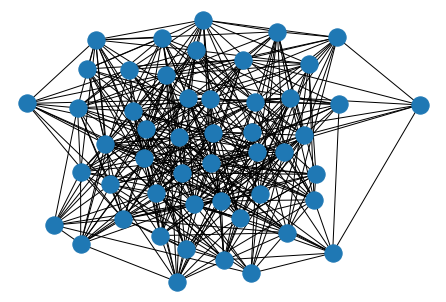

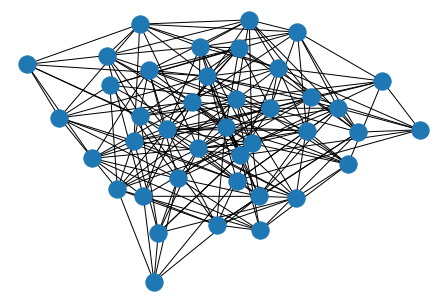

In [1]:
#Erdos-Renyi Graph in Networkx
import numpy as np
from statistics import mean
import random
import copy
from networkx import nx
import matplotlib.pyplot as plt

N = 50  # 50 Indian Cities
K = 10000  # 10000 Agents(people under observation on SIR modeling)
#M = 30  # 30 Edges
NN = 40 # 40 nodes (contact places) of Cities
NUM_TESTS  = K/10 #Number of test available
PAS = 0.3 #Probability of Asymptomatic
PS = 1 - PAS #Probability of Not Asymptomatic(i.e. Symptomatic)


#Graph = nx.gnm_random_graph(N, M)

P = .3      #Probabibilty for Node Connection in random graph
PP = .3
Graph = nx.erdos_renyi_graph(N,P) # Use Networkx to generate a random graph of N nodes being connected with probability P.
GraphN = nx.erdos_renyi_graph(NN,PP)


nx.draw(Graph)
plt.show()
nx.draw(GraphN)
plt.show()

In [2]:
A = nx.adjacency_matrix(Graph)
Adjacency_matrix = A.todense()
AN = nx.adjacency_matrix(GraphN)
Adjacency_matrixN = AN.todense()
print(Adjacency_matrix)
print(Adjacency_matrixN)

[[0 0 1 ... 0 0 0]
 [0 0 0 ... 1 0 1]
 [1 0 0 ... 0 0 0]
 ...
 [0 1 0 ... 0 1 0]
 [0 0 0 ... 1 0 1]
 [0 1 0 ... 0 1 0]]
[[0 0 1 ... 1 1 0]
 [0 0 0 ... 1 0 0]
 [1 0 0 ... 0 0 0]
 ...
 [1 1 0 ... 0 0 1]
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]]


In [3]:
#Empty Node Dictionary [ A Dictionary consisting list of agent states on Graph Nodes]
Node = {}
print(Node)
for i in range(N):
  for j in range(NN):
    Node[i*NN+j] = list()
print(Node)
print(len(Node))


{}
{0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [], 11: [], 12: [], 13: [], 14: [], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [], 21: [], 22: [], 23: [], 24: [], 25: [], 26: [], 27: [], 28: [], 29: [], 30: [], 31: [], 32: [], 33: [], 34: [], 35: [], 36: [], 37: [], 38: [], 39: [], 40: [], 41: [], 42: [], 43: [], 44: [], 45: [], 46: [], 47: [], 48: [], 49: [], 50: [], 51: [], 52: [], 53: [], 54: [], 55: [], 56: [], 57: [], 58: [], 59: [], 60: [], 61: [], 62: [], 63: [], 64: [], 65: [], 66: [], 67: [], 68: [], 69: [], 70: [], 71: [], 72: [], 73: [], 74: [], 75: [], 76: [], 77: [], 78: [], 79: [], 80: [], 81: [], 82: [], 83: [], 84: [], 85: [], 86: [], 87: [], 88: [], 89: [], 90: [], 91: [], 92: [], 93: [], 94: [], 95: [], 96: [], 97: [], 98: [], 99: [], 100: [], 101: [], 102: [], 103: [], 104: [], 105: [], 106: [], 107: [], 108: [], 109: [], 110: [], 111: [], 112: [], 113: [], 114: [], 115: [], 116: [], 117: [], 118: [], 119: [], 120: [], 121: [], 122: [],

In [4]:
#Adding Viral_Index Randomly
for i in range(N):
  for j in range(NN):
    Viral_load=0
    Node[i*NN+j].append({'Viral_load' : Viral_load})
    Node[i*NN+j].append({'S' : 0})
    Node[i*NN+j].append({'I' : 0})
    Node[i*NN+j].append({'R' : 0})
    Node[i*NN+j].append({'ISOLATED_S' : 0})
    Node[i*NN+j].append({'ISOLATED_I' : 0})   
print(Node)
print(len(Node))


{0: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 1: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 2: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 3: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 4: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 5: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 6: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 7: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 8: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 9: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}], 10: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOL

In [5]:
#Initailizing randomly infection state [0 shows Susceptible, 1 shows Infected, and 2 shows Recovered]
Agent = {}
for k in range(K):
  Agent[k] = list() 
for k in range(K):
  Rand_node=random.randint(0,N-1)
  Neighbors = list(Graph.neighbors(Rand_node))
  Rand_nodeN=random.randint(0,NN-1)
  First_nodeN = random.randint(0,NN-1)
  Second_nodeN = random.randint(0,NN-1)
  Rand_state=random.choices([0,1],weights=(98,2),k=1)[0]
  Rand_neighbors = list(GraphN.neighbors(Rand_nodeN))
  Rand_neighbors1 = list(GraphN.neighbors(First_nodeN))
  Rand_neighbors2 = list(GraphN.neighbors(Second_nodeN))
  if len(Rand_neighbors) > 0:
    Rand_nodeN1=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN1)
  else:
    Rand_nodeN1=Rand_nodeN
  
  if len(Rand_neighbors) > 0:
    Rand_nodeN2=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN2)
    if Rand_nodeN2 not in list(GraphN.neighbors(Rand_nodeN1)):
      Rand_nodeN2=Rand_nodeN1
  else:
    Rand_nodeN2=Rand_nodeN1

  Symptom = random.choices([0,1],weights=(PAS,PS), k=1)[0]
  Isolate = 0

  Agent[k].append({'Symptom' : Symptom, 'Isolate' : Isolate})
  
  if Rand_state == 0:
    Node[Rand_node*NN+Rand_nodeN][1]['S']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : [Rand_state,0,0]})
    Agent[k].append({'State' : Rand_state})
  elif Rand_state == 1:
    Node[Rand_node*NN+Rand_nodeN][2]['I']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : [Rand_state,Symptom,Isolate], 'C' : 0})
    Agent[k].append({'State' : Rand_state, 'C' : 0 })

  Agent[k].append({'Home_node' : Rand_node})
  Agent[k].append({'Home_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
  
  if len(Neighbors) > 0:
    First_node = random.choice(Neighbors)
    Neighbors.remove(First_node)
  else:
    First_node = Rand_node
  if len(Neighbors) > 0:
    Second_node = random.choice(Neighbors)
  else:
    Second_node = Rand_node

  if len(Rand_neighbors1) > 0:
    First_nodeN1=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN1)
  else:
    First_nodeN1=First_nodeN
  
  if len(Rand_neighbors1) > 0:
    First_nodeN2=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN2)
    if First_nodeN2 not in list(GraphN.neighbors(First_nodeN1)):
      First_nodeN2=First_nodeN1
  else:
    First_nodeN2=First_nodeN1

  if len(Rand_neighbors2) > 0:
    Second_nodeN1=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN1)
  else:
    Second_nodeN1=Second_nodeN
  
  if len(Rand_neighbors2) > 0:
    Second_nodeN2=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN2)
    if Second_nodeN2 not in list(GraphN.neighbors(Second_nodeN1)):
      Second_nodeN2=Second_nodeN1
  else:
    Second_nodeN2=Second_nodeN1

  Agent[k].append({'First_node' : First_node})
  Agent[k].append({'First_nodeN' : [First_nodeN, First_nodeN1, First_nodeN2]})
  Agent[k].append({'Second_node' : Second_node})
  Agent[k].append({'Second_nodeN' : [Second_nodeN, Second_nodeN1, Second_nodeN2]})
  Agent[k].append({'Current_node' : Rand_node})
  Agent[k].append({'Current_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
print(Node)
print(Agent)

{0: [{'Viral_load': 0}, {'S': 4}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}, {2294: [0, 0, 0]}, {4426: [0, 0, 0]}, {5037: [0, 0, 0]}, {6559: [0, 0, 0]}], 1: [{'Viral_load': 0}, {'S': 6}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}, {136: [0, 0, 0]}, {2664: [0, 0, 0]}, {3311: [0, 0, 0]}, {5592: [0, 0, 0]}, {7110: [0, 0, 0]}, {9527: [0, 0, 0]}], 2: [{'Viral_load': 0}, {'S': 7}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}, {624: [0, 0, 0]}, {1259: [0, 0, 0]}, {2661: [0, 0, 0]}, {3165: [0, 0, 0]}, {3909: [0, 0, 0]}, {4450: [0, 0, 0]}, {7897: [0, 0, 0]}], 3: [{'Viral_load': 0}, {'S': 7}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}, {683: [0, 0, 0]}, {4300: [0, 0, 0]}, {5159: [0, 0, 0]}, {6473: [0, 0, 0]}, {7621: [0, 0, 0]}, {8225: [0, 0, 0]}, {8422: [0, 0, 0]}], 4: [{'Viral_load': 0}, {'S': 7}, {'I': 0}, {'R': 0}, {'ISOLATED_S': 0}, {'ISOLATED_I': 0}, {455: [0, 0, 0]}, {557: [0, 0, 0]}, {748: [0, 0, 0]}, {6399: [0, 0, 0]}, {6804: [0, 0, 

In [6]:
print(len(Graph.nodes))
print(len(GraphN.nodes))

50
40


In [7]:
#Random Walk Implementation
def random_walk(Graph=Graph, GraphN=GraphN, Node=Node, Agent=Agent, num_walks=1, num_steps=1, num_tests=K):
    walks = list()
    Node_next = {}
    Agent_next = {}
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j] = list() 
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j].append({'Viral_load' : copy.deepcopy(Node[i*len(GraphN.nodes)+j][0]['Viral_load']*.5)})
        Node_next[i*len(GraphN.nodes)+j].append({'S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'I' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'R' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'ISOLATED_S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'ISOLATED_I' : 0})
    for i in range(len(Agent)):
      Agent_next[i] = list()
    Agent_next = copy.deepcopy(Agent)
    count_nomove=0
    count_move_first=0
    count_move_second=0
    count_stay_home=0
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        for agent in list(range(6,len(Node[i*len(GraphN.nodes)+j]))):
          a_id = list(Node[i*len(GraphN.nodes)+j][agent].keys())[0]
          #print(a_id)
          #print(Agent[a_id])
          for walk in range(num_walks):
              curr_walk = [i*len(GraphN.nodes)+j]
              cur = i*len(GraphN.nodes)+j
              for step in range(num_steps):
                  neighbors = []
                  neighbors.append(Agent_next[a_id][2]['Home_node'])
                  neighbors.append(Agent_next[a_id][4]['First_node'])
                  neighbors.append(Agent_next[a_id][6]['Second_node'])

                  if len(neighbors) > 0:  
                      I1=(Node[Agent_next[a_id][5]['First_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][5]['First_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][5]['First_nodeN'][2]][2]['I'])
                      I2=(Node[Agent_next[a_id][7]['Second_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][7]['Second_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][7]['Second_nodeN'][2]][2]['I'])
                      IH=(Node[Agent_next[a_id][3]['Home_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][3]['Home_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][3]['Home_nodeN'][2]][2]['I'])
                      V1 = (Node[Agent_next[a_id][5]['First_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][5]['First_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][5]['First_nodeN'][2]][0]['Viral_load'])
                      V2 = (Node[Agent_next[a_id][7]['Second_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][7]['Second_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][7]['Second_nodeN'][2]][0]['Viral_load'])
                      VH = (Node[Agent_next[a_id][3]['Home_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][3]['Home_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][3]['Home_nodeN'][2]][0]['Viral_load'])
                      P1 = I1/(I1**2 + .01) + V1/(V1**2+.01)
                      P2 = I2/(I2**2 + .01) + V2/(V2**2+.01)
                      PH = IH/(IH**2 + .01) + VH/(VH**2+.01)
                      if max(P1,P2,PH) == PH:
                        PH = 3*PH
                        P1 = P1/3
                        P2 = P2/3
                      elif max(P1,P2,PH) == P1:
                        P1 = P1
                        P2 = P2
                        PH = 3*PH
                      else:
                        P1 = P1
                        P2 = P2
                        PH = 3*PH
                      P = P1 + P2 + PH                      
                      if P == 0:
                        PNN1 = 1
                        PNN2 = 0
                        PNN3 = 0
                      else:
                        PNN1 = PH/P 
                        PNN2 = P1/P
                        PNN3 = P2/P 
                      #next = random.choices(neighbors,weights=(PNN1,PNN2,PNN3), k=1)[0] 
                      next = random.choices(neighbors,weights=(.95,.025,.025), k=1)[0]
                      if next == Agent_next[a_id][8]['Current_node']:
                        #print("no movement")
                        count_nomove+=1

                      else:
                        if next == Agent_next[a_id][4]['First_node']:
                          Agent_next[a_id][8]['Current_node'] = Agent_next[a_id][4]['First_node']
                          Agent_next[a_id][9]['Current_nodeN'][0] = Agent_next[a_id][5]['First_nodeN'][0]
                          Agent_next[a_id][9]['Current_nodeN'][1] = Agent_next[a_id][5]['First_nodeN'][1]
                          Agent_next[a_id][9]['Current_nodeN'][2] = Agent_next[a_id][5]['First_nodeN'][2]
                          count_move_first+=1
                        elif next == Agent_next[a_id][6]['Second_node']:
                          Agent_next[a_id][8]['Current_node'] = Agent_next[a_id][6]['Second_node']
                          Agent_next[a_id][9]['Current_nodeN'][0] = Agent_next[a_id][7]['Second_nodeN'][0]
                          Agent_next[a_id][9]['Current_nodeN'][1] = Agent_next[a_id][7]['Second_nodeN'][1]
                          Agent_next[a_id][9]['Current_nodeN'][2] = Agent_next[a_id][7]['Second_nodeN'][2]
                          count_move_second+=1
                        elif next == Agent_next[a_id][2]['Home_node']:
                          Agent_next[a_id][8]['Current_node'] = Agent_next[a_id][2]['Home_node']
                          Agent_next[a_id][9]['Current_nodeN'][0] = Agent_next[a_id][3]['Home_nodeN'][0]
                          Agent_next[a_id][9]['Current_nodeN'][1] = Agent_next[a_id][3]['Home_nodeN'][1]
                          Agent_next[a_id][9]['Current_nodeN'][2] = Agent_next[a_id][3]['Home_nodeN'][2]
                          count_stay_home+=1
                      I2 = Node[Agent_next[a_id][9]['Current_nodeN'][1]][2]['I']
                      I3 = Node[Agent_next[a_id][9]['Current_nodeN'][2]][2]['I']
                      I1 = Node[Agent_next[a_id][9]['Current_nodeN'][0]][2]['I']
                      V2 = Node[Agent_next[a_id][9]['Current_nodeN'][1]][0]['Viral_load']
                      V3 = Node[Agent_next[a_id][9]['Current_nodeN'][2]][0]['Viral_load']
                      V1 = Node[Agent_next[a_id][9]['Current_nodeN'][0]][0]['Viral_load']
                      P2 = I2/(I2**2 + .01) + V2/(V2**2+.01)
                      P3 = I3/(I3**2 + .01) + V3/(V3**2+.01)
                      P1 = I1/(I1**2 + .01) + V1/(V1**2+.01)
                      if max(P1,P2,P3) == P1:
                        P1 = 3*P1
                        P2 = P2
                        P3 = P3
                      elif max(P1,P2,P3) == P2:
                        P1 = 3*P1
                        P2 = 2*P2
                        P3 = P1
                      else:
                        P1 = 3*P1
                        P2 = P2
                        P3 = 2*P3
                      P = P1+P2+P3
                      if P == 0:
                        PNN1 = 1
                        PNN2 = 0
                        PNN3 = 0
                      else:
                        PNN1=P1/P
                        PNN2=P2/P
                        PNN3=P3/P
                       
                      #nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(PNN1,PNN2,PNN3),k=1)[0]
                      nextn = random.choices(Agent_next[a_id][9]['Current_nodeN'],weights=(.90,.05,.05),k=1)[0]                    
                  nex = next*len(GraphN.nodes)+nextn
          Node_next[nex].append(copy.deepcopy(Node[cur][agent]))
          if Node[cur][agent][a_id][0] == 0:
            Node_next[nex][1]['S']+=1
          elif Node[cur][agent][a_id][0] == 1:
            Node_next[nex][2]['I']+=1
            Node_next[nex][-1]['C']+=1
            if nex != cur:
              Node_next[cur][0]['Viral_load']+=1
          elif Node[cur][agent][a_id][0] == 2:
            Node_next[nex][3]['R']+=1

          if Node[cur][agent][a_id][2] == 1:
            if Node[cur][agent][a_id][0] == 1:
              Node_next[nex][5]['ISOLATED_I']+=1

          
          curr_walk.append(nex)
          walks.append(nex)

    #print(Node_next)
    #print(Agent_next)

    #State-transition-logic
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        count_SI=0
        count_IR=0
        Total = Node_next[i*len(GraphN.nodes)+j][1]['S'] - Node_next[i*len(GraphN.nodes)+j][4]['ISOLATED_S'] + Node_next[i*len(GraphN.nodes)+j][2]['I'] - Node_next[i*len(GraphN.nodes)+j][5]['ISOLATED_I'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] + 1
        W1 = (Node_next[i*len(GraphN.nodes)+j][2]['I'] - Node_next[i*len(GraphN.nodes)+j][5]['ISOLATED_I'] + Node_next[i*len(GraphN.nodes)+j][0]['Viral_load'])/Total
        W2 = (Node_next[i*len(GraphN.nodes)+j][1]['S'] - Node_next[i*len(GraphN.nodes)+j][4]['ISOLATED_S'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] - 1)/Total
        for agent in list(range(6,len(Node_next[i*len(GraphN.nodes)+j]))):
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 0:
            Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] = random.choices([1,0], weights=(W1,W2), k=1)[0] 
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
              count_SI+=1
              Node_next[i*len(GraphN.nodes)+j][agent].update({'C' : 0})
              Node_next[i*len(GraphN.nodes)+j][agent][a_id][1] = random.choices([0,1],weights=(PAS,PS), k=1)[0]
              Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] = 0
              Agent_next[a_id][1]['State'] = 1
          elif Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] != 1:
              if Node_next[i*len(GraphN.nodes)+j][agent]['C'] == 4:  #Time-steps of 4 to get cured(I -> R)
                Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] = 2
                count_IR+=1
                Agent_next[a_id][1]['State'] = 2
                Node_next[i*len(GraphN.nodes)+j][agent].pop('C') 
            elif Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] == 1:
              Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] = 2
              count_IR+=1
              Agent_next[a_id][1]['State'] = 2
              Node_next[i*len(GraphN.nodes)+j][agent].pop('C')

        Node_next[i*len(GraphN.nodes)+j][1]['S']-=count_SI
        Node_next[i*len(GraphN.nodes)+j][2]['I']+=(count_SI - count_IR)
        Node_next[i*len(GraphN.nodes)+j][3]['R']+=count_IR 

    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        agents=list(range(6,len(Node_next[i*len(GraphN.nodes)+j])))
        for agent in agents:
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if num_tests > 0:
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id][1] == 1:
              num_tests=num_tests - 1  
              if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
                num_tests=num_tests + 1 
                for agent in agents:
                  a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
                  num_tests=num_tests - 1
                  if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
                    if Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] == 0:
                      Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] = 1
                break 
            

            #elif Node_next[i*len(GraphN.nodes)+j][agent][a_id][1] == 0:
            #  p = random.choices([0,1],weights=(PAS,PS), k=1)[0]
            #  if p == 0:
            #    num_tests=num_tests - 1
            #    if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
            #      if Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] == 0:
            #        Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] = 1




    #print("count_no_movements",count_nomove)
    #print("count_movements_firstnode",count_move_first)
    #print("count_movements_secondnode",count_move_second)
    #print("count_stay_homenode",count_stay_home) 

    return Node,Node_next,Agent,Agent_next,num_tests

In [8]:
def Count_SIR_Node(Node=Node):
  count_S=0
  count_I=0
  count_R=0
  count_ISOLATED_S=0
  count_ISOLATED_I=0
  total_V=0.0
  for i in range(len(Node)):
    count_S+=Node[i][1]['S'] 
    count_I+=Node[i][2]['I']
    count_R+=Node[i][3]['R'] 
    count_ISOLATED_S+=Node[i][4]['ISOLATED_S']
    count_ISOLATED_I+=Node[i][5]['ISOLATED_I']
    total_V+=Node[i][0]['Viral_load']
  return count_S,count_I,count_R,count_ISOLATED_S,count_ISOLATED_I,total_V

In [9]:
def Count_SIR_Agent(Agent=Agent):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Agent)):
    if Agent[i][1]['State'] == 0:
      count_S+=1
    elif Agent[i][1]['State'] == 1:
      count_I+=1
    elif Agent[i][1]['State'] == 2:
      count_R+=1
  return count_S,count_I,count_R 

[9794, 9571, 9415, 9216, 8942, 8563, 8063, 7322, 6454, 5507, 4509, 3489, 2480, 1645, 1029, 636, 419, 301, 219, 183, 159, 149, 138, 128, 126, 125, 124, 120, 119, 117, 116, 116, 115, 114, 110, 106, 106, 106, 106, 106, 106, 106]
[206, 429, 245, 444, 677, 1008, 1352, 1894, 2488, 2639, 3211, 3639, 3974, 3862, 3480, 2853, 1747, 1149, 726, 453, 260, 152, 81, 33, 19, 17, 14, 8, 7, 8, 3, 2, 3, 3, 6, 10, 9, 8, 4, 0, 0, 0]
[0, 0, 340, 340, 381, 429, 585, 784, 1058, 1854, 2280, 2872, 3546, 4493, 5491, 6511, 7834, 8550, 9055, 9364, 9581, 9699, 9781, 9839, 9855, 9858, 9862, 9872, 9874, 9875, 9881, 9882, 9882, 9883, 9884, 9884, 9885, 9886, 9890, 9894, 9894, 9894]
[0.0, 24.0, 111.0, 118.5, 175.25, 279.625, 428.8125, 575.40625, 834.703125, 1107.3515625, 1318.67578125, 1546.337890625, 1763.1689453125, 2002.58447265625, 2060.292236328125, 1949.1461181640625, 1697.5730590820312, 1282.7865295410156, 928.3932647705078, 655.1966323852539, 441.59831619262695, 285.7991580963135, 183.89957904815674, 110.9497895

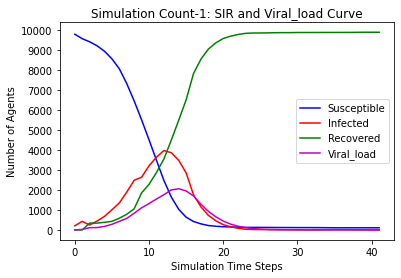

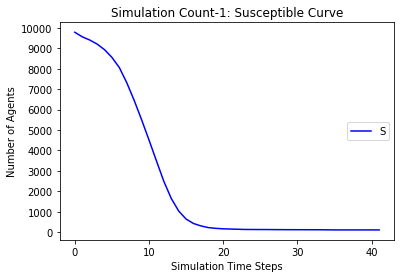

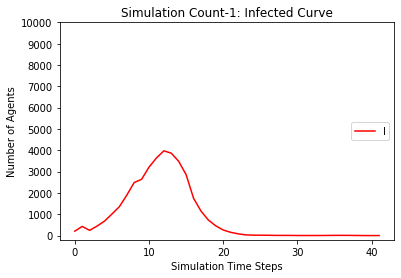

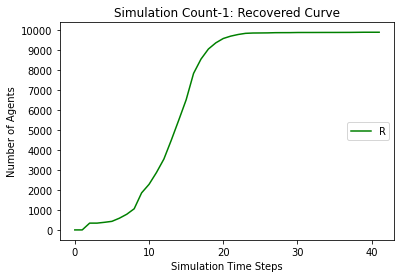

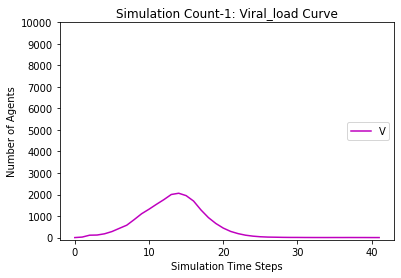

[9794, 9583, 9397, 9188, 8878, 8430, 7827, 7025, 6034, 4998, 3909, 2889, 1965, 1264, 787, 471, 330, 245, 196, 170, 156, 142, 132, 130, 125, 124, 124, 122, 122, 122, 122, 122, 122]
[206, 417, 266, 475, 737, 1153, 1570, 2163, 2844, 2995, 3592, 3954, 4069, 3734, 3122, 2418, 1420, 891, 543, 301, 174, 103, 64, 25, 22, 13, 8, 8, 3, 2, 1, 0, 0]
[0, 0, 337, 337, 385, 417, 603, 812, 1122, 2007, 2499, 3157, 3966, 5002, 6091, 7111, 8250, 8864, 9261, 9529, 9670, 9755, 9804, 9845, 9853, 9863, 9868, 9870, 9875, 9876, 9877, 9878, 9878]
[0.0, 29.0, 143.5, 146.75, 204.375, 312.1875, 452.09375, 682.046875, 931.0234375, 1216.51171875, 1450.255859375, 1750.1279296875, 2006.06396484375, 2163.031982421875, 2090.5159912109375, 1861.2579956054688, 1560.6289978027344, 1156.3144989013672, 795.1572494506836, 526.5786247253418, 342.2893123626709, 220.14465618133545, 129.07232809066772, 79.53616404533386, 45.76808202266693, 26.884041011333466, 16.442020505666733, 9.221010252833366, 5.610505126416683, 5.80525256320

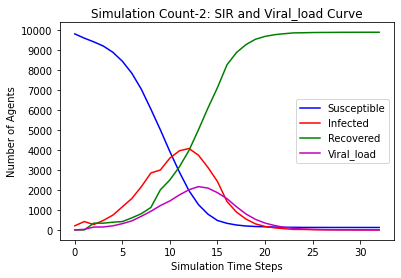

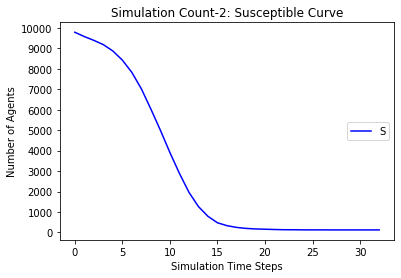

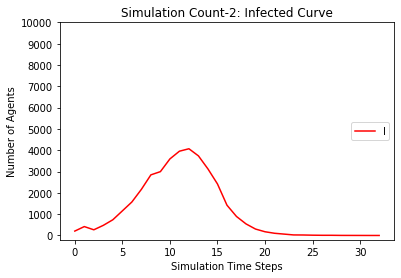

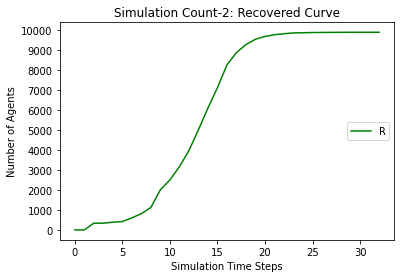

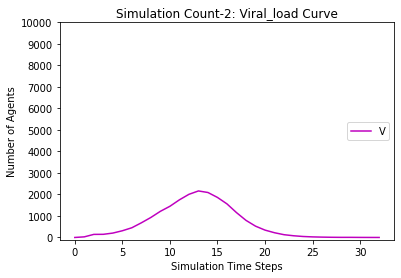

[9794, 9537, 9342, 9119, 8799, 8320, 7671, 6879, 5874, 4815, 3717, 2618, 1769, 1122, 703, 440, 304, 206, 159, 132, 115, 103, 98, 95, 93, 90, 89, 89, 89, 89, 88, 87, 87, 87, 87, 87, 87]
[206, 463, 290, 513, 784, 1217, 1671, 2240, 2925, 3077, 3643, 4087, 4105, 3693, 3014, 2178, 1260, 792, 493, 308, 189, 103, 61, 22, 14, 10, 9, 6, 4, 1, 1, 2, 2, 2, 1, 0, 0]
[0, 0, 368, 368, 417, 463, 658, 881, 1201, 2108, 2640, 3295, 4126, 5185, 6283, 7382, 8436, 9002, 9348, 9560, 9696, 9794, 9841, 9883, 9893, 9900, 9902, 9905, 9907, 9910, 9911, 9911, 9911, 9911, 9912, 9913, 9913]
[0.0, 31.0, 139.5, 140.75, 221.375, 340.6875, 500.34375, 722.171875, 1030.0859375, 1344.04296875, 1559.021484375, 1804.5107421875, 2014.25537109375, 2186.127685546875, 2142.0638427734375, 1874.0319213867188, 1505.0159606933594, 1067.5079803466797, 742.7539901733398, 502.3769950866699, 325.18849754333496, 209.59424877166748, 131.79712438583374, 79.89856219291687, 44.949281096458435, 26.474640548229218, 14.237320274114609, 8.11866

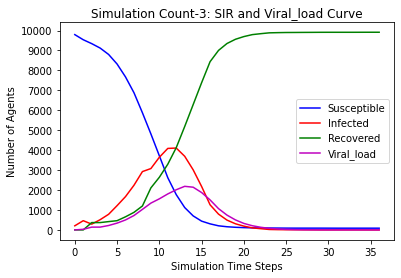

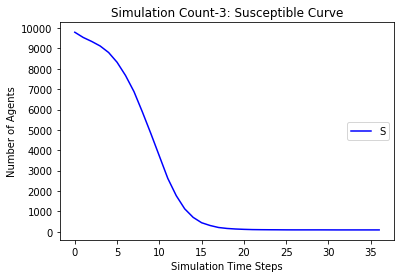

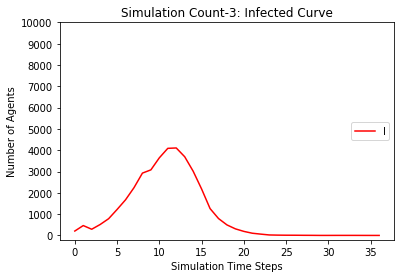

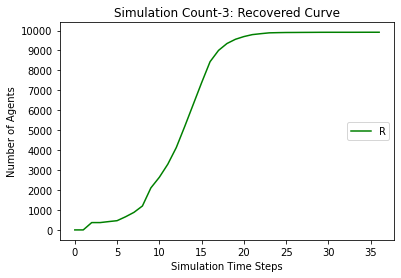

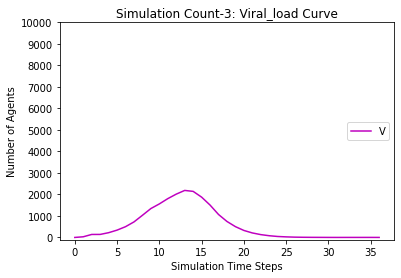

[9794, 9573, 9401, 9200, 8897, 8476, 7866, 7020, 6024, 5002, 3885, 2826, 1904, 1221, 750, 440, 277, 195, 157, 135, 117, 107, 102, 97, 94, 93, 93, 92, 92, 92, 92, 92, 92, 92]
[206, 427, 256, 457, 714, 1097, 1535, 2180, 2873, 3046, 3660, 4008, 4120, 3781, 3135, 2386, 1412, 906, 545, 305, 160, 88, 55, 30, 19, 14, 9, 5, 2, 1, 1, 0, 0, 0]
[0, 0, 343, 343, 389, 427, 599, 800, 1103, 1952, 2455, 3166, 3976, 4998, 6115, 7174, 8311, 8899, 9298, 9560, 9723, 9805, 9843, 9873, 9887, 9893, 9898, 9903, 9906, 9907, 9907, 9908, 9908, 9908]
[0.0, 29.0, 132.5, 136.25, 195.125, 303.5625, 464.78125, 661.390625, 942.6953125, 1290.34765625, 1546.173828125, 1799.0869140625, 1977.54345703125, 2073.771728515625, 2011.8858642578125, 1850.9429321289062, 1580.4714660644531, 1161.2357330322266, 824.6178665161133, 573.3089332580566, 365.6544666290283, 216.82723331451416, 127.41361665725708, 81.70680832862854, 48.85340416431427, 27.426702082157135, 16.713351041078568, 10.356675520539284, 7.178337760269642, 4.58916888

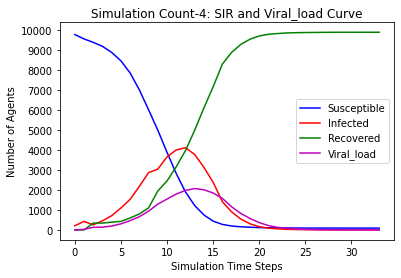

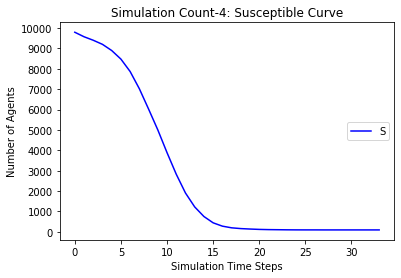

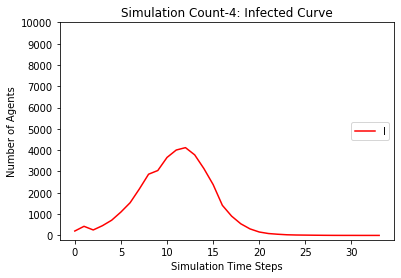

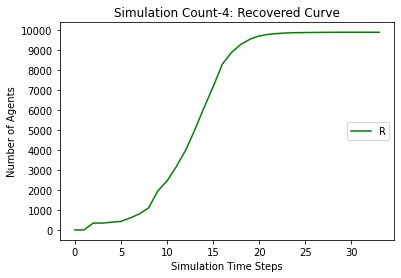

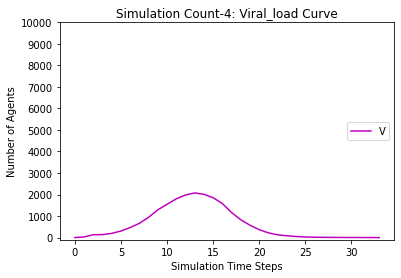

[9794, 9563, 9411, 9197, 8932, 8522, 7931, 7172, 6207, 5193, 4195, 3166, 2215, 1510, 982, 640, 459, 330, 261, 213, 188, 170, 155, 147, 146, 146, 144, 142, 141, 139, 138, 136, 134, 134, 134, 134, 134, 134, 133, 133, 132, 132, 132, 131, 131, 131]
[206, 437, 223, 437, 659, 1041, 1480, 2025, 2725, 2889, 3411, 3813, 3992, 3683, 3213, 2526, 1467, 1004, 651, 427, 271, 160, 106, 38, 23, 13, 11, 5, 5, 7, 5, 5, 7, 5, 4, 2, 0, 0, 1, 1, 2, 2, 1, 2, 0, 0]
[0, 0, 366, 366, 409, 437, 589, 803, 1068, 1918, 2394, 3021, 3793, 4807, 5805, 6834, 8074, 8666, 9088, 9360, 9541, 9670, 9739, 9815, 9831, 9841, 9845, 9853, 9854, 9854, 9857, 9859, 9859, 9861, 9862, 9864, 9866, 9866, 9866, 9866, 9866, 9866, 9867, 9867, 9869, 9869]
[0.0, 27.0, 115.5, 121.75, 175.875, 281.9375, 434.96875, 638.484375, 930.2421875, 1244.12109375, 1455.060546875, 1659.5302734375, 1870.76513671875, 2027.382568359375, 2018.6912841796875, 1850.3456420898438, 1578.1728210449219, 1200.086410522461, 874.0432052612305, 612.0216026306152, 409.

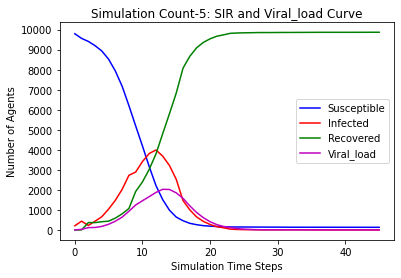

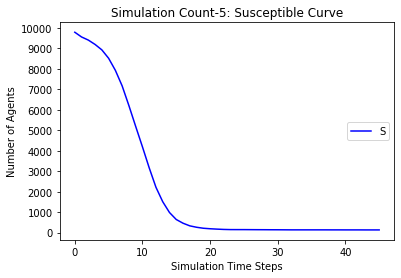

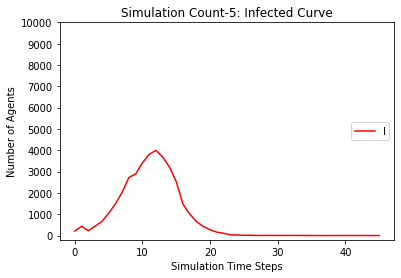

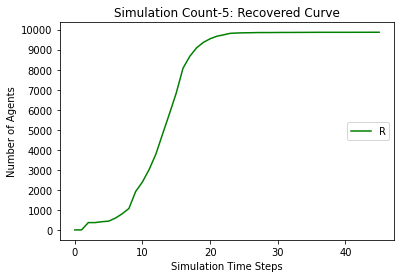

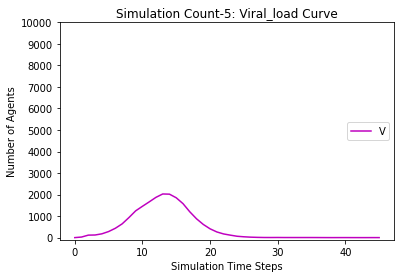

[9794, 9556, 9383, 9192, 8875, 8393, 7743, 6867, 5815, 4759, 3700, 2723, 1861, 1185, 690, 409, 275, 194, 146, 116, 102, 98, 97, 93, 89, 89, 89, 88, 88, 87, 86, 86, 86, 86, 86]
[206, 444, 247, 438, 717, 1163, 1640, 2325, 3060, 3173, 3687, 3937, 3954, 3574, 3010, 2314, 1350, 851, 496, 293, 173, 96, 49, 20, 13, 9, 8, 5, 1, 2, 1, 1, 1, 1, 0]
[0, 0, 370, 370, 408, 444, 617, 808, 1125, 2068, 2613, 3340, 4185, 5241, 6300, 7277, 8375, 8955, 9358, 9591, 9725, 9806, 9854, 9887, 9898, 9902, 9903, 9907, 9911, 9911, 9913, 9913, 9913, 9913, 9914]
[0.0, 26.0, 127.0, 124.5, 182.25, 309.125, 506.5625, 766.28125, 1065.140625, 1407.5703125, 1591.78515625, 1822.892578125, 2023.4462890625, 2090.72314453125, 1998.361572265625, 1775.1807861328125, 1475.5903930664062, 1094.7951965332031, 766.3975982666016, 504.1987991333008, 322.0993995666504, 206.0496997833252, 129.0248498916626, 82.5124249458313, 47.25621247291565, 26.628106236457825, 15.314053118228912, 9.657026559114456, 5.828513279557228, 2.9142566397786

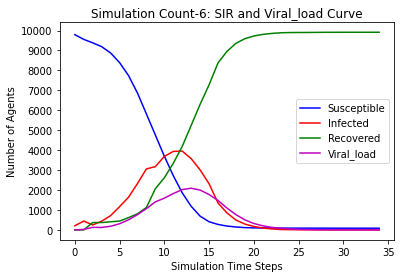

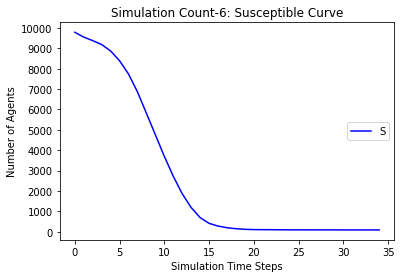

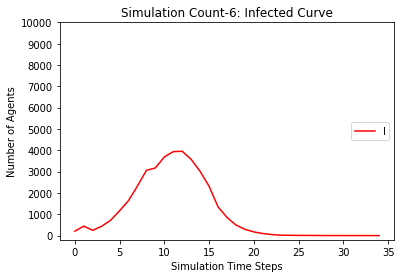

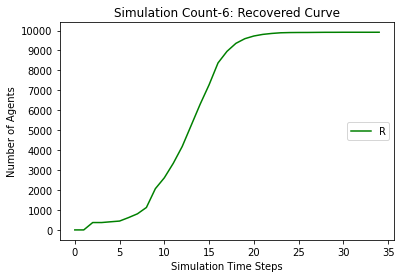

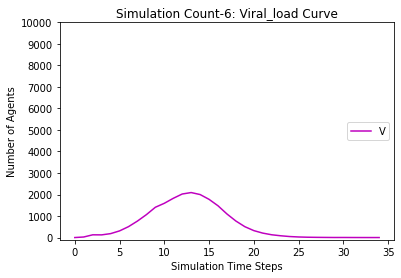

[9794, 9568, 9388, 9149, 8783, 8275, 7596, 6699, 5587, 4492, 3414, 2380, 1573, 975, 574, 353, 256, 211, 177, 152, 140, 132, 125, 122, 118, 118, 118, 118, 118, 118, 118, 118]
[206, 432, 264, 503, 824, 1293, 1792, 2450, 3196, 3361, 3861, 4144, 4014, 3517, 2840, 2027, 1087, 618, 344, 201, 116, 79, 52, 13, 12, 8, 7, 4, 0, 0, 0, 0]
[0, 0, 348, 348, 393, 432, 612, 851, 1217, 2147, 2725, 3476, 4413, 5508, 6586, 7620, 8657, 9171, 9479, 9647, 9744, 9789, 9823, 9865, 9870, 9874, 9875, 9878, 9882, 9882, 9882, 9882]
[0.0, 35.0, 126.5, 141.25, 227.625, 371.8125, 543.90625, 780.953125, 1108.4765625, 1478.23828125, 1680.119140625, 1912.0595703125, 2058.02978515625, 2126.014892578125, 2012.0074462890625, 1779.0037231445312, 1410.5018615722656, 995.2509307861328, 647.6254653930664, 413.8127326965332, 251.9063663482666, 148.9531831741333, 97.47659158706665, 68.73829579353333, 37.36914789676666, 20.68457394838333, 15.342286974191666, 11.671143487095833, 7.835571743547916, 3.917785871773958, 1.95889293588

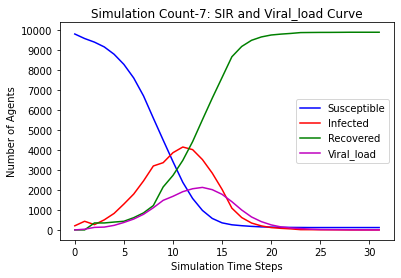

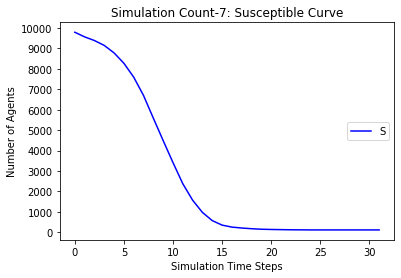

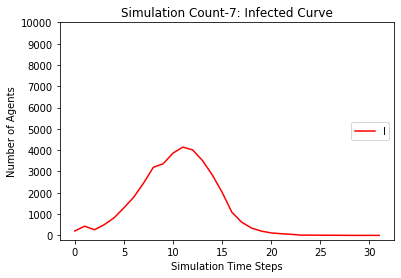

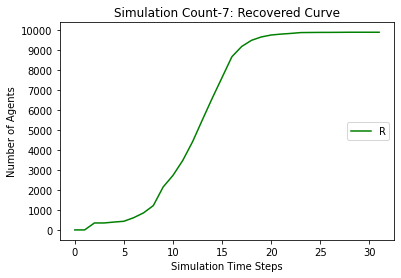

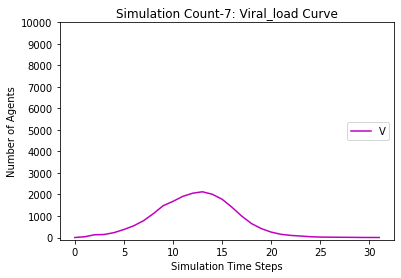

[9794, 9552, 9370, 9123, 8810, 8337, 7713, 6885, 5816, 4703, 3591, 2585, 1681, 1030, 621, 381, 256, 185, 137, 112, 94, 85, 78, 77, 75, 75, 75, 75, 75, 74, 73, 72, 71, 71, 71, 71, 71]
[206, 448, 276, 523, 786, 1215, 1657, 2238, 2994, 3172, 3761, 4087, 4135, 3673, 2970, 2204, 1253, 754, 446, 269, 162, 100, 59, 25, 12, 5, 3, 2, 0, 1, 2, 3, 4, 3, 2, 1, 0]
[0, 0, 354, 354, 404, 448, 630, 877, 1190, 2125, 2648, 3328, 4184, 5297, 6409, 7415, 8491, 9061, 9417, 9619, 9744, 9815, 9863, 9898, 9913, 9920, 9922, 9923, 9925, 9925, 9925, 9925, 9925, 9926, 9927, 9928, 9929]
[0.0, 43.0, 138.5, 147.25, 210.625, 338.3125, 516.15625, 751.078125, 1015.5390625, 1371.76953125, 1564.884765625, 1820.4423828125, 2076.22119140625, 2167.110595703125, 2062.5552978515625, 1785.2776489257812, 1470.6388244628906, 1044.3194122314453, 718.1597061157227, 460.0798530578613, 291.03992652893066, 183.51996326446533, 116.75998163223267, 67.37999081611633, 39.68999540805817, 24.844997704029083, 12.422498852014542, 6.211249426

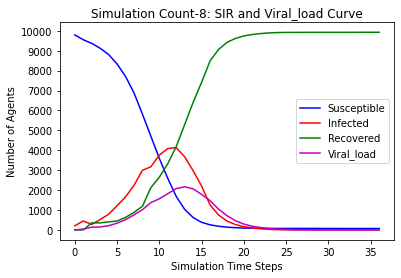

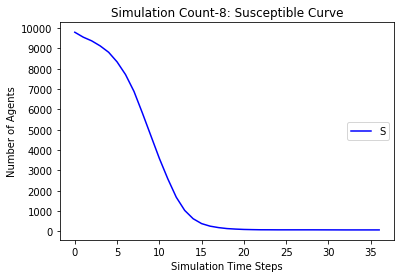

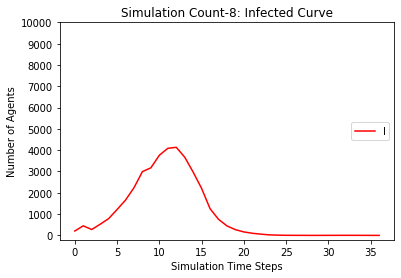

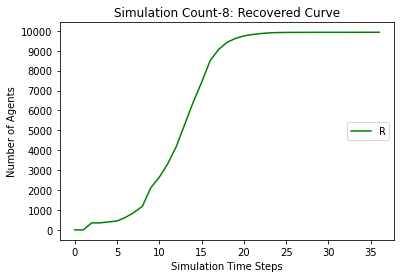

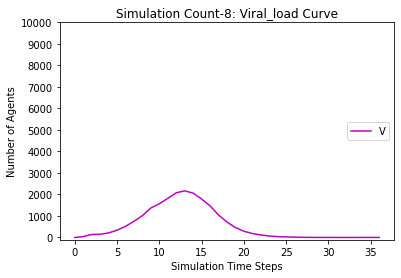

[9794, 9575, 9376, 9147, 8794, 8345, 7683, 6805, 5698, 4614, 3545, 2547, 1716, 1095, 676, 433, 298, 222, 179, 154, 139, 131, 125, 122, 121, 121, 120, 119, 117, 115, 114, 114, 114, 113, 111, 111, 111, 111, 111, 111]
[206, 425, 291, 520, 823, 1230, 1693, 2342, 3096, 3245, 3774, 4048, 3982, 3519, 2869, 2114, 1225, 756, 450, 279, 159, 91, 54, 12, 7, 5, 5, 3, 4, 6, 6, 5, 3, 2, 3, 3, 3, 2, 0, 0]
[0, 0, 333, 333, 383, 425, 624, 853, 1206, 2141, 2681, 3405, 4302, 5386, 6455, 7453, 8477, 9022, 9371, 9567, 9702, 9778, 9821, 9866, 9872, 9874, 9875, 9878, 9879, 9879, 9880, 9881, 9883, 9885, 9886, 9886, 9886, 9887, 9889, 9889]
[0.0, 36.0, 130.0, 144.0, 218.0, 342.0, 527.0, 790.5, 1095.25, 1463.625, 1646.8125, 1854.40625, 2038.203125, 2074.1015625, 1966.05078125, 1782.025390625, 1412.0126953125, 976.00634765625, 678.003173828125, 478.0015869140625, 311.00079345703125, 198.50039672851562, 118.25019836425781, 67.1250991821289, 36.56254959106445, 20.281274795532227, 12.140637397766113, 8.07031869888305

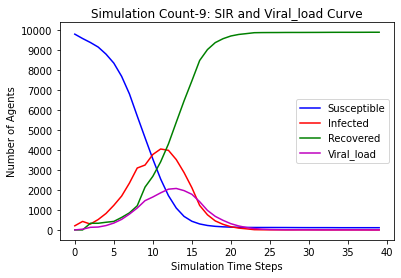

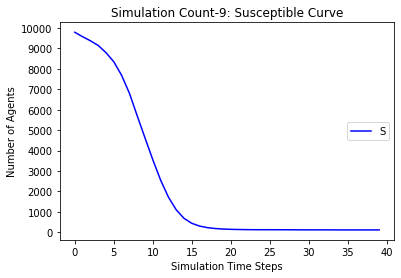

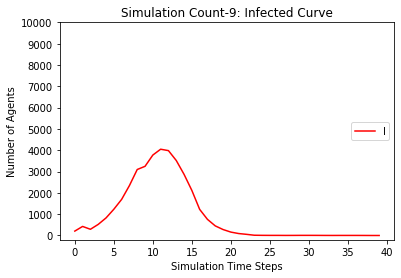

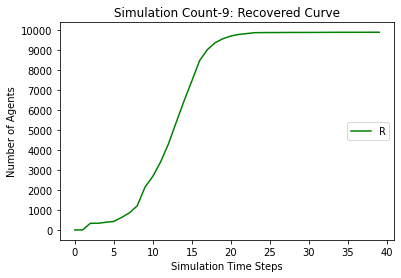

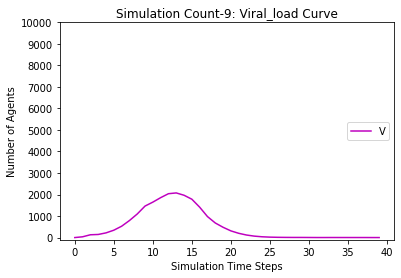

[9794, 9580, 9428, 9254, 8995, 8667, 8188, 7580, 6764, 5869, 4907, 3855, 2868, 2031, 1377, 927, 649, 480, 360, 283, 236, 205, 185, 175, 167, 164, 160, 156, 150, 149, 149, 149, 148, 148, 147, 145, 142, 140, 138, 138, 138, 137, 136, 135, 135, 135, 135]
[206, 420, 207, 381, 605, 913, 1240, 1674, 2231, 2367, 2955, 3530, 3896, 3838, 3530, 2928, 1930, 1372, 942, 644, 413, 275, 175, 73, 49, 32, 25, 19, 17, 15, 4, 2, 1, 1, 2, 4, 6, 8, 9, 7, 4, 3, 2, 3, 1, 1, 0]
[0, 0, 365, 365, 400, 420, 572, 746, 1005, 1764, 2138, 2615, 3236, 4131, 5093, 6145, 7421, 8148, 8698, 9073, 9351, 9520, 9640, 9752, 9784, 9804, 9815, 9825, 9833, 9836, 9847, 9849, 9851, 9851, 9851, 9851, 9852, 9852, 9853, 9855, 9858, 9860, 9862, 9862, 9864, 9864, 9865]
[0.0, 20.0, 119.0, 107.5, 148.75, 236.375, 358.1875, 517.09375, 745.546875, 989.7734375, 1187.88671875, 1434.943359375, 1718.4716796875, 1934.23583984375, 1992.117919921875, 1954.0589599609375, 1778.0294799804688, 1394.0147399902344, 1056.0073699951172, 769.0036849975586

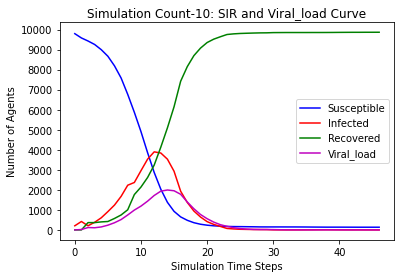

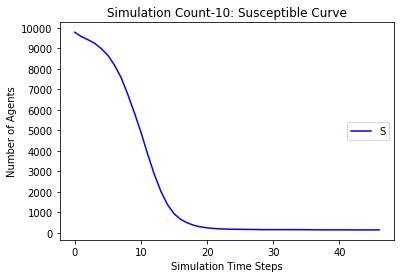

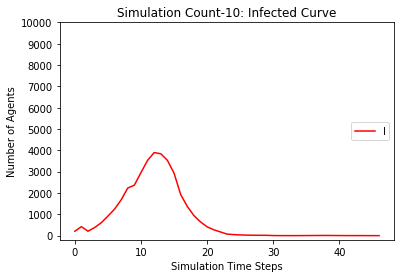

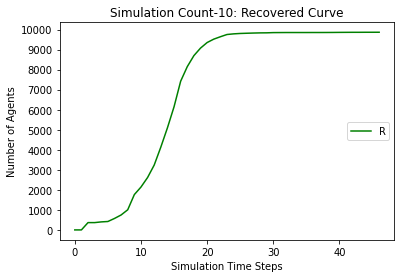

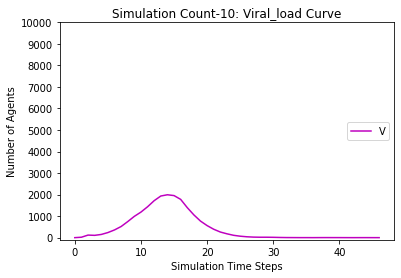

[9794, 9577, 9418, 9209, 8890, 8469, 7894, 7106, 6125, 5083, 4033, 2998, 2056, 1321, 845, 521, 335, 231, 177, 149, 132, 120, 118, 116, 116, 115, 114, 113, 110, 109, 108, 108, 108, 108, 108]
[206, 423, 245, 454, 725, 1108, 1524, 2103, 2765, 2960, 3537, 3925, 4069, 3762, 3188, 2477, 1518, 986, 631, 372, 203, 111, 59, 22, 9, 4, 4, 3, 6, 6, 6, 5, 2, 1, 0]
[0, 0, 337, 337, 385, 423, 582, 791, 1110, 1957, 2430, 3077, 3875, 4917, 5967, 7002, 8147, 8783, 9192, 9479, 9665, 9769, 9823, 9862, 9875, 9881, 9882, 9884, 9884, 9885, 9886, 9887, 9890, 9891, 9892]
[0.0, 31.0, 120.5, 126.25, 187.125, 301.5625, 464.78125, 690.390625, 980.1953125, 1305.09765625, 1541.548828125, 1749.7744140625, 1921.88720703125, 2056.943603515625, 2031.4718017578125, 1885.7359008789062, 1618.8679504394531, 1224.4339752197266, 840.2169876098633, 571.1084938049316, 370.5542469024658, 233.2771234512329, 149.63856172561646, 95.81928086280823, 52.909640431404114, 27.454820215702057, 14.727410107851028, 8.363705053925514, 4.1818

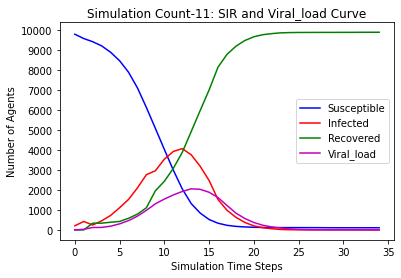

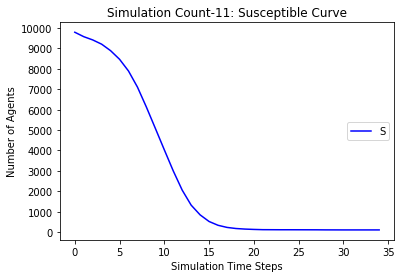

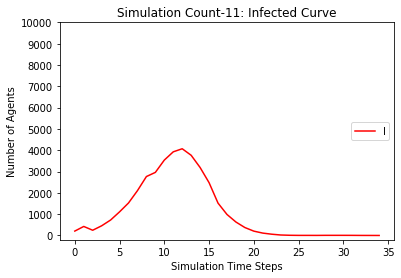

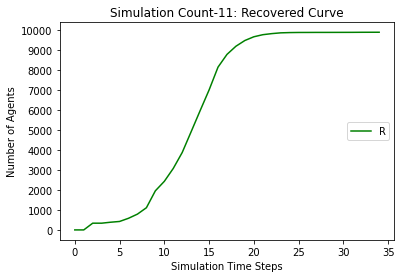

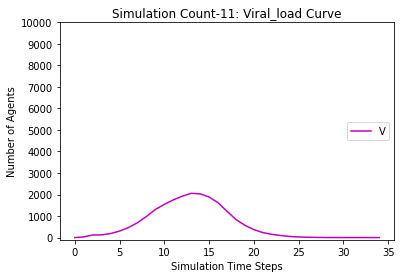

[9794, 9565, 9397, 9195, 8901, 8485, 7907, 7135, 6208, 5264, 4220, 3138, 2195, 1457, 905, 575, 399, 283, 219, 177, 143, 114, 103, 95, 92, 90, 89, 88, 87, 87, 87, 87, 87]
[206, 435, 262, 464, 709, 1080, 1490, 2060, 2693, 2778, 3343, 3799, 4013, 3807, 3315, 2563, 1549, 1023, 621, 398, 256, 169, 116, 47, 34, 19, 14, 7, 5, 3, 0, 0, 0]
[0, 0, 341, 341, 390, 435, 603, 805, 1099, 1958, 2437, 3063, 3792, 4736, 5780, 6862, 8052, 8694, 9160, 9425, 9601, 9717, 9781, 9858, 9874, 9891, 9897, 9905, 9908, 9910, 9913, 9913, 9913]
[0.0, 28.0, 118.0, 125.0, 192.5, 297.25, 458.625, 663.3125, 931.65625, 1232.828125, 1424.4140625, 1689.20703125, 1883.603515625, 2069.8017578125, 2056.90087890625, 1909.450439453125, 1604.7252197265625, 1194.3626098632812, 834.1813049316406, 563.0906524658203, 376.54532623291016, 247.27266311645508, 167.63633155822754, 121.81816577911377, 77.90908288955688, 52.95454144477844, 30.47727072238922, 16.23863536119461, 9.119317680597305, 5.559658840298653, 3.7798294201493263, 1.889

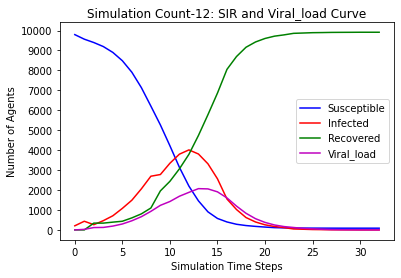

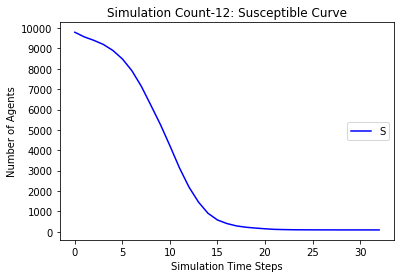

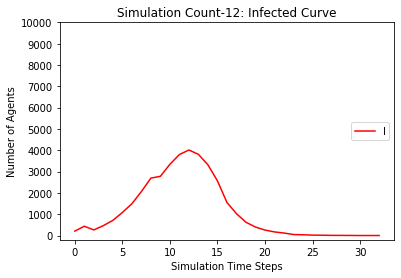

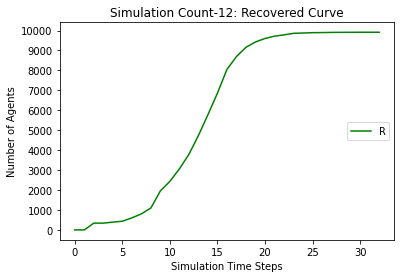

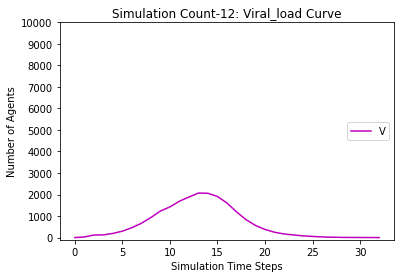

[9794, 9553, 9354, 9096, 8731, 8236, 7540, 6646, 5607, 4564, 3465, 2432, 1657, 1084, 706, 444, 320, 232, 189, 164, 140, 121, 112, 106, 100, 97, 97, 95, 95, 95, 95, 95, 95]
[206, 447, 287, 545, 863, 1317, 1814, 2450, 3124, 3280, 3777, 4051, 3950, 3480, 2759, 1988, 1138, 741, 465, 280, 180, 111, 77, 43, 30, 21, 15, 11, 5, 2, 2, 0, 0]
[0, 0, 359, 359, 406, 447, 646, 904, 1269, 2156, 2758, 3517, 4393, 5436, 6535, 7568, 8542, 9027, 9346, 9556, 9680, 9768, 9811, 9851, 9870, 9882, 9888, 9894, 9900, 9903, 9903, 9905, 9905]
[0.0, 32.0, 146.0, 161.0, 246.5, 362.25, 563.125, 750.5625, 1013.28125, 1368.640625, 1605.3203125, 1880.66015625, 2129.330078125, 2153.6650390625, 2006.83251953125, 1727.416259765625, 1370.7081298828125, 990.3540649414062, 710.1770324707031, 477.08851623535156, 318.5442581176758, 209.2721290588379, 131.63606452941895, 88.81803226470947, 55.409016132354736, 37.70450806617737, 21.852254033088684, 14.926127016544342, 11.463063508272171, 5.7315317541360855, 2.8657658770680428, 1

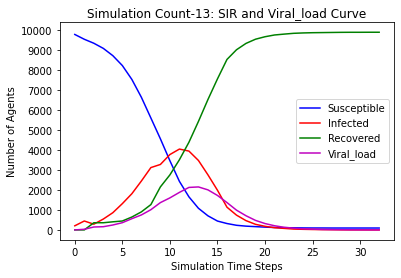

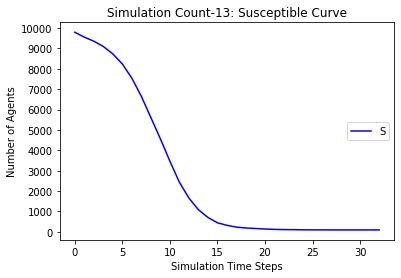

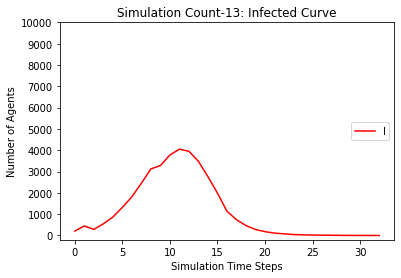

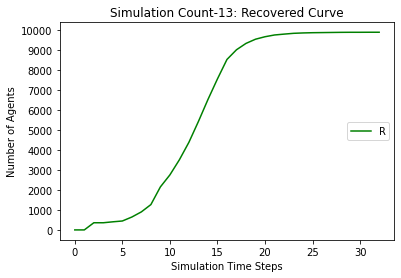

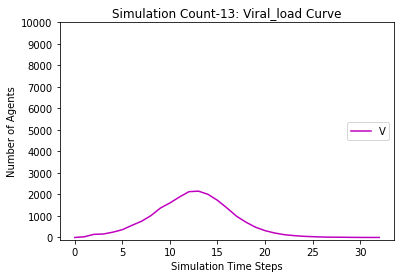

[9794, 9576, 9401, 9179, 8853, 8398, 7707, 6834, 5774, 4715, 3610, 2546, 1638, 1038, 619, 400, 268, 192, 150, 128, 105, 95, 90, 80, 76, 75, 75, 75, 75, 75, 74, 74, 73, 73, 73, 73, 73]
[206, 424, 266, 488, 768, 1178, 1694, 2345, 3079, 3216, 3758, 4095, 4136, 3677, 2991, 2146, 1153, 723, 424, 272, 163, 97, 60, 29, 21, 18, 15, 5, 1, 0, 1, 1, 2, 2, 1, 1, 0]
[0, 0, 333, 333, 379, 424, 599, 821, 1147, 2069, 2632, 3359, 4226, 5285, 6390, 7454, 8579, 9085, 9426, 9600, 9732, 9808, 9850, 9891, 9903, 9907, 9910, 9920, 9924, 9925, 9925, 9925, 9925, 9925, 9926, 9926, 9927]
[0.0, 31.0, 131.5, 147.75, 225.875, 351.9375, 531.96875, 781.984375, 1070.9921875, 1391.49609375, 1591.748046875, 1834.8740234375, 2001.43701171875, 2102.718505859375, 2012.3592529296875, 1759.1796264648438, 1405.5898132324219, 992.7949066162109, 691.3974533081055, 452.69872665405273, 290.34936332702637, 197.17468166351318, 124.58734083175659, 74.2936704158783, 40.14683520793915, 23.073417603969574, 17.536708801984787, 14.7683544

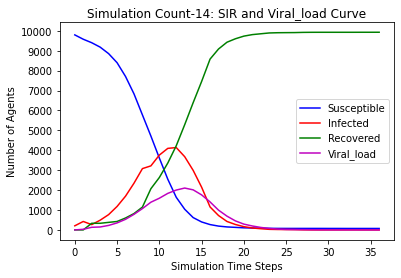

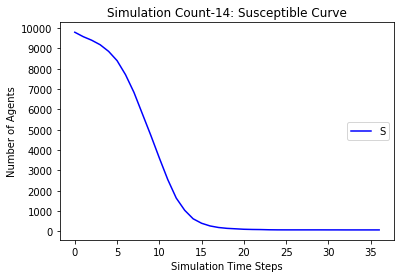

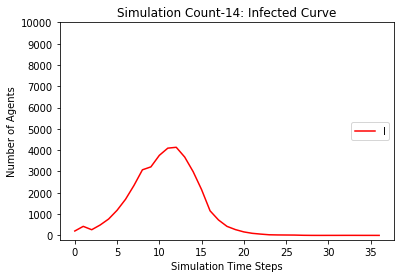

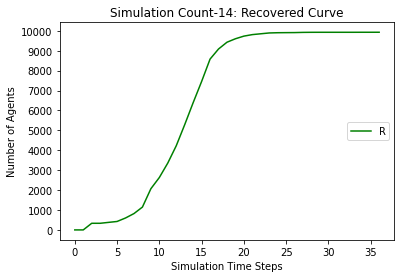

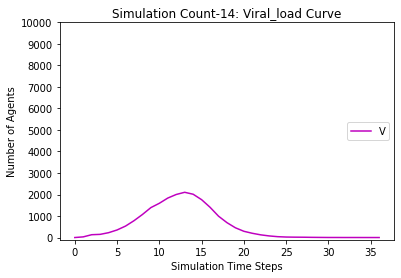

[9794, 9574, 9392, 9170, 8838, 8412, 7762, 6988, 5961, 4951, 3929, 2925, 2052, 1334, 838, 529, 351, 261, 214, 182, 156, 146, 136, 135, 133, 133, 132, 131, 130, 130, 130, 130, 130]
[206, 426, 272, 494, 776, 1162, 1630, 2182, 2877, 2993, 3494, 3871, 3909, 3617, 3091, 2396, 1480, 944, 569, 347, 195, 115, 78, 36, 18, 11, 4, 4, 3, 3, 0, 0, 0]
[0, 0, 336, 336, 386, 426, 608, 830, 1162, 2056, 2577, 3204, 4039, 5049, 6071, 7075, 8169, 8795, 9217, 9471, 9649, 9739, 9786, 9829, 9849, 9856, 9864, 9865, 9867, 9867, 9870, 9870, 9870]
[0.0, 31.0, 124.5, 133.25, 212.625, 342.3125, 509.15625, 744.578125, 998.2890625, 1290.14453125, 1521.072265625, 1730.5361328125, 1896.26806640625, 1977.134033203125, 1987.5670166015625, 1849.7835083007812, 1558.8917541503906, 1154.4458770751953, 817.2229385375977, 559.6114692687988, 377.8057346343994, 242.9028673171997, 157.45143365859985, 107.72571682929993, 66.86285841464996, 37.43142920732498, 21.71571460366249, 11.857857301831245, 8.928928650915623, 6.464464325457

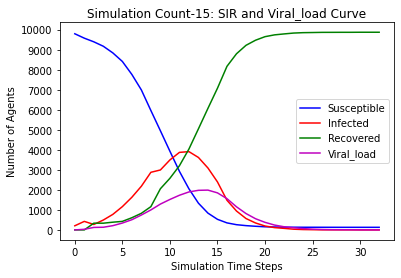

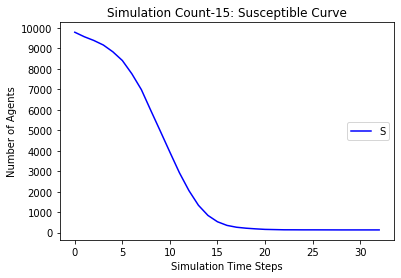

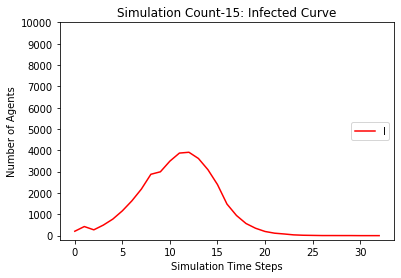

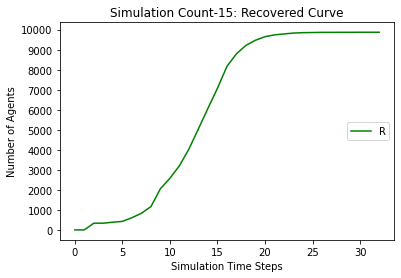

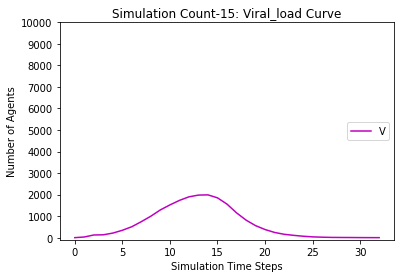

[9794, 9584, 9432, 9247, 8949, 8546, 7947, 7191, 6213, 5192, 4157, 3115, 2154, 1446, 921, 588, 410, 315, 246, 208, 172, 155, 147, 141, 139, 135, 130, 129, 128, 123, 121, 120, 119, 119, 119, 119, 119]
[206, 416, 219, 404, 662, 1038, 1485, 2056, 2736, 2884, 3424, 3865, 4059, 3746, 3236, 2527, 1549, 1020, 622, 380, 238, 160, 99, 53, 25, 15, 17, 12, 11, 12, 8, 8, 8, 4, 2, 1, 0]
[0, 0, 349, 349, 389, 416, 568, 753, 1051, 1924, 2419, 3020, 3787, 4808, 5843, 6885, 8041, 8665, 9132, 9412, 9590, 9685, 9754, 9806, 9836, 9850, 9853, 9859, 9861, 9865, 9871, 9872, 9873, 9877, 9879, 9880, 9881]
[0.0, 22.0, 114.0, 124.0, 196.0, 287.0, 426.5, 645.25, 896.625, 1236.3125, 1429.15625, 1637.578125, 1896.7890625, 2082.39453125, 2080.197265625, 1910.0986328125, 1601.04931640625, 1174.524658203125, 849.2623291015625, 594.6311645507812, 410.3155822753906, 271.1577911376953, 173.57889556884766, 109.78944778442383, 67.89472389221191, 41.94736194610596, 25.97368097305298, 17.98684048652649, 10.993420243263245, 1

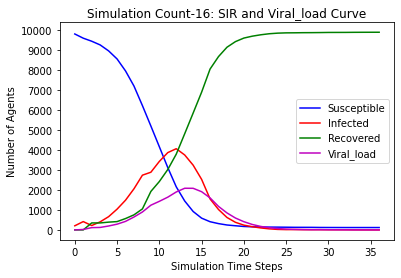

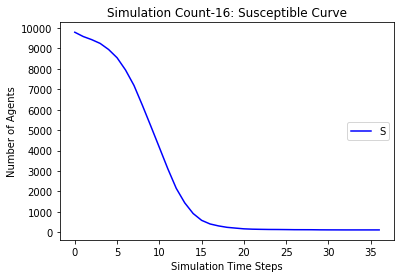

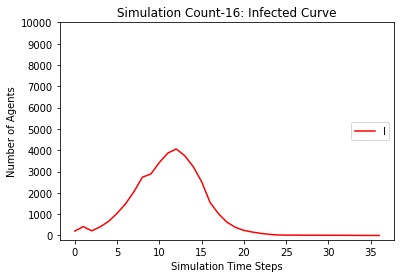

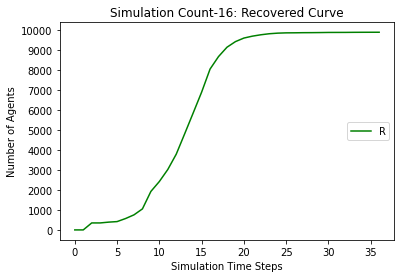

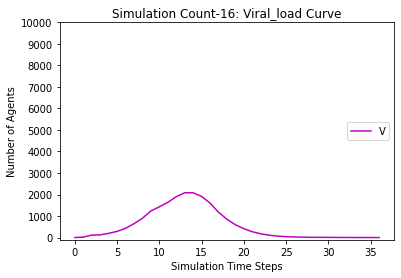

[9794, 9526, 9315, 9043, 8661, 8137, 7397, 6420, 5246, 4173, 3154, 2213, 1457, 884, 545, 326, 238, 178, 141, 117, 101, 89, 85, 83, 82, 82, 81, 81, 81, 81, 81, 81]
[206, 474, 324, 596, 923, 1389, 1918, 2623, 3415, 3490, 3884, 4008, 3789, 3289, 2609, 1887, 1063, 623, 369, 209, 137, 89, 56, 19, 10, 4, 4, 2, 1, 1, 0, 0]
[0, 0, 361, 361, 416, 474, 685, 957, 1339, 2337, 2962, 3779, 4754, 5827, 6846, 7787, 8699, 9199, 9490, 9674, 9762, 9822, 9859, 9898, 9908, 9914, 9915, 9917, 9918, 9918, 9919, 9919]
[0.0, 37.0, 145.5, 164.75, 245.375, 361.6875, 566.84375, 858.421875, 1167.2109375, 1515.60546875, 1738.802734375, 1931.4013671875, 2037.70068359375, 2023.850341796875, 1885.9251708984375, 1595.9625854492188, 1261.9812927246094, 913.9906463623047, 596.9953231811523, 388.4976615905762, 244.2488307952881, 153.12441539764404, 95.56220769882202, 64.78110384941101, 35.390551924705505, 21.695275962352753, 12.847637981176376, 8.423818990588188, 5.211909495294094, 2.605954747647047, 1.3029773738235235, 0.

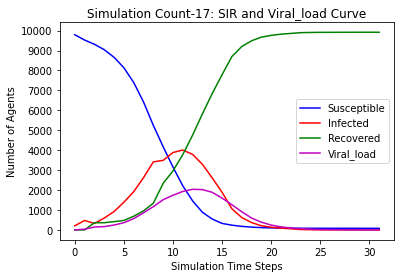

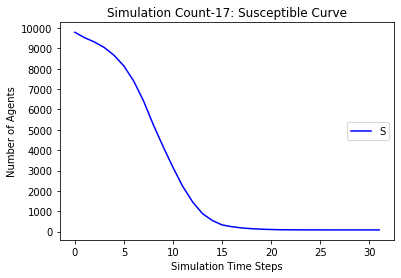

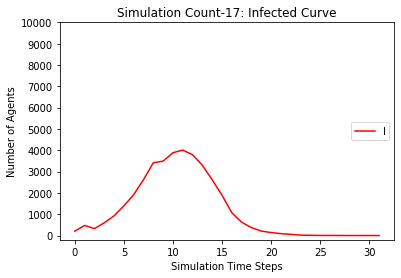

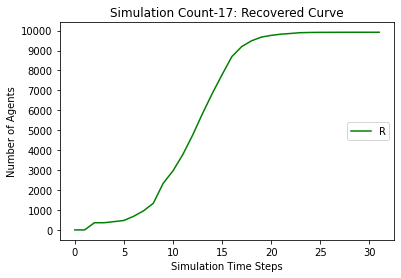

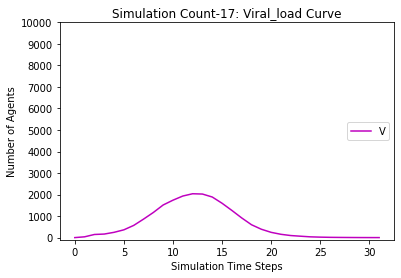

[9794, 9551, 9369, 9152, 8819, 8389, 7779, 6943, 5890, 4804, 3732, 2684, 1816, 1128, 684, 424, 303, 229, 190, 164, 148, 137, 129, 126, 125, 122, 122, 122, 119, 119, 119, 119, 119]
[206, 449, 270, 487, 774, 1162, 1590, 2209, 2929, 3169, 3732, 4079, 4074, 3676, 3048, 2260, 1289, 774, 446, 260, 155, 92, 61, 30, 20, 15, 7, 4, 6, 3, 1, 1, 0]
[0, 0, 361, 361, 407, 449, 631, 848, 1181, 2027, 2536, 3237, 4110, 5196, 6268, 7316, 8408, 8997, 9364, 9576, 9697, 9771, 9810, 9844, 9855, 9863, 9871, 9874, 9875, 9878, 9880, 9880, 9881]
[0.0, 30.0, 127.0, 139.5, 187.75, 307.875, 496.9375, 707.46875, 993.734375, 1370.8671875, 1597.43359375, 1798.716796875, 2017.3583984375, 2107.67919921875, 1995.839599609375, 1826.9197998046875, 1545.4598999023438, 1114.7299499511719, 753.3649749755859, 489.68248748779297, 316.8412437438965, 200.42062187194824, 116.21031093597412, 68.10515546798706, 43.05257773399353, 25.526288866996765, 13.763144433498383, 8.881572216749191, 4.440786108374596, 4.220393054187298, 3.1101

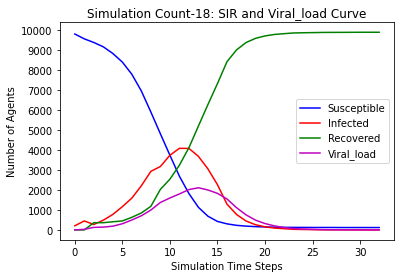

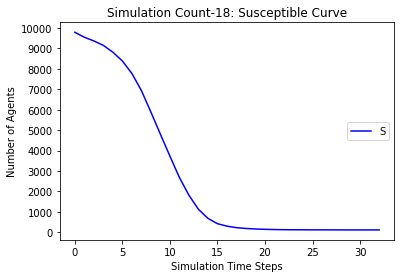

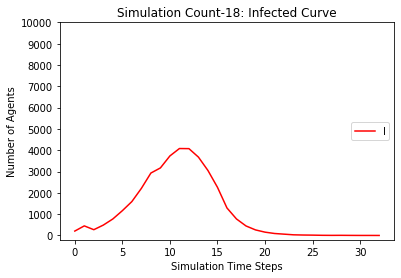

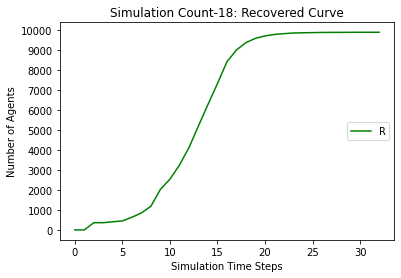

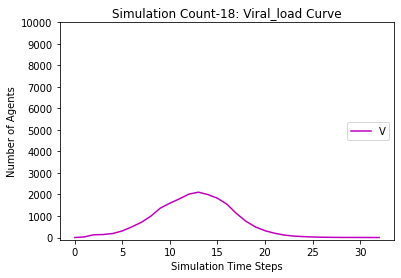

[9794, 9577, 9423, 9228, 8924, 8496, 7958, 7229, 6280, 5260, 4220, 3240, 2298, 1521, 969, 602, 415, 311, 265, 221, 193, 163, 144, 135, 133, 127, 123, 121, 120, 118, 117, 116, 116, 116, 116, 116, 116]
[206, 423, 222, 417, 680, 1081, 1465, 1999, 2644, 2791, 3388, 3796, 3982, 3739, 3251, 2638, 1581, 1034, 637, 381, 222, 148, 121, 63, 45, 30, 21, 14, 13, 9, 3, 3, 3, 2, 1, 0, 0]
[0, 0, 355, 355, 396, 423, 577, 772, 1076, 1949, 2392, 2964, 3720, 4740, 5780, 6760, 8004, 8655, 9098, 9398, 9585, 9689, 9735, 9802, 9822, 9843, 9856, 9865, 9867, 9873, 9880, 9881, 9881, 9882, 9883, 9884, 9884]
[0.0, 23.0, 111.5, 126.75, 184.375, 300.1875, 471.09375, 688.546875, 942.2734375, 1245.13671875, 1410.568359375, 1600.2841796875, 1846.14208984375, 2001.071044921875, 1985.5355224609375, 1826.7677612304688, 1594.3838806152344, 1224.1919403076172, 894.0959701538086, 611.0479850769043, 395.52399253845215, 250.76199626922607, 162.38099813461304, 104.19049906730652, 64.09524953365326, 46.04762476682663, 31.023812

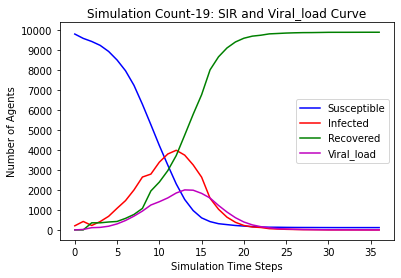

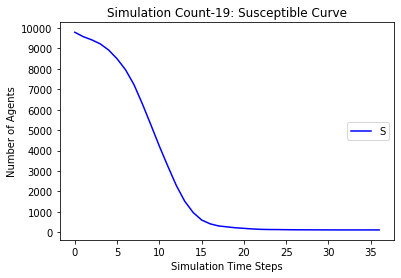

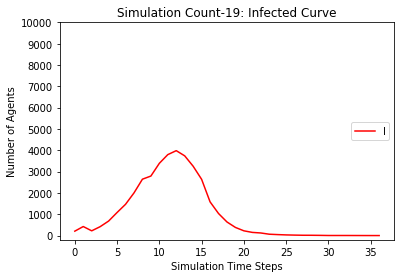

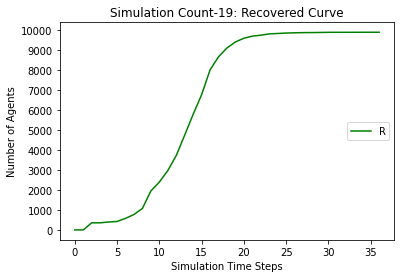

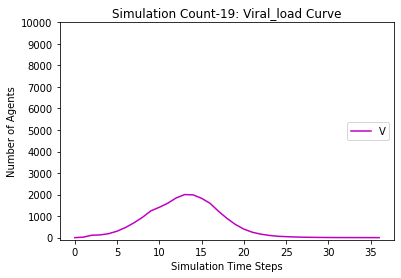

[9794, 9550, 9390, 9185, 8902, 8494, 7942, 7224, 6301, 5349, 4288, 3233, 2229, 1445, 893, 538, 353, 249, 189, 140, 116, 95, 83, 79, 77, 75, 73, 72, 71, 70, 69, 69, 67, 66, 65, 65, 65, 65, 65]
[206, 450, 248, 453, 692, 1056, 1448, 1961, 2601, 2718, 3331, 3798, 4072, 3904, 3395, 2695, 1602, 1028, 633, 398, 237, 154, 106, 36, 25, 14, 10, 7, 6, 5, 4, 3, 4, 4, 4, 4, 2, 1, 0]
[0, 0, 362, 362, 406, 450, 610, 815, 1098, 1933, 2381, 2969, 3699, 4651, 5712, 6767, 8045, 8723, 9178, 9462, 9647, 9751, 9811, 9885, 9898, 9911, 9917, 9921, 9923, 9925, 9927, 9928, 9929, 9930, 9931, 9931, 9933, 9934, 9935]
[0.0, 28.0, 122.0, 128.0, 177.0, 285.5, 422.75, 621.375, 865.6875, 1132.84375, 1342.421875, 1583.2109375, 1842.60546875, 2006.302734375, 2000.1513671875, 1855.07568359375, 1646.537841796875, 1245.2689208984375, 911.6344604492188, 622.8172302246094, 414.4086151123047, 270.20430755615234, 176.10215377807617, 114.05107688903809, 67.02553844451904, 40.51276922225952, 22.25638461112976, 15.12819230556488, 

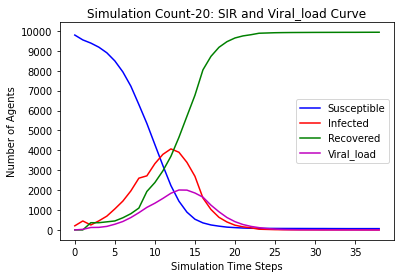

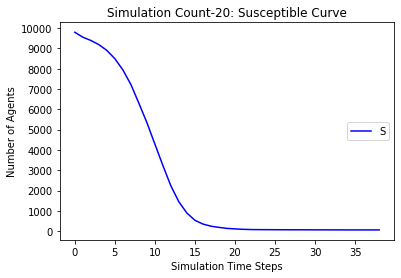

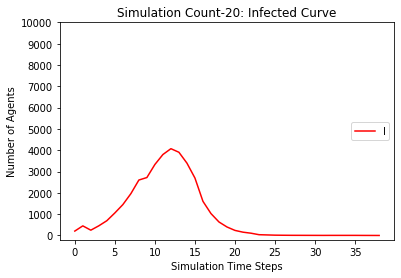

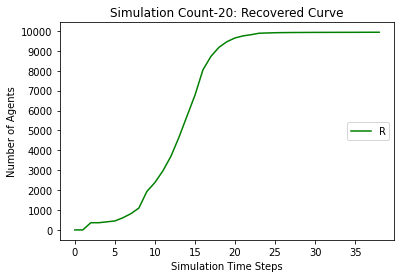

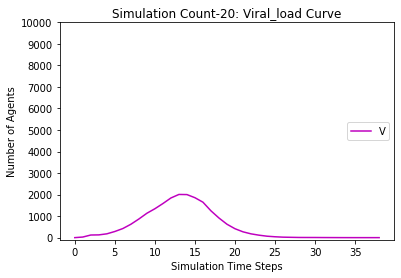

[9794, 9558, 9369, 9114, 8770, 8289, 7590, 6717, 5647, 4596, 3522, 2469, 1611, 999, 597, 375, 260, 193, 168, 147, 142, 137, 126, 120, 115, 113, 112, 110, 110, 110, 110, 109, 109, 107, 105, 105, 105, 105, 105, 105, 105]
[206, 442, 287, 542, 836, 1269, 1779, 2397, 3123, 3225, 3722, 4059, 4036, 3597, 2925, 2094, 1138, 688, 387, 228, 118, 56, 42, 25, 26, 24, 14, 10, 5, 3, 1, 1, 1, 3, 5, 4, 4, 2, 0, 0, 0]
[0, 0, 344, 344, 394, 442, 631, 886, 1230, 2179, 2756, 3472, 4353, 5404, 6478, 7531, 8602, 9119, 9445, 9625, 9740, 9807, 9832, 9855, 9859, 9863, 9874, 9880, 9885, 9887, 9889, 9890, 9890, 9890, 9890, 9891, 9891, 9893, 9895, 9895, 9895]
[0.0, 27.0, 131.5, 149.75, 226.875, 356.4375, 548.21875, 800.109375, 1062.0546875, 1369.02734375, 1581.513671875, 1787.7568359375, 2009.87841796875, 2079.939208984375, 1991.9696044921875, 1784.9848022460938, 1438.4924011230469, 1015.2462005615234, 695.6231002807617, 470.81155014038086, 301.40577507019043, 189.70288753509521, 114.85144376754761, 70.42572188377

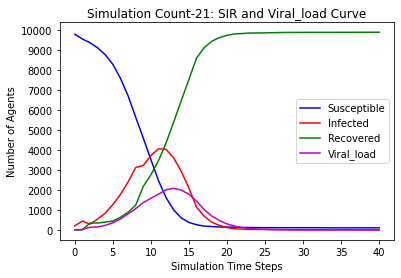

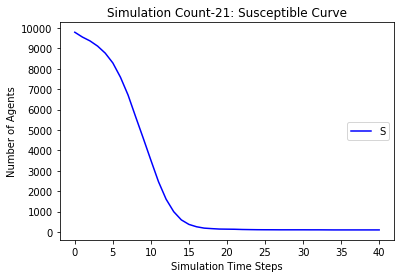

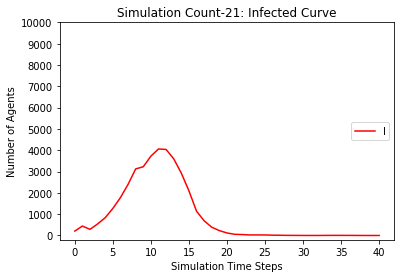

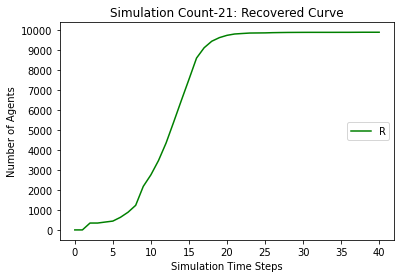

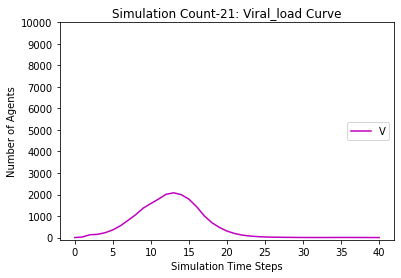

[9794, 9551, 9366, 9121, 8772, 8282, 7614, 6693, 5591, 4481, 3414, 2519, 1724, 1103, 660, 384, 253, 179, 137, 103, 89, 80, 72, 70, 69, 69, 67, 67, 67, 67, 67, 67]
[206, 449, 296, 541, 842, 1269, 1752, 2428, 3181, 3329, 3839, 3971, 3867, 3378, 2754, 2135, 1283, 809, 476, 281, 164, 99, 65, 21, 11, 7, 5, 3, 2, 2, 0, 0]
[0, 0, 338, 338, 386, 449, 634, 879, 1228, 2190, 2747, 3510, 4409, 5519, 6586, 7481, 8464, 9012, 9387, 9616, 9747, 9821, 9863, 9909, 9920, 9924, 9928, 9930, 9931, 9931, 9933, 9933]
[0.0, 31.0, 131.5, 152.75, 226.375, 362.1875, 531.09375, 780.546875, 1091.2734375, 1447.63671875, 1611.818359375, 1876.9091796875, 2000.45458984375, 2043.227294921875, 1944.6136474609375, 1682.3068237304688, 1382.1534118652344, 1031.0767059326172, 734.5383529663086, 484.2691764831543, 296.13458824157715, 173.06729412078857, 103.53364706039429, 65.76682353019714, 37.88341176509857, 20.941705882549286, 12.470852941274643, 7.2354264706373215, 4.617713235318661, 2.3088566176593304, 1.1544283088296652

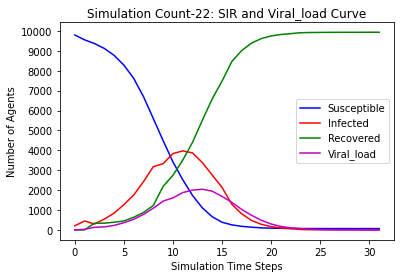

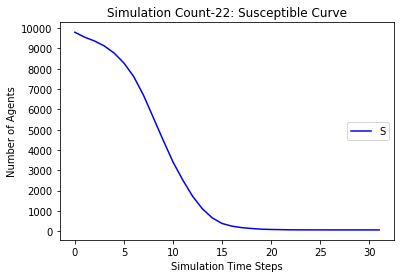

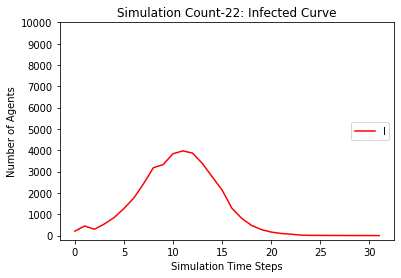

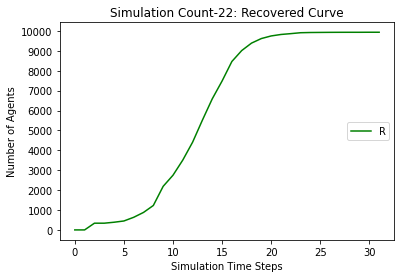

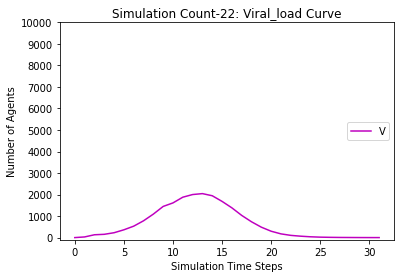

[9794, 9560, 9387, 9164, 8850, 8410, 7791, 6997, 5985, 5010, 3976, 2928, 2062, 1360, 827, 513, 327, 242, 174, 146, 120, 104, 97, 91, 87, 86, 84, 82, 80, 80, 80, 80, 80, 80, 80]
[206, 440, 266, 489, 752, 1150, 1596, 2167, 2865, 2968, 3497, 3885, 3923, 3650, 3149, 2415, 1506, 986, 605, 367, 207, 138, 77, 42, 27, 16, 13, 9, 7, 6, 4, 2, 0, 0, 0]
[0, 0, 347, 347, 398, 440, 613, 836, 1150, 2022, 2527, 3187, 4015, 4990, 6024, 7072, 8167, 8772, 9221, 9487, 9673, 9758, 9826, 9867, 9886, 9898, 9903, 9909, 9913, 9914, 9916, 9918, 9920, 9920, 9920]
[0.0, 31.0, 123.5, 126.75, 196.375, 305.1875, 492.59375, 703.296875, 938.6484375, 1247.32421875, 1481.662109375, 1759.8310546875, 2002.91552734375, 2109.457763671875, 2025.7288818359375, 1847.8644409179688, 1591.9322204589844, 1196.9661102294922, 869.4830551147461, 609.741527557373, 385.8707637786865, 234.93538188934326, 151.46769094467163, 93.73384547233582, 55.86692273616791, 34.933461368083954, 21.466730684041977, 16.73336534202099, 12.36668267101049

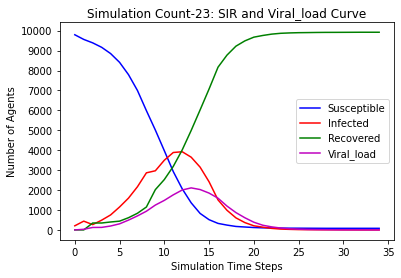

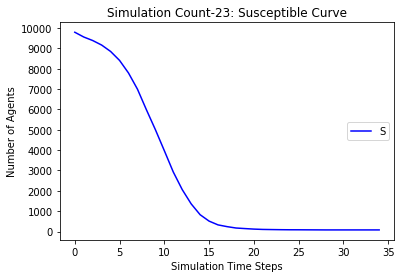

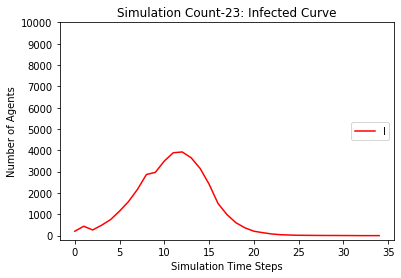

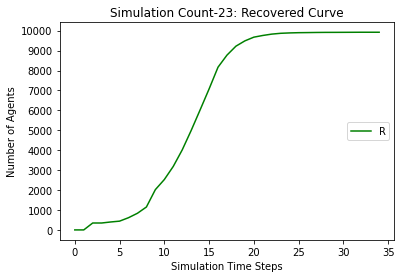

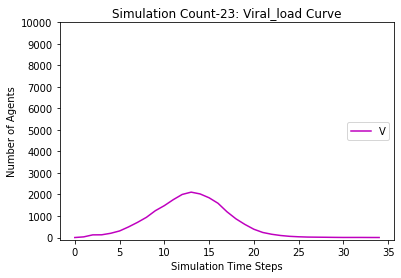

[9794, 9572, 9398, 9174, 8838, 8379, 7762, 6984, 5964, 4963, 3855, 2808, 1888, 1196, 716, 452, 306, 238, 198, 164, 144, 129, 122, 117, 117, 115, 115, 113, 113, 113, 113, 112, 112, 112, 112, 112]
[206, 428, 260, 484, 773, 1193, 1636, 2190, 2874, 2966, 3568, 3975, 4076, 3767, 3139, 2356, 1379, 850, 480, 288, 162, 109, 76, 38, 23, 12, 7, 4, 4, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 342, 342, 389, 428, 602, 826, 1162, 2071, 2577, 3217, 4036, 5037, 6145, 7192, 8315, 8912, 9322, 9548, 9694, 9762, 9802, 9845, 9860, 9873, 9878, 9883, 9883, 9885, 9886, 9887, 9887, 9887, 9887, 9888]
[0.0, 31.0, 122.5, 136.25, 213.125, 307.5625, 494.78125, 689.390625, 962.6953125, 1322.34765625, 1560.173828125, 1770.0869140625, 1953.04345703125, 2043.521728515625, 2018.7608642578125, 1810.3804321289062, 1516.1902160644531, 1108.0951080322266, 768.0475540161133, 514.0237770080566, 342.0118885040283, 206.00594425201416, 131.00297212600708, 83.50148606300354, 49.75074303150177, 29.875371515750885, 17.937685757875443, 10.968842

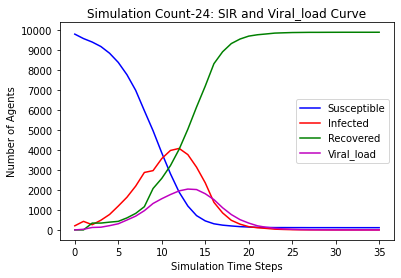

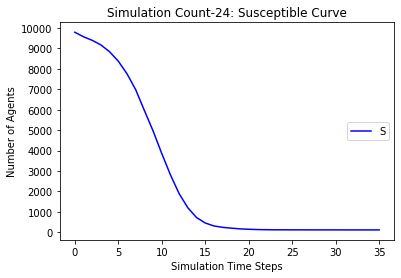

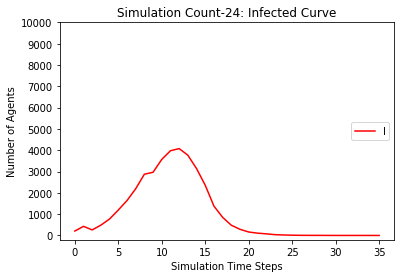

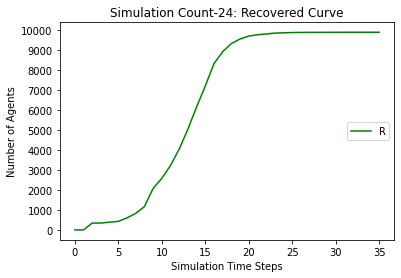

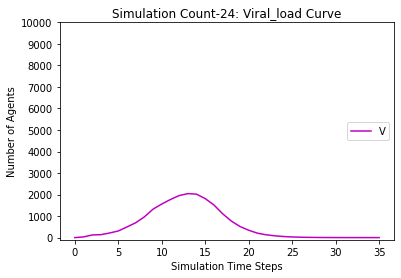

[9794, 9574, 9423, 9226, 8939, 8541, 7956, 7178, 6167, 5194, 4149, 3133, 2190, 1473, 931, 577, 390, 309, 241, 205, 174, 163, 149, 146, 140, 139, 137, 134, 130, 129, 128, 127, 127, 127, 127, 127, 127]
[206, 426, 226, 423, 667, 1033, 1467, 2048, 2772, 2893, 3456, 3832, 3977, 3721, 3218, 2556, 1601, 1044, 636, 372, 216, 146, 92, 40, 23, 19, 12, 12, 10, 10, 2, 3, 2, 2, 1, 0, 0]
[0, 0, 351, 351, 394, 426, 577, 774, 1061, 1913, 2395, 3035, 3833, 4806, 5851, 6867, 8009, 8647, 9123, 9423, 9610, 9691, 9759, 9814, 9837, 9842, 9851, 9854, 9860, 9861, 9870, 9870, 9871, 9871, 9872, 9873, 9873]
[0.0, 23.0, 116.5, 126.25, 179.125, 292.5625, 440.28125, 656.140625, 915.0703125, 1243.53515625, 1459.767578125, 1703.8837890625, 1868.94189453125, 2003.470947265625, 2055.7354736328125, 1844.8677368164062, 1583.4338684082031, 1222.7169342041016, 897.3584671020508, 613.6792335510254, 395.8396167755127, 251.91980838775635, 169.95990419387817, 109.97995209693909, 64.98997604846954, 34.49498802423477, 24.2474940

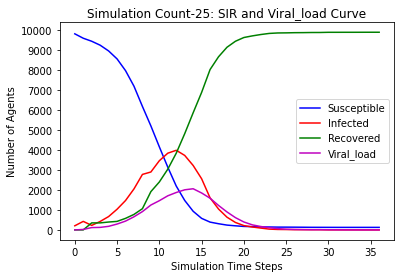

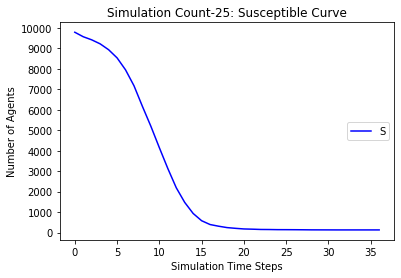

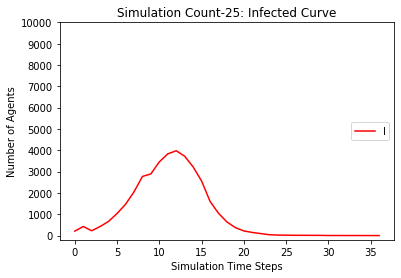

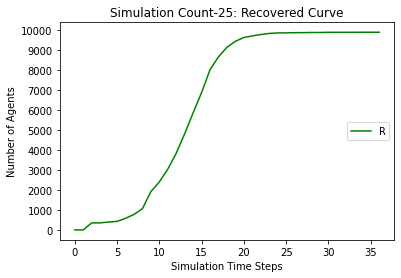

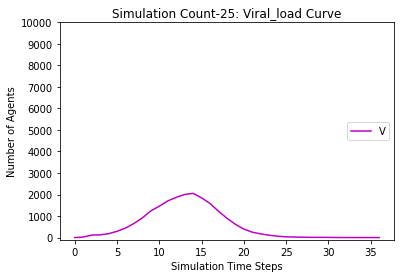

[9794, 9585, 9422, 9181, 8869, 8412, 7750, 6918, 5860, 4755, 3652, 2626, 1783, 1125, 677, 405, 278, 198, 150, 112, 99, 87, 79, 77, 75, 74, 73, 72, 72, 72, 72, 72]
[206, 415, 251, 492, 760, 1173, 1672, 2263, 3009, 3215, 3773, 4108, 4077, 3630, 2975, 2221, 1250, 787, 476, 293, 179, 111, 71, 30, 22, 13, 6, 5, 3, 2, 1, 0]
[0, 0, 327, 327, 371, 415, 578, 819, 1131, 2030, 2575, 3266, 4140, 5245, 6348, 7374, 8472, 9015, 9374, 9595, 9722, 9802, 9850, 9893, 9903, 9913, 9921, 9923, 9925, 9926, 9927, 9928]
[0.0, 24.0, 137.0, 134.5, 226.25, 310.125, 484.0625, 765.03125, 1065.515625, 1375.7578125, 1573.87890625, 1828.939453125, 2037.4697265625, 2097.73486328125, 2035.867431640625, 1821.9337158203125, 1488.9668579101562, 1055.4834289550781, 723.7417144775391, 489.87085723876953, 313.93542861938477, 207.96771430969238, 141.9838571548462, 94.9919285774231, 54.49596428871155, 32.247982144355774, 19.123991072177887, 10.561995536088943, 6.280997768044472, 3.140498884022236, 1.570249442011118, 0.785124721

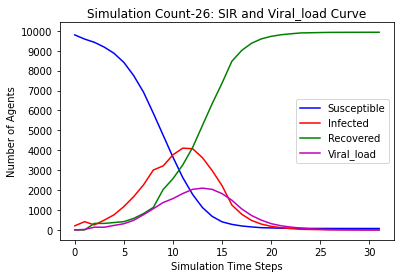

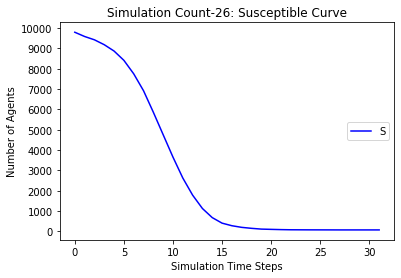

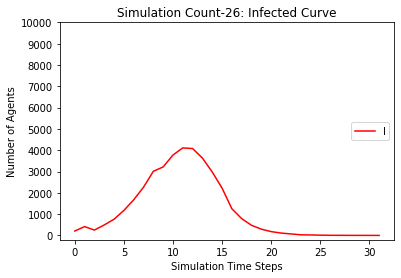

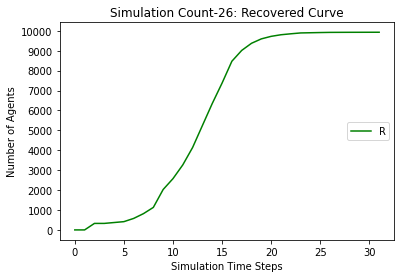

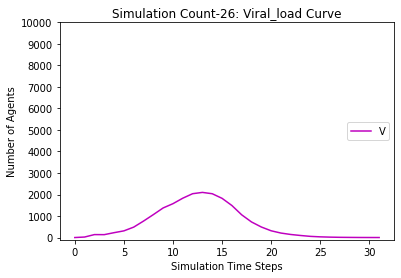

[9794, 9571, 9398, 9199, 8850, 8383, 7762, 7024, 6100, 5099, 4065, 3069, 2153, 1387, 854, 505, 318, 224, 169, 138, 116, 107, 102, 101, 101, 99, 99, 97, 97, 97, 96, 96, 96, 96, 96, 96]
[206, 429, 269, 468, 767, 1188, 1636, 2175, 2750, 2846, 3368, 3781, 3947, 3712, 3211, 2564, 1557, 1008, 627, 367, 202, 117, 67, 19, 5, 4, 3, 4, 4, 2, 3, 1, 1, 1, 0, 0]
[0, 0, 333, 333, 383, 429, 602, 801, 1150, 2055, 2567, 3150, 3900, 4901, 5935, 6931, 8125, 8768, 9204, 9495, 9682, 9776, 9831, 9880, 9894, 9897, 9898, 9899, 9899, 9901, 9901, 9903, 9903, 9903, 9904, 9904]
[0.0, 29.0, 122.5, 128.25, 194.125, 319.0625, 485.53125, 691.765625, 978.8828125, 1307.44140625, 1496.720703125, 1686.3603515625, 1943.18017578125, 2025.590087890625, 2039.7950439453125, 1892.8975219726562, 1632.4487609863281, 1233.224380493164, 883.612190246582, 618.806095123291, 395.4030475616455, 237.70152378082275, 148.85076189041138, 97.42538094520569, 54.712690472602844, 28.356345236301422, 15.178172618150711, 8.589086309075356, 5.29

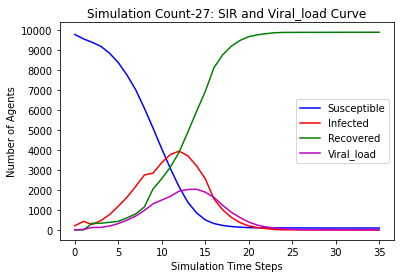

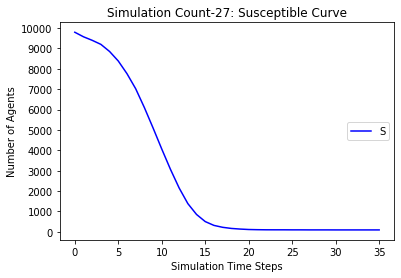

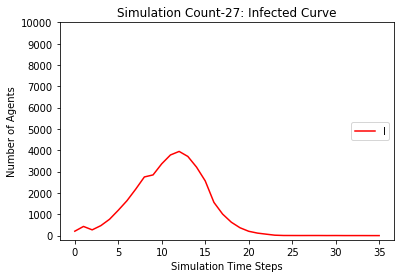

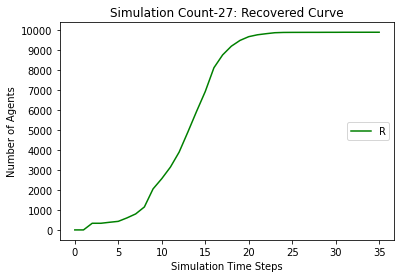

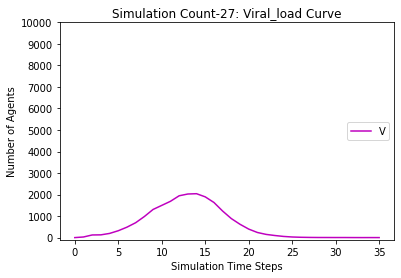

[9794, 9535, 9350, 9132, 8785, 8310, 7597, 6716, 5643, 4553, 3429, 2379, 1547, 945, 578, 355, 258, 205, 172, 144, 133, 122, 114, 109, 106, 105, 105, 105, 105, 105, 105, 105]
[206, 465, 291, 509, 809, 1225, 1753, 2416, 3142, 3317, 3845, 4167, 4096, 3608, 2851, 2024, 1076, 626, 363, 211, 125, 83, 58, 27, 21, 15, 9, 4, 1, 0, 0, 0]
[0, 0, 359, 359, 406, 465, 650, 868, 1215, 2130, 2726, 3454, 4357, 5447, 6571, 7621, 8666, 9169, 9465, 9645, 9742, 9795, 9828, 9864, 9873, 9880, 9886, 9891, 9894, 9895, 9895, 9895]
[0.0, 38.0, 137.0, 142.5, 217.25, 372.625, 530.3125, 776.15625, 1085.078125, 1429.5390625, 1656.76953125, 1872.384765625, 2003.1923828125, 2088.59619140625, 2000.298095703125, 1714.1490478515625, 1341.0745239257812, 947.5372619628906, 649.7686309814453, 415.88431549072266, 266.9421577453613, 172.47107887268066, 106.23553943634033, 72.11776971817017, 46.05888485908508, 26.02944242954254, 17.01472121477127, 8.507360607385635, 5.253680303692818, 3.626840151846409, 1.8134200759232044, 0.9

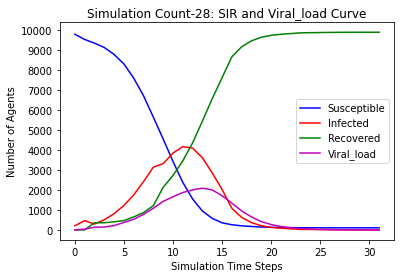

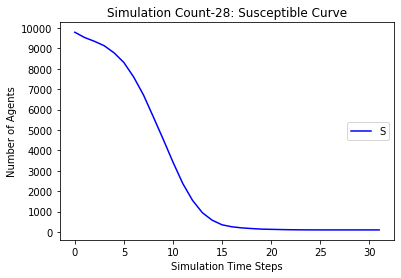

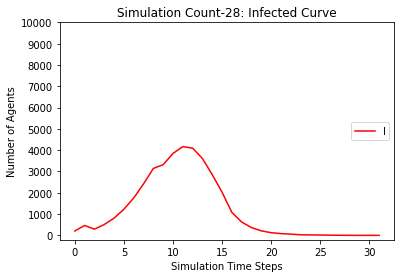

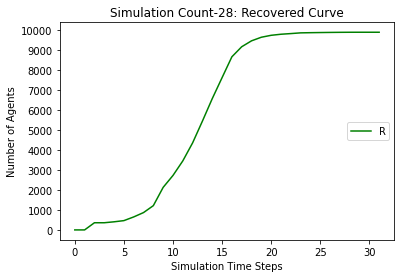

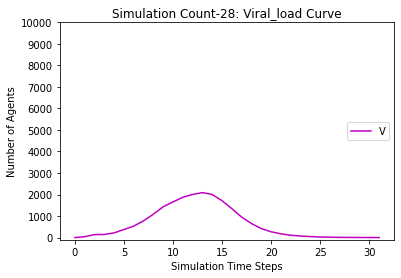

[9794, 9551, 9371, 9152, 8811, 8349, 7697, 6837, 5755, 4681, 3575, 2572, 1673, 1027, 626, 380, 260, 188, 159, 142, 132, 125, 116, 113, 110, 108, 107, 106, 103, 102, 102, 102, 102, 102, 102]
[206, 449, 283, 502, 801, 1202, 1674, 2315, 3056, 3221, 3787, 4082, 4082, 3654, 2949, 2192, 1188, 715, 416, 238, 128, 63, 43, 19, 16, 12, 9, 7, 7, 6, 5, 4, 1, 0, 0]
[0, 0, 346, 346, 388, 449, 629, 848, 1189, 2098, 2638, 3346, 4245, 5319, 6425, 7428, 8552, 9097, 9425, 9620, 9740, 9812, 9841, 9868, 9874, 9880, 9884, 9887, 9890, 9892, 9893, 9894, 9897, 9898, 9898]
[0.0, 34.0, 118.0, 130.0, 209.0, 335.5, 517.75, 740.875, 1033.4375, 1401.71875, 1637.859375, 1853.9296875, 2079.96484375, 2158.982421875, 2050.4912109375, 1843.24560546875, 1505.622802734375, 1050.8114013671875, 719.4057006835938, 479.7028503417969, 300.85142517089844, 182.42571258544922, 105.21285629272461, 62.606428146362305, 38.30321407318115, 22.151607036590576, 15.075803518295288, 12.537901759147644, 8.268950879573822, 8.134475439786911,

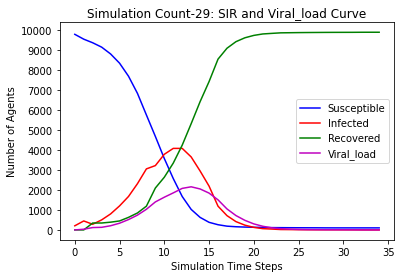

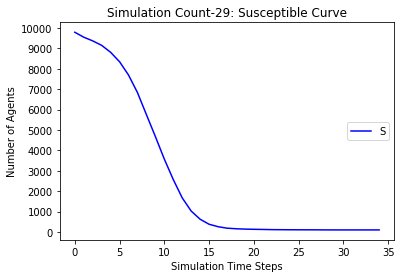

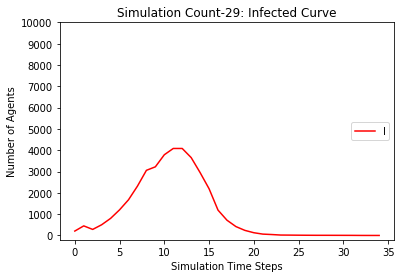

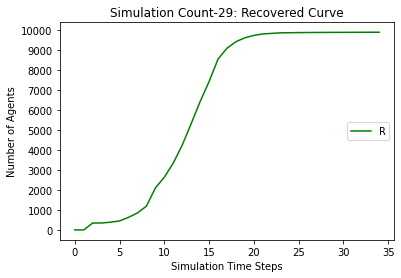

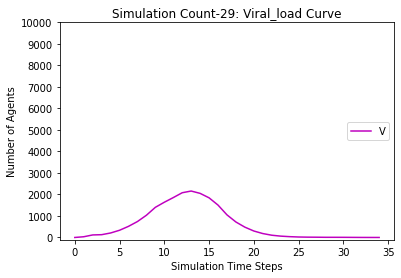

[9794, 9546, 9358, 9122, 8753, 8219, 7542, 6604, 5395, 4308, 3276, 2301, 1503, 957, 588, 381, 263, 191, 153, 138, 126, 114, 111, 108, 105, 105, 105, 105, 105, 104, 104, 104]
[206, 454, 294, 530, 848, 1327, 1816, 2518, 3358, 3438, 3899, 4091, 3892, 3351, 2688, 1920, 1088, 683, 401, 243, 137, 77, 42, 23, 17, 9, 6, 3, 0, 1, 0, 0]
[0, 0, 348, 348, 399, 454, 642, 878, 1247, 2254, 2825, 3608, 4605, 5692, 6724, 7699, 8649, 9126, 9446, 9619, 9737, 9809, 9847, 9869, 9878, 9886, 9889, 9892, 9895, 9895, 9896, 9896]
[0.0, 36.0, 133.0, 153.5, 229.75, 383.875, 590.9375, 846.46875, 1140.234375, 1502.1171875, 1708.05859375, 1898.029296875, 2080.0146484375, 2080.00732421875, 1942.003662109375, 1705.0018310546875, 1363.5009155273438, 979.7504577636719, 674.8752288818359, 433.43761444091797, 271.718807220459, 163.8594036102295, 99.92970180511475, 62.96485090255737, 34.48242545127869, 20.241212725639343, 13.120606362819672, 7.560303181409836, 4.780151590704918, 2.390075795352459, 1.1950378976762295, 0.597

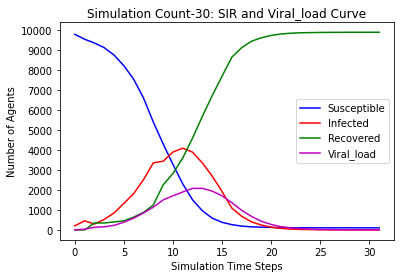

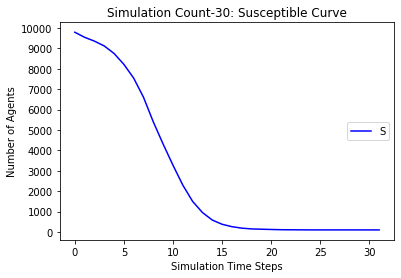

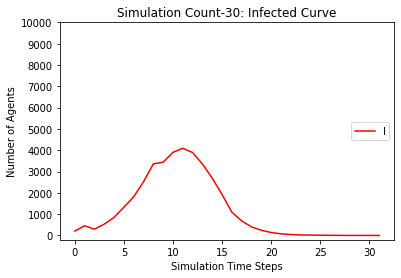

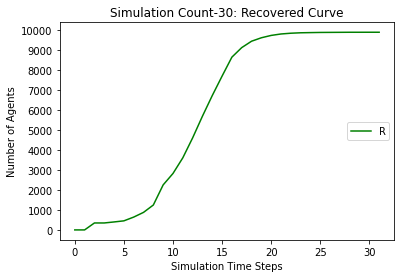

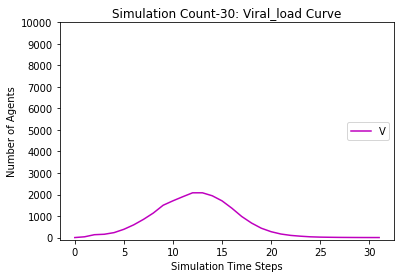

[9794, 9556, 9407, 9223, 8937, 8537, 7925, 7220, 6300, 5331, 4308, 3294, 2413, 1594, 1051, 654, 449, 343, 267, 217, 178, 145, 130, 126, 120, 120, 120, 119, 118, 116, 116, 116, 116, 114, 112, 110, 109, 109, 109, 109, 109]
[206, 444, 240, 424, 663, 1019, 1482, 2003, 2637, 2773, 3292, 3738, 3887, 3737, 3257, 2640, 1694, 1085, 705, 437, 271, 198, 137, 58, 40, 19, 10, 7, 2, 4, 2, 2, 1, 2, 4, 6, 7, 5, 3, 1, 0]
[0, 0, 353, 353, 400, 444, 593, 777, 1063, 1896, 2400, 2968, 3700, 4669, 5692, 6706, 7857, 8572, 9028, 9346, 9551, 9657, 9733, 9816, 9840, 9861, 9870, 9874, 9880, 9880, 9882, 9882, 9883, 9884, 9884, 9884, 9884, 9886, 9888, 9890, 9891]
[0.0, 31.0, 119.5, 118.75, 179.375, 286.6875, 460.34375, 649.171875, 890.5859375, 1208.29296875, 1401.146484375, 1596.5732421875, 1800.28662109375, 1911.143310546875, 1892.5716552734375, 1808.2858276367188, 1593.1429138183594, 1218.5714569091797, 892.2857284545898, 623.1428642272949, 428.57143211364746, 303.28571605682373, 207.64285802841187, 140.82142901

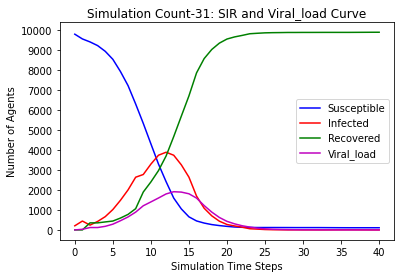

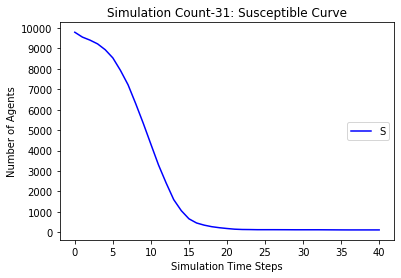

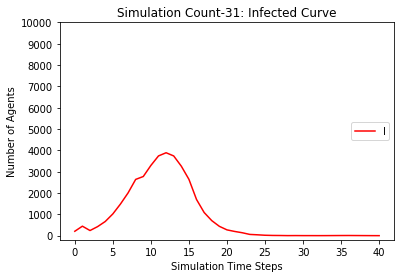

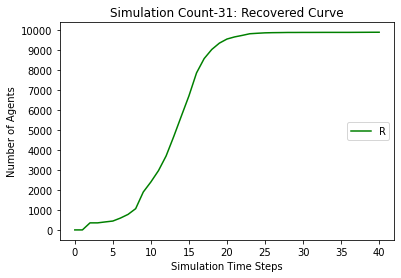

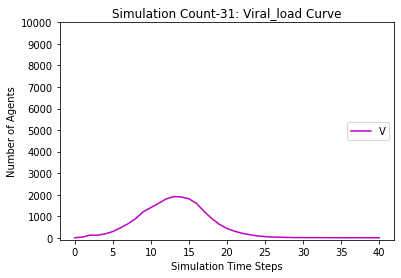

[9794, 9558, 9389, 9172, 8849, 8406, 7787, 6979, 5980, 5008, 3994, 2920, 1987, 1309, 825, 501, 347, 259, 204, 169, 149, 138, 131, 126, 123, 120, 119, 119, 118, 118, 118, 118, 117, 116, 116, 115, 115, 115]
[206, 442, 242, 459, 741, 1152, 1602, 2193, 2869, 2963, 3470, 3869, 3993, 3699, 3169, 2419, 1413, 923, 569, 332, 198, 121, 73, 35, 21, 16, 12, 7, 5, 2, 0, 0, 1, 2, 2, 3, 2, 0]
[0, 0, 369, 369, 410, 442, 611, 828, 1151, 2029, 2536, 3211, 4020, 4992, 6006, 7080, 8240, 8818, 9227, 9499, 9653, 9741, 9796, 9839, 9856, 9864, 9869, 9874, 9877, 9880, 9882, 9882, 9882, 9882, 9882, 9882, 9883, 9885]
[0.0, 25.0, 130.5, 136.25, 193.125, 314.5625, 500.28125, 721.140625, 977.5703125, 1299.78515625, 1502.892578125, 1768.4462890625, 1936.22314453125, 2045.111572265625, 2044.5557861328125, 1894.2778930664062, 1591.1389465332031, 1147.5694732666016, 800.7847366333008, 555.3923683166504, 366.6961841583252, 241.3480920791626, 154.6740460395813, 95.33702301979065, 53.668511509895325, 30.834255754947662, 1

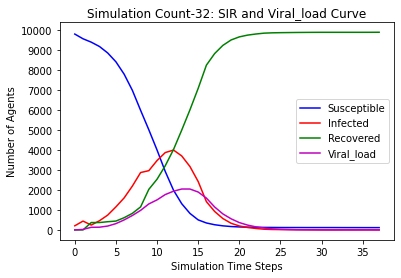

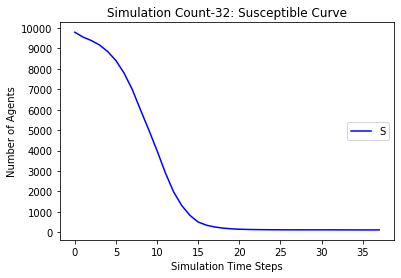

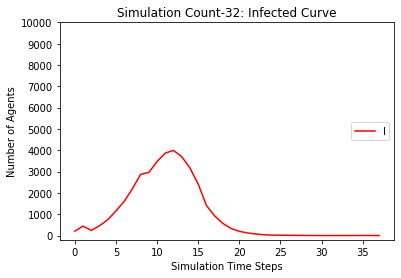

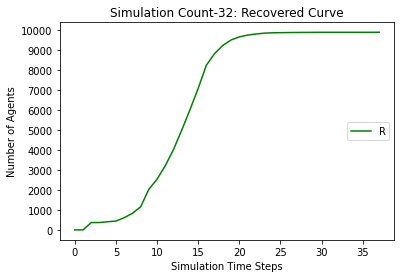

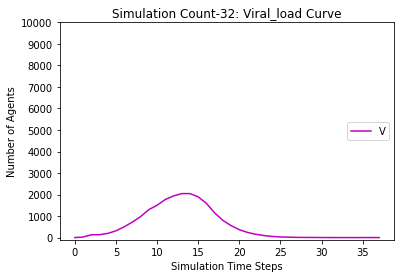

[9794, 9570, 9382, 9137, 8791, 8292, 7583, 6674, 5502, 4321, 3221, 2237, 1426, 888, 536, 300, 202, 155, 127, 118, 115, 113, 112, 111, 111, 111, 110, 110, 110, 110, 109, 108, 108, 108, 107, 106, 106, 106, 106, 105, 105, 105, 105, 105, 105]
[206, 430, 289, 534, 827, 1278, 1799, 2463, 3289, 3484, 4000, 4238, 4076, 3433, 2685, 1937, 1049, 636, 365, 182, 87, 42, 15, 4, 2, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0]
[0, 0, 329, 329, 382, 430, 618, 863, 1209, 2195, 2779, 3525, 4498, 5679, 6779, 7763, 8749, 9209, 9508, 9700, 9798, 9845, 9873, 9885, 9887, 9888, 9888, 9889, 9889, 9889, 9890, 9890, 9890, 9890, 9891, 9892, 9892, 9892, 9893, 9894, 9894, 9894, 9894, 9895, 9895]
[0.0, 35.0, 132.5, 146.25, 234.125, 366.0625, 571.03125, 835.515625, 1126.7578125, 1494.37890625, 1742.189453125, 1983.0947265625, 2136.54736328125, 2181.273681640625, 2048.6368408203125, 1756.3184204101562, 1390.1592102050781, 959.0796051025391, 625.5398025512695, 416.76990127563477, 261.3849506378174, 155.69

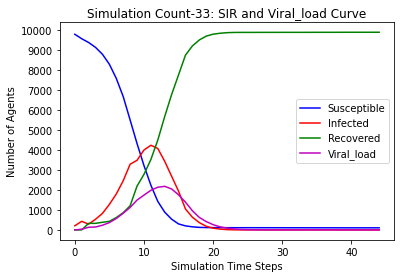

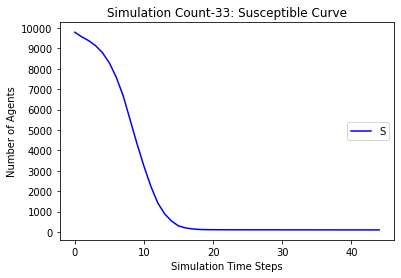

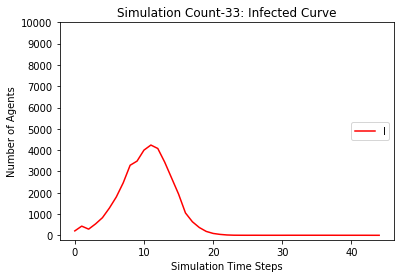

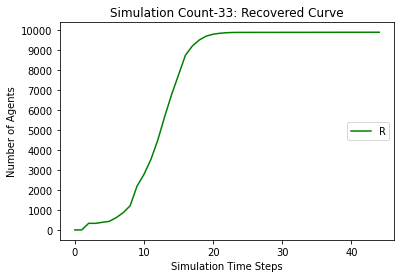

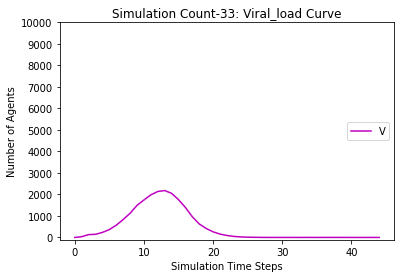

[9794, 9546, 9358, 9107, 8740, 8238, 7589, 6723, 5645, 4540, 3499, 2453, 1630, 1034, 660, 411, 289, 217, 177, 150, 133, 124, 116, 108, 103, 101, 99, 98, 98, 98, 98, 98, 98]
[206, 454, 285, 536, 854, 1308, 1769, 2384, 3095, 3231, 3738, 4064, 4015, 3506, 2839, 2042, 1136, 699, 439, 261, 156, 93, 61, 32, 25, 20, 17, 10, 5, 3, 1, 0, 0]
[0, 0, 357, 357, 406, 454, 642, 893, 1260, 2229, 2763, 3483, 4355, 5460, 6501, 7547, 8575, 9084, 9384, 9589, 9711, 9783, 9823, 9860, 9872, 9879, 9884, 9892, 9897, 9899, 9901, 9902, 9902]
[0.0, 35.0, 135.5, 158.75, 245.375, 372.6875, 569.34375, 838.671875, 1102.3359375, 1409.16796875, 1652.583984375, 1862.2919921875, 1987.14599609375, 2044.572998046875, 1944.2864990234375, 1733.1432495117188, 1417.5716247558594, 1022.7858123779297, 695.3929061889648, 450.6964530944824, 300.3482265472412, 200.1741132736206, 116.0870566368103, 78.04352831840515, 50.021764159202576, 32.01088207960129, 24.005441039800644, 18.002720519900322, 11.001360259950161, 7.5006801299750805

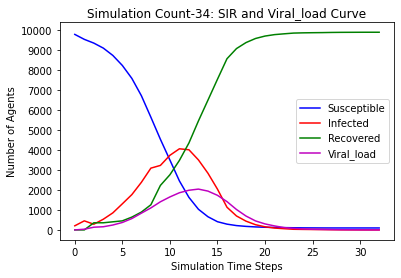

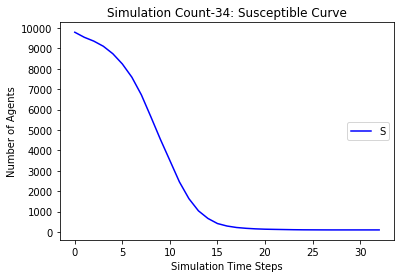

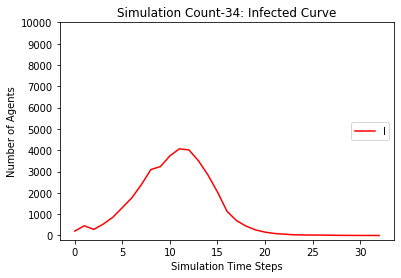

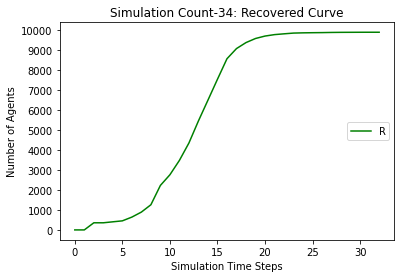

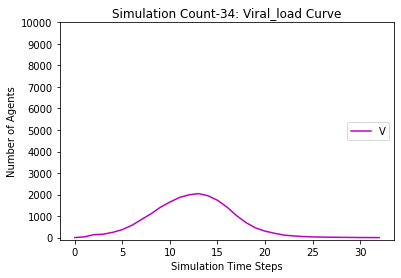

[9794, 9553, 9364, 9139, 8806, 8286, 7556, 6684, 5601, 4506, 3416, 2462, 1703, 1040, 619, 402, 281, 203, 163, 127, 107, 103, 98, 98, 98, 98, 98, 98, 98, 98, 98]
[206, 447, 296, 521, 802, 1267, 1808, 2455, 3205, 3316, 3800, 4034, 3898, 3466, 2797, 2060, 1209, 724, 417, 275, 174, 100, 65, 18, 4, 3, 0, 0, 0, 0, 0]
[0, 0, 340, 340, 392, 447, 636, 861, 1194, 2178, 2784, 3504, 4399, 5494, 6584, 7538, 8510, 9073, 9420, 9598, 9719, 9797, 9837, 9884, 9898, 9899, 9902, 9902, 9902, 9902, 9902]
[0.0, 31.0, 130.5, 146.25, 226.125, 356.0625, 548.03125, 789.015625, 1082.5078125, 1481.25390625, 1677.626953125, 1840.8134765625, 2013.40673828125, 2041.703369140625, 1919.8516845703125, 1681.9258422851562, 1370.9629211425781, 1008.4814605712891, 697.2407302856445, 453.62036514282227, 295.81018257141113, 193.90509128570557, 120.95254564285278, 73.47627282142639, 39.738136410713196, 19.869068205356598, 9.934534102678299, 4.9672670513391495, 2.4836335256695747, 1.2418167628347874, 0.6209083814173937]
0.0
[[]

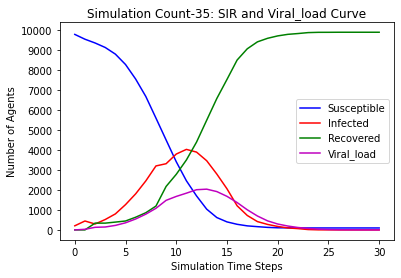

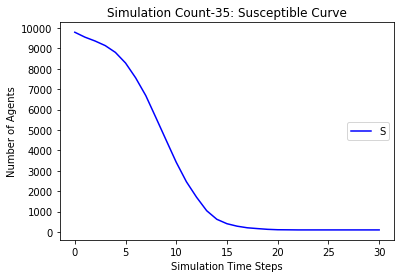

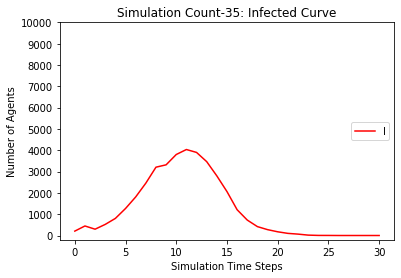

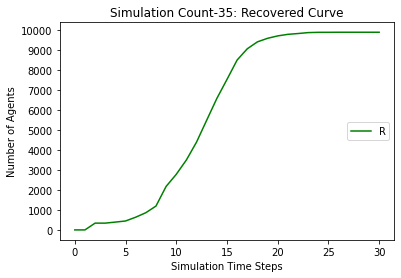

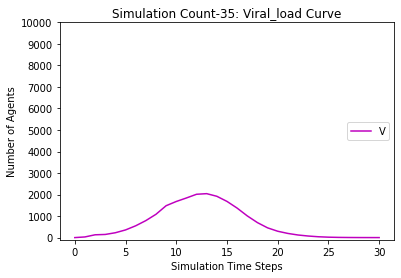

[9794, 9575, 9380, 9158, 8830, 8369, 7723, 6901, 5893, 4803, 3710, 2645, 1770, 1118, 706, 435, 289, 213, 166, 140, 114, 107, 102, 99, 99, 98, 98, 98, 98, 98, 98, 98]
[206, 425, 287, 509, 787, 1206, 1657, 2257, 2937, 3118, 3674, 4070, 4123, 3685, 3004, 2210, 1270, 794, 489, 295, 175, 106, 64, 35, 15, 9, 4, 1, 1, 0, 0, 0]
[0, 0, 333, 333, 383, 425, 620, 842, 1170, 2079, 2616, 3285, 4107, 5197, 6290, 7355, 8441, 8993, 9345, 9565, 9711, 9787, 9834, 9866, 9886, 9893, 9898, 9901, 9901, 9902, 9902, 9902]
[0.0, 33.0, 136.5, 133.25, 204.625, 333.3125, 504.65625, 724.328125, 1006.1640625, 1289.08203125, 1512.541015625, 1824.2705078125, 2053.13525390625, 2167.567626953125, 2086.7838134765625, 1855.3919067382812, 1518.6959533691406, 1081.3479766845703, 743.6739883422852, 501.8369941711426, 331.9184970855713, 215.95924854278564, 134.97962427139282, 79.48981213569641, 47.744906067848206, 30.872453033924103, 19.43622651696205, 12.718113258481026, 6.359056629240513, 3.1795283146202564, 1.5897641573101

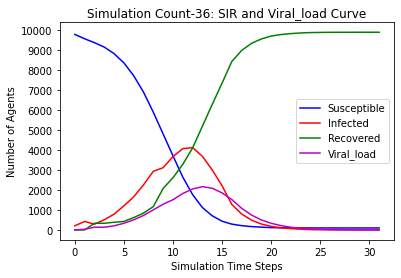

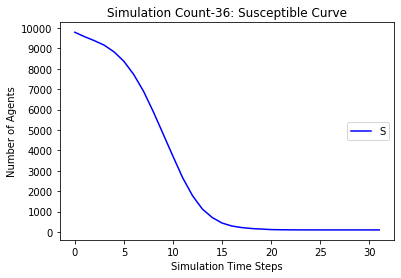

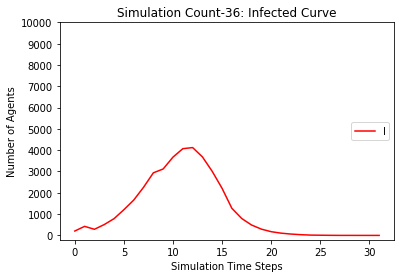

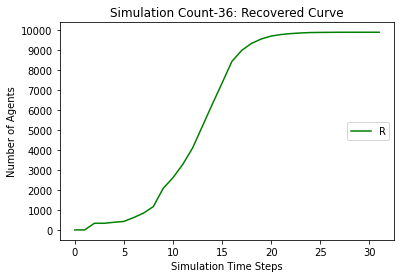

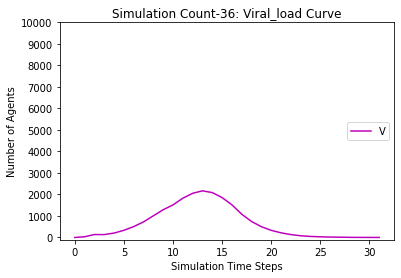

[9794, 9521, 9304, 9046, 8689, 8226, 7570, 6751, 5801, 4794, 3761, 2756, 1876, 1226, 775, 511, 358, 279, 222, 181, 160, 149, 142, 140, 138, 135, 135, 134, 133, 132, 132, 132, 132]
[206, 479, 330, 588, 897, 1295, 1734, 2295, 2888, 2985, 3490, 3816, 3925, 3568, 2986, 2245, 1300, 816, 502, 330, 198, 130, 80, 20, 14, 11, 7, 6, 5, 3, 0, 0, 0]
[0, 0, 366, 366, 414, 479, 696, 954, 1311, 2221, 2749, 3428, 4199, 5206, 6239, 7244, 8342, 8905, 9276, 9489, 9642, 9721, 9778, 9840, 9848, 9854, 9858, 9860, 9862, 9865, 9868, 9868, 9868]
[0.0, 40.0, 163.0, 168.5, 229.25, 341.625, 516.8125, 766.40625, 1025.203125, 1340.6015625, 1535.30078125, 1694.650390625, 1858.3251953125, 1962.16259765625, 1943.081298828125, 1754.5406494140625, 1452.2703247070312, 1041.1351623535156, 723.5675811767578, 502.7837905883789, 330.39189529418945, 214.19594764709473, 145.09797382354736, 98.54898691177368, 54.27449345588684, 33.13724672794342, 20.56862336397171, 13.284311681985855, 8.642155840992928, 5.321077920496464, 2.660

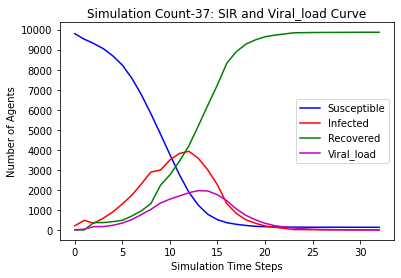

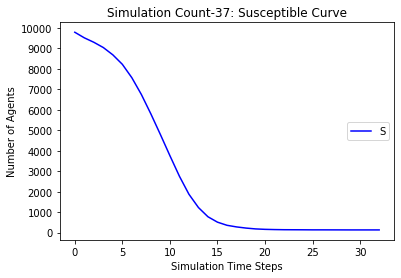

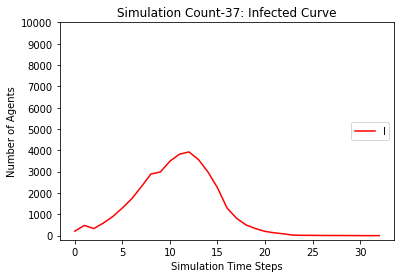

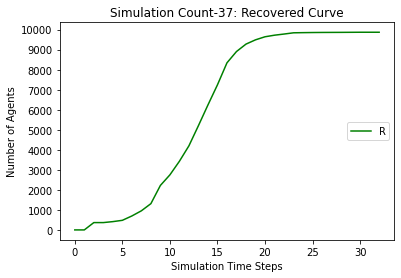

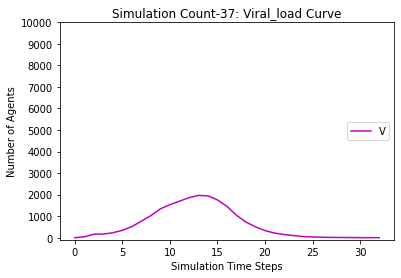

[9794, 9547, 9371, 9149, 8812, 8350, 7694, 6874, 5869, 4798, 3763, 2785, 1881, 1184, 701, 417, 266, 193, 151, 131, 115, 101, 93, 87, 83, 81, 80, 78, 78, 78, 77, 77, 77, 77, 77, 77]
[206, 453, 260, 482, 773, 1197, 1677, 2275, 2943, 3118, 3606, 3914, 3988, 3614, 3062, 2368, 1405, 866, 504, 286, 151, 92, 58, 21, 17, 13, 13, 9, 5, 3, 2, 1, 1, 1, 0, 0]
[0, 0, 369, 369, 415, 453, 629, 851, 1188, 2084, 2631, 3301, 4131, 5202, 6237, 7215, 8329, 8941, 9345, 9583, 9734, 9807, 9849, 9892, 9900, 9906, 9907, 9913, 9917, 9919, 9921, 9922, 9922, 9922, 9923, 9923]
[0.0, 30.0, 140.0, 144.0, 216.0, 327.0, 509.5, 728.75, 1002.375, 1334.1875, 1550.09375, 1759.046875, 1939.5234375, 2081.76171875, 2050.880859375, 1837.4404296875, 1548.72021484375, 1157.360107421875, 809.6800537109375, 536.8400268554688, 338.4200134277344, 211.2100067138672, 136.6050033569336, 81.3025016784668, 43.6512508392334, 26.8256254196167, 17.41281270980835, 14.706406354904175, 11.353203177452087, 7.676601588726044, 4.838300794363022,

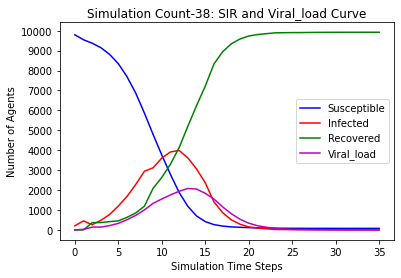

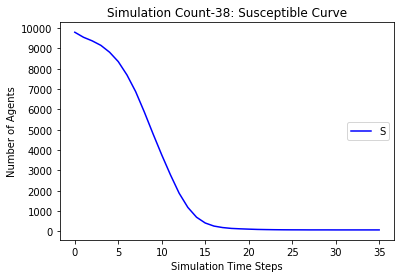

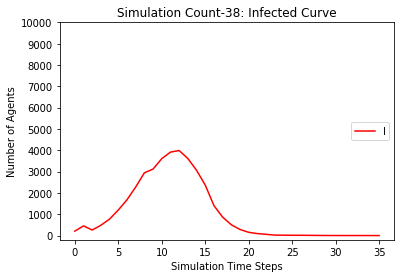

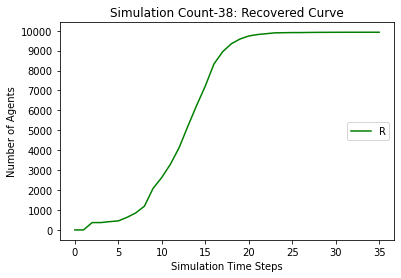

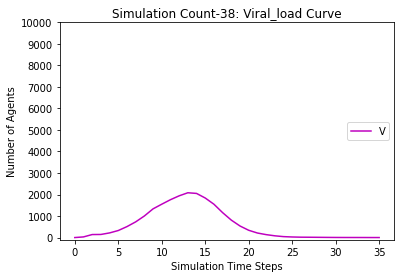

[9794, 9552, 9348, 9102, 8746, 8281, 7566, 6658, 5564, 4463, 3398, 2396, 1583, 962, 580, 360, 256, 200, 157, 128, 117, 109, 104, 103, 102, 101, 101, 100, 100, 100, 100, 100]
[206, 448, 298, 544, 851, 1271, 1782, 2444, 3182, 3349, 3827, 4081, 3981, 3501, 2818, 2036, 1114, 644, 367, 232, 139, 91, 53, 13, 7, 5, 3, 3, 2, 1, 1, 0]
[0, 0, 354, 354, 403, 448, 652, 898, 1254, 2188, 2775, 3523, 4436, 5537, 6602, 7604, 8630, 9156, 9476, 9640, 9744, 9800, 9843, 9884, 9891, 9894, 9896, 9897, 9898, 9899, 9899, 9900]
[0.0, 29.0, 126.5, 164.25, 238.125, 366.0625, 563.03125, 813.515625, 1100.7578125, 1429.37890625, 1654.689453125, 1870.3447265625, 2037.17236328125, 2146.586181640625, 1982.2930908203125, 1730.1465454101562, 1403.0732727050781, 989.5366363525391, 665.7683181762695, 427.88415908813477, 256.9420795440674, 157.4710397720337, 99.73551988601685, 64.86775994300842, 36.43387997150421, 19.216939985752106, 11.608469992876053, 6.804234996438026, 4.402117498219013, 2.2010587491095066, 1.1005293745

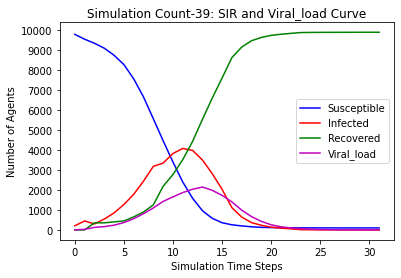

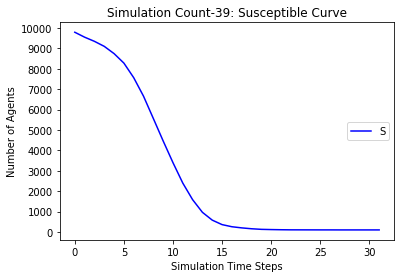

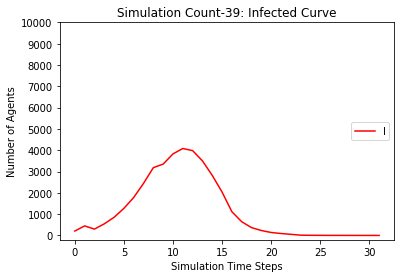

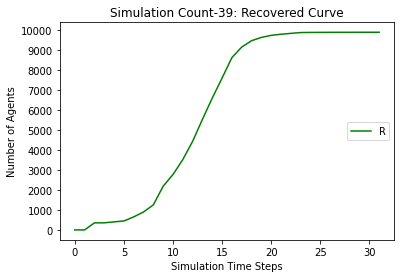

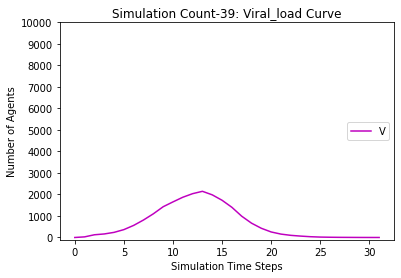

[9794, 9557, 9394, 9182, 8893, 8486, 7940, 7230, 6309, 5317, 4269, 3216, 2229, 1473, 918, 557, 355, 239, 172, 137, 121, 101, 94, 93, 92, 90, 90, 90, 90, 90, 90, 90]
[206, 443, 242, 454, 700, 1071, 1454, 1952, 2584, 2754, 3363, 3838, 4080, 3844, 3351, 2659, 1670, 1123, 703, 420, 234, 138, 78, 21, 12, 5, 4, 3, 2, 0, 0, 0]
[0, 0, 364, 364, 407, 443, 606, 818, 1107, 1929, 2368, 2946, 3691, 4683, 5731, 6784, 7975, 8638, 9125, 9443, 9645, 9761, 9828, 9886, 9896, 9905, 9906, 9907, 9908, 9910, 9910, 9910]
[0.0, 33.0, 142.5, 133.25, 184.625, 282.3125, 427.15625, 611.578125, 839.7890625, 1114.89453125, 1362.447265625, 1652.2236328125, 1905.11181640625, 2026.555908203125, 2037.2779541015625, 1908.6389770507812, 1681.3194885253906, 1292.6597442626953, 928.3298721313477, 645.1649360656738, 424.5824680328369, 284.29123401641846, 176.14561700820923, 99.07280850410461, 52.53640425205231, 30.268202126026154, 16.134101063013077, 9.067050531506538, 4.533525265753269, 2.2667626328766346, 1.133381316438317

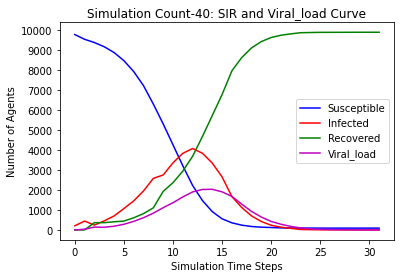

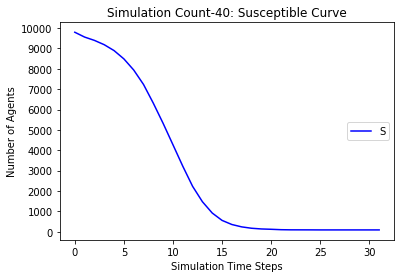

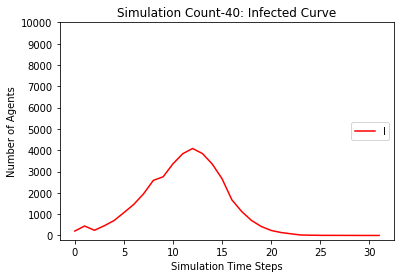

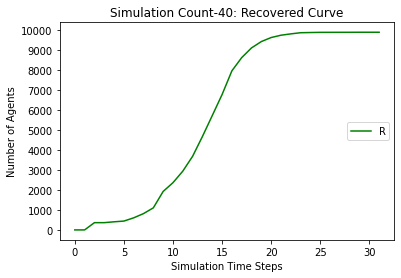

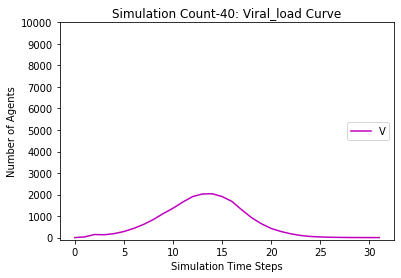

[9794, 9564, 9386, 9175, 8832, 8355, 7659, 6745, 5705, 4581, 3505, 2512, 1661, 1014, 641, 412, 279, 211, 166, 139, 118, 113, 111, 107, 105, 101, 101, 100, 100, 100, 100, 100, 100]
[206, 436, 270, 481, 776, 1209, 1727, 2430, 3127, 3349, 3856, 4071, 4044, 3567, 2864, 2100, 1219, 719, 437, 273, 161, 98, 55, 25, 11, 12, 10, 7, 5, 1, 0, 0, 0]
[0, 0, 344, 344, 392, 436, 614, 825, 1168, 2070, 2639, 3417, 4295, 5419, 6495, 7488, 8502, 9070, 9397, 9588, 9721, 9789, 9834, 9868, 9884, 9887, 9889, 9893, 9895, 9899, 9900, 9900, 9900]
[0.0, 28.0, 138.0, 143.0, 221.5, 360.75, 557.375, 791.6875, 1083.84375, 1466.921875, 1625.4609375, 1837.73046875, 2033.865234375, 2096.9326171875, 1986.46630859375, 1752.233154296875, 1447.1165771484375, 1048.5582885742188, 699.2791442871094, 454.6395721435547, 305.31978607177734, 194.65989303588867, 125.32994651794434, 76.66497325897217, 44.332486629486084, 24.166243314743042, 18.08312165737152, 14.04156082868576, 11.02078041434288, 7.51039020717144, 3.75519510358572,

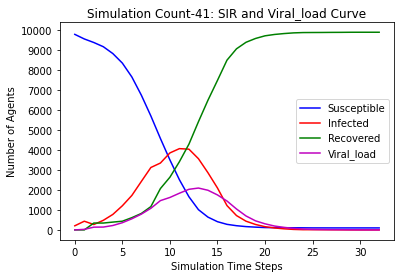

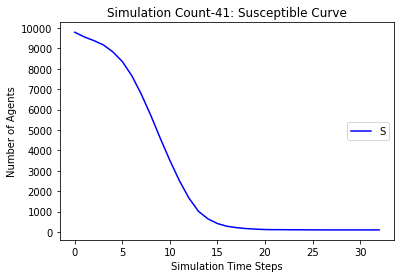

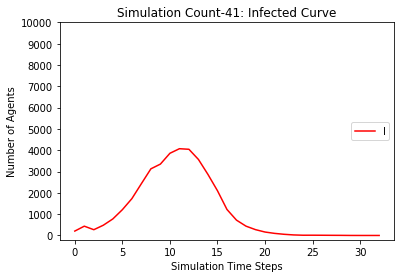

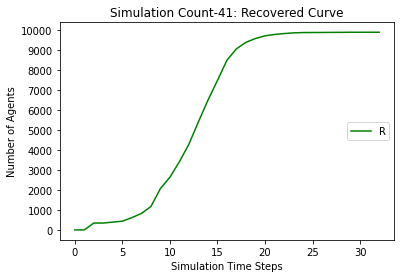

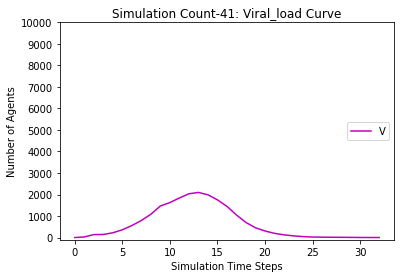

[9794, 9563, 9365, 9127, 8762, 8261, 7580, 6712, 5701, 4646, 3640, 2688, 1849, 1180, 774, 527, 373, 276, 221, 183, 154, 138, 134, 126, 124, 122, 121, 117, 115, 114, 114, 113, 113, 113, 113, 113]
[206, 437, 298, 536, 849, 1302, 1785, 2415, 3061, 3157, 3608, 3851, 3852, 3466, 2866, 2161, 1265, 790, 503, 344, 219, 138, 87, 40, 23, 13, 13, 9, 9, 8, 5, 3, 2, 1, 1, 0]
[0, 0, 337, 337, 389, 437, 635, 873, 1238, 2197, 2752, 3461, 4299, 5354, 6360, 7312, 8362, 8934, 9276, 9473, 9627, 9724, 9779, 9834, 9853, 9865, 9866, 9874, 9876, 9878, 9881, 9884, 9885, 9886, 9886, 9887]
[0.0, 33.0, 137.5, 152.75, 216.375, 339.1875, 536.59375, 757.296875, 1056.6484375, 1384.32421875, 1569.162109375, 1827.5810546875, 1984.79052734375, 2047.395263671875, 1978.6976318359375, 1762.3488159179688, 1439.1744079589844, 1037.5872039794922, 732.7936019897461, 507.39680099487305, 348.6984004974365, 232.34920024871826, 154.17460012435913, 94.08730006217957, 54.04365003108978, 32.02182501554489, 22.010912507772446, 16.0054

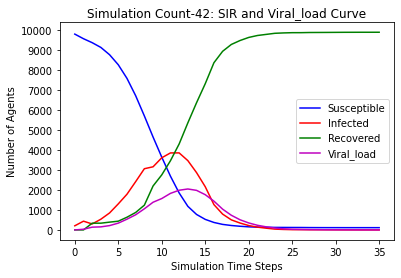

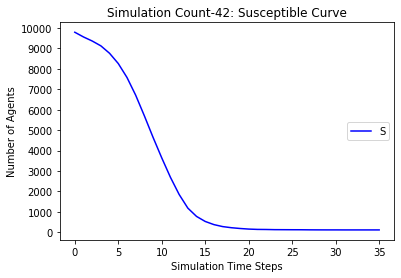

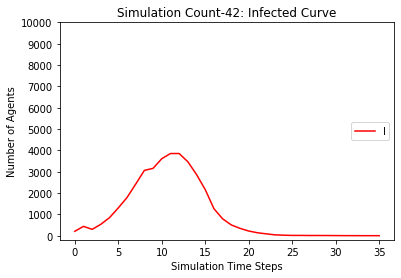

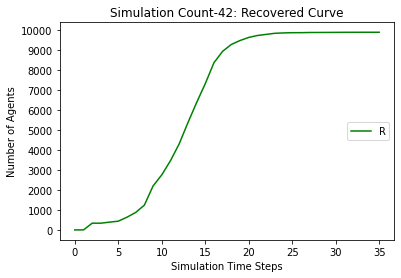

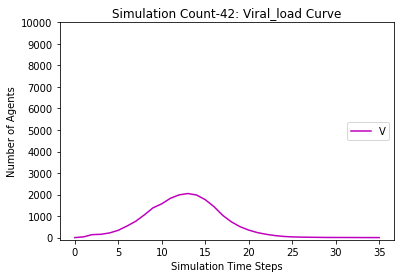

[9794, 9570, 9396, 9172, 8831, 8382, 7737, 6912, 5893, 4853, 3821, 2785, 1872, 1217, 774, 485, 326, 220, 172, 149, 131, 119, 113, 111, 111, 110, 109, 108, 107, 107, 107, 107, 107]
[206, 430, 247, 471, 768, 1188, 1659, 2260, 2938, 3095, 3580, 3941, 4021, 3636, 3047, 2300, 1282, 840, 531, 336, 195, 101, 59, 27, 15, 7, 4, 3, 4, 3, 2, 1, 0]
[0, 0, 357, 357, 401, 430, 604, 828, 1169, 2052, 2599, 3274, 4107, 5147, 6179, 7215, 8392, 8940, 9297, 9515, 9674, 9780, 9828, 9862, 9874, 9883, 9887, 9889, 9889, 9890, 9891, 9892, 9893]
[0.0, 30.0, 131.0, 132.5, 205.25, 327.625, 500.8125, 718.40625, 1003.203125, 1354.6015625, 1537.30078125, 1756.650390625, 1934.3251953125, 2069.16259765625, 1944.581298828125, 1762.2906494140625, 1474.1453247070312, 1067.0726623535156, 748.5363311767578, 522.2681655883789, 358.13408279418945, 234.06704139709473, 141.03352069854736, 84.51676034927368, 47.25838017463684, 29.62919008731842, 15.81459504365921, 8.907297521829605, 6.4536487609148026, 3.2268243804574013, 1.613

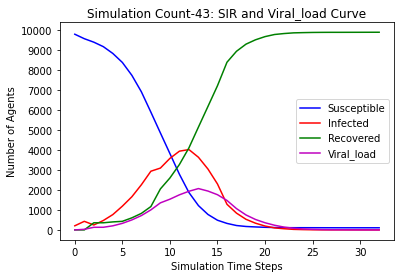

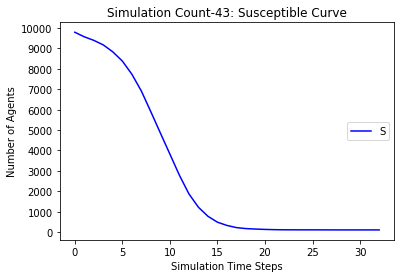

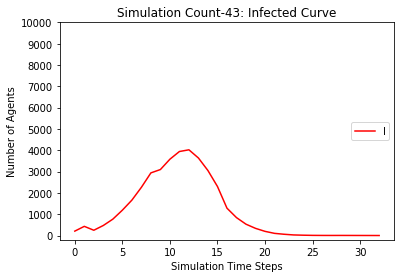

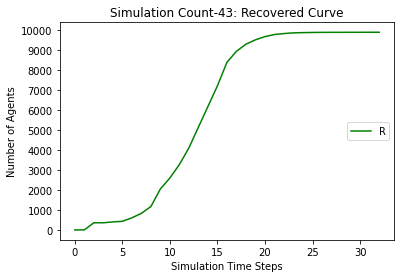

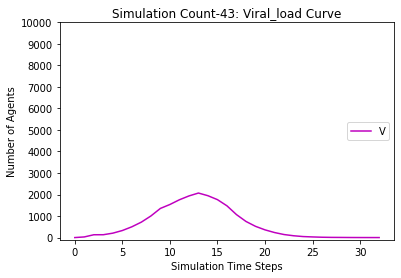

[9794, 9552, 9376, 9148, 8808, 8310, 7623, 6769, 5752, 4705, 3605, 2593, 1720, 1107, 679, 441, 324, 255, 204, 171, 138, 129, 120, 116, 112, 109, 108, 107, 105, 103, 101, 101, 101, 101, 101]
[206, 448, 261, 489, 783, 1242, 1753, 2379, 3056, 3155, 3700, 3997, 4032, 3598, 2926, 2152, 1191, 737, 422, 270, 186, 126, 84, 42, 22, 18, 12, 9, 7, 6, 4, 4, 3, 2, 0]
[0, 0, 363, 363, 409, 448, 624, 852, 1192, 2140, 2695, 3410, 4248, 5295, 6395, 7407, 8485, 9008, 9374, 9559, 9676, 9745, 9796, 9842, 9866, 9873, 9880, 9884, 9888, 9891, 9895, 9895, 9896, 9897, 9899]
[0.0, 29.0, 129.5, 144.75, 219.375, 361.6875, 568.84375, 781.421875, 1074.7109375, 1424.35546875, 1611.177734375, 1832.5888671875, 2005.29443359375, 2136.647216796875, 2069.3236083984375, 1826.6618041992188, 1468.3309020996094, 1044.1654510498047, 742.0827255249023, 495.0413627624512, 299.5206813812256, 178.7603406906128, 109.3801703453064, 72.6900851726532, 54.3450425863266, 32.1725212931633, 20.08626064658165, 12.043130323290825, 6.021565

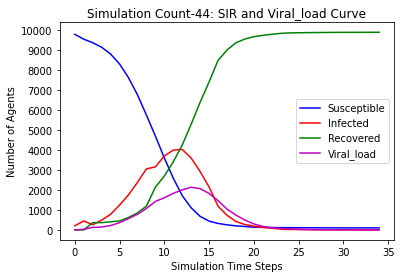

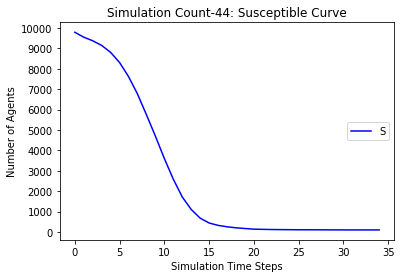

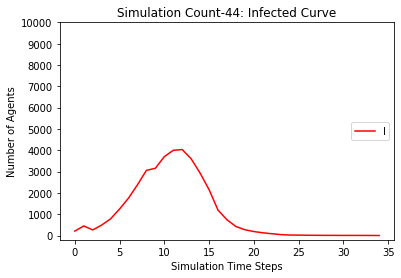

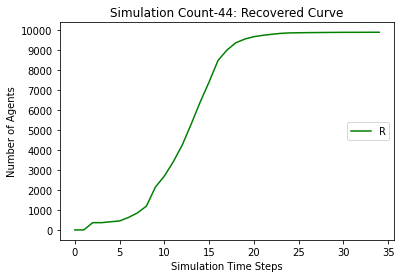

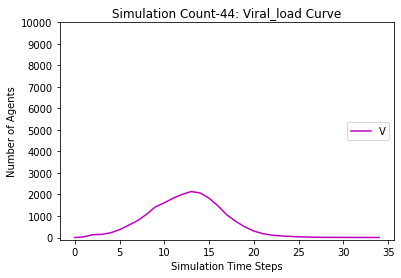

[9794, 9582, 9385, 9146, 8780, 8276, 7586, 6676, 5566, 4474, 3359, 2338, 1549, 991, 610, 377, 253, 177, 142, 113, 101, 93, 87, 82, 81, 79, 78, 78, 78, 78, 78, 77, 77, 77, 77, 77]
[206, 418, 288, 527, 847, 1306, 1799, 2470, 3214, 3322, 3877, 4151, 4017, 3483, 2749, 1961, 1153, 731, 431, 264, 152, 84, 55, 21, 15, 11, 9, 4, 3, 1, 0, 1, 1, 1, 1, 0]
[0, 0, 327, 327, 373, 418, 615, 854, 1220, 2204, 2764, 3511, 4434, 5526, 6641, 7662, 8594, 9092, 9427, 9623, 9747, 9823, 9858, 9897, 9904, 9910, 9913, 9918, 9919, 9921, 9922, 9922, 9922, 9922, 9922, 9923]
[0.0, 41.0, 132.5, 144.25, 223.125, 361.5625, 540.78125, 771.390625, 1104.6953125, 1397.34765625, 1605.673828125, 1813.8369140625, 1996.91845703125, 2074.459228515625, 1941.2296142578125, 1680.6148071289062, 1347.3074035644531, 956.6537017822266, 649.3268508911133, 423.66342544555664, 281.8317127227783, 186.91585636138916, 114.45792818069458, 73.22896409034729, 42.614482045173645, 24.307241022586823, 16.15362051129341, 11.076810255646706, 7.538

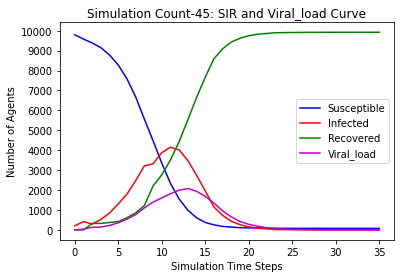

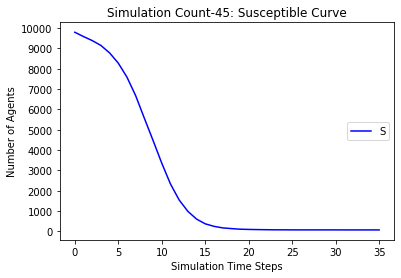

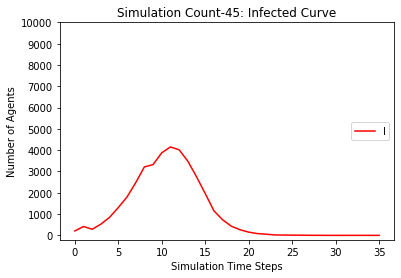

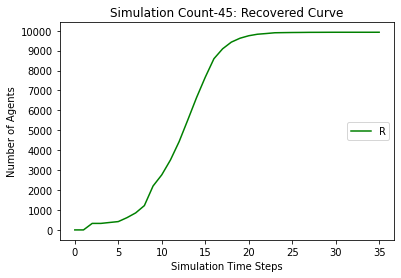

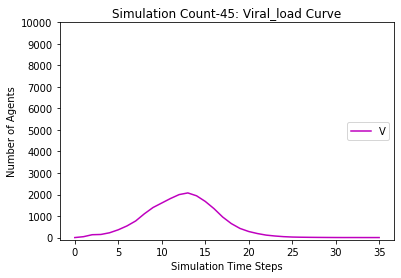

[9794, 9564, 9382, 9134, 8768, 8265, 7570, 6671, 5574, 4430, 3273, 2236, 1441, 918, 552, 343, 250, 201, 175, 157, 145, 134, 128, 122, 119, 115, 113, 113, 113, 113, 113, 113, 113]
[206, 436, 283, 531, 850, 1299, 1812, 2463, 3194, 3374, 3954, 4249, 4133, 3512, 2721, 1893, 1002, 606, 329, 186, 105, 67, 47, 27, 21, 18, 15, 9, 6, 2, 0, 0, 0]
[0, 0, 335, 335, 382, 436, 618, 866, 1232, 2196, 2773, 3515, 4426, 5570, 6727, 7764, 8748, 9193, 9496, 9657, 9750, 9799, 9825, 9851, 9860, 9867, 9872, 9878, 9881, 9885, 9887, 9887, 9887]
[0.0, 37.0, 138.5, 154.25, 229.125, 358.5625, 561.28125, 794.640625, 1089.3203125, 1436.66015625, 1686.330078125, 1955.1650390625, 2087.58251953125, 2154.791259765625, 2035.3956298828125, 1738.6978149414062, 1341.3489074707031, 909.6744537353516, 602.8372268676758, 381.4186134338379, 237.70930671691895, 140.85465335845947, 86.42732667922974, 52.21366333961487, 31.106831669807434, 19.553415834903717, 13.776707917451859, 9.88835395872593, 5.944176979362965, 3.972088489681

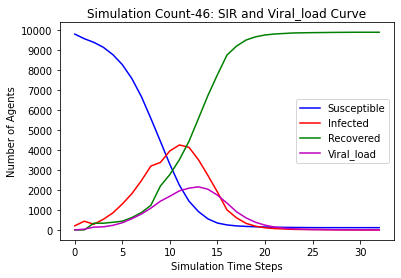

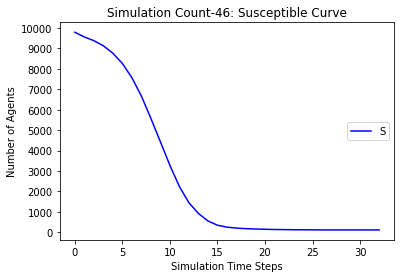

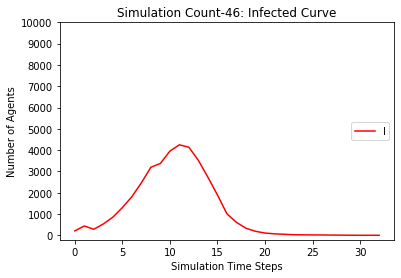

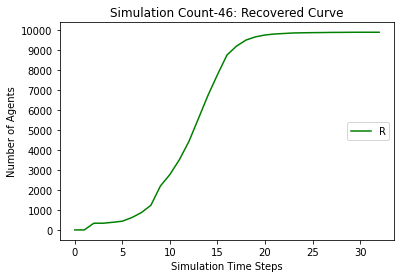

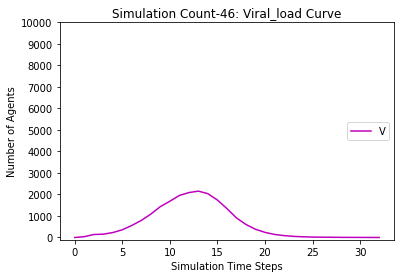

[9794, 9559, 9381, 9153, 8827, 8365, 7754, 6933, 5981, 4960, 3883, 2791, 1902, 1188, 689, 400, 266, 186, 140, 116, 101, 97, 94, 93, 91, 91, 90, 90, 88, 87, 86, 84, 84, 84, 84, 83, 83, 83, 83, 83]
[206, 441, 259, 487, 766, 1194, 1627, 2220, 2846, 2984, 3577, 3975, 4079, 3772, 3194, 2391, 1427, 867, 490, 284, 165, 89, 46, 16, 6, 4, 4, 3, 3, 4, 3, 5, 3, 3, 2, 1, 1, 1, 1, 0]
[0, 0, 360, 360, 407, 441, 619, 847, 1173, 2056, 2540, 3234, 4019, 5040, 6117, 7209, 8307, 8947, 9370, 9600, 9734, 9814, 9860, 9891, 9903, 9905, 9906, 9907, 9909, 9909, 9911, 9911, 9913, 9913, 9914, 9916, 9916, 9916, 9916, 9917]
[0.0, 30.0, 128.0, 138.0, 209.0, 332.5, 507.25, 715.625, 1004.8125, 1337.40625, 1501.703125, 1728.8515625, 1965.42578125, 2091.712890625, 2065.8564453125, 1893.92822265625, 1586.964111328125, 1161.4820556640625, 802.7410278320312, 516.3705139160156, 321.1852569580078, 189.5926284790039, 119.79631423950195, 68.89815711975098, 39.44907855987549, 20.724539279937744, 11.362269639968872, 6.681134819

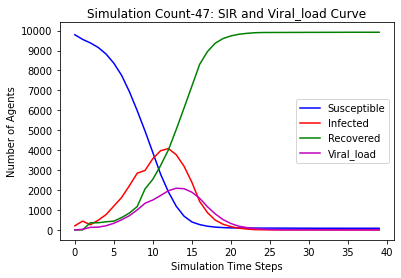

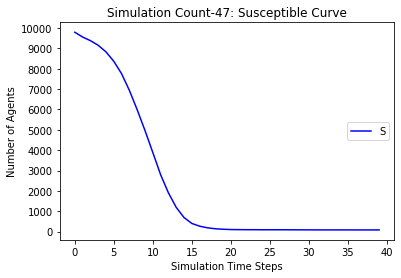

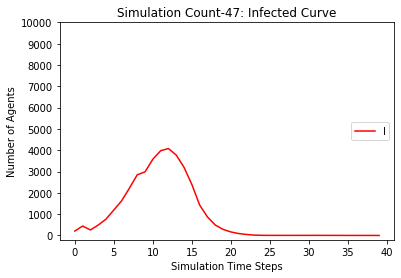

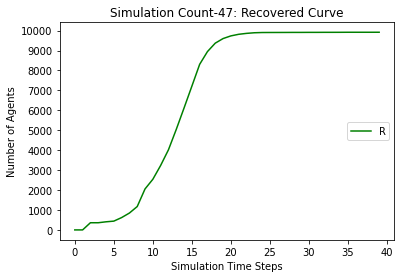

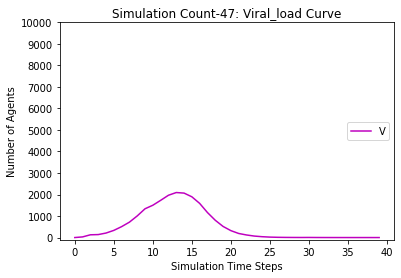

[9794, 9566, 9420, 9216, 8922, 8487, 7938, 7195, 6271, 5262, 4207, 3142, 2216, 1454, 900, 535, 339, 229, 180, 153, 136, 125, 114, 109, 107, 105, 104, 102, 101, 100, 99, 98, 98, 98, 98, 98]
[206, 434, 233, 437, 685, 1079, 1482, 2021, 2651, 2771, 3390, 3862, 4055, 3808, 3307, 2607, 1623, 1074, 651, 382, 203, 104, 66, 33, 23, 17, 10, 7, 6, 5, 5, 4, 3, 2, 1, 0]
[0, 0, 347, 347, 393, 434, 580, 784, 1078, 1967, 2403, 2996, 3729, 4738, 5793, 6858, 8038, 8697, 9169, 9465, 9661, 9771, 9820, 9858, 9870, 9878, 9886, 9891, 9893, 9895, 9896, 9898, 9899, 9900, 9901, 9902]
[0.0, 18.0, 106.0, 111.0, 177.5, 292.75, 459.375, 626.6875, 869.34375, 1181.671875, 1378.8359375, 1644.41796875, 1873.208984375, 1986.6044921875, 2028.30224609375, 1912.151123046875, 1630.0755615234375, 1217.0377807617188, 896.5188903808594, 615.2594451904297, 408.62972259521484, 256.3148612976074, 152.1574306488037, 95.07871532440186, 58.53935766220093, 37.269678831100464, 22.634839415550232, 11.317419707775116, 8.658709853887558,

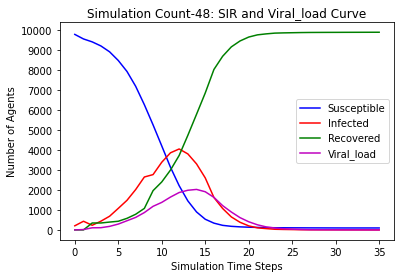

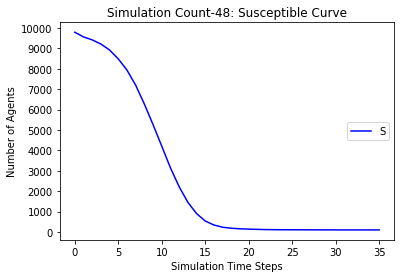

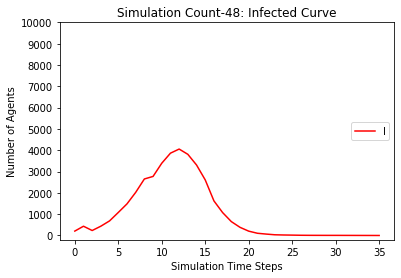

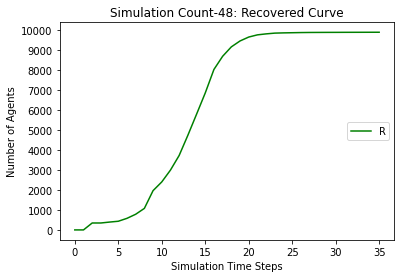

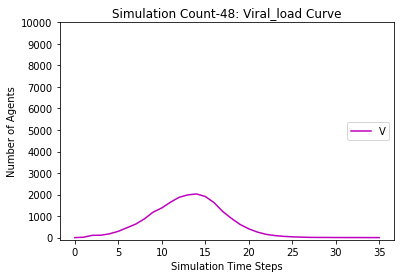

[9794, 9576, 9366, 9082, 8702, 8170, 7390, 6458, 5344, 4228, 3156, 2205, 1436, 901, 580, 361, 247, 175, 132, 108, 96, 90, 88, 88, 88, 87, 87, 87, 87, 87, 87, 87]
[206, 424, 314, 598, 923, 1406, 1976, 2624, 3358, 3459, 3870, 4056, 3908, 3327, 2576, 1844, 1040, 645, 410, 253, 151, 85, 44, 18, 7, 2, 1, 1, 1, 0, 0, 0]
[0, 0, 320, 320, 375, 424, 634, 918, 1298, 2313, 2974, 3739, 4656, 5772, 6844, 7795, 8713, 9180, 9458, 9639, 9753, 9825, 9868, 9894, 9905, 9911, 9912, 9912, 9912, 9913, 9913, 9913]
[0.0, 36.0, 132.0, 147.0, 258.5, 408.25, 600.125, 878.0625, 1195.03125, 1526.515625, 1708.2578125, 1909.12890625, 2030.564453125, 2083.2822265625, 1917.64111328125, 1643.820556640625, 1296.9102783203125, 954.4551391601562, 636.2275695800781, 417.11378479003906, 281.55689239501953, 176.77844619750977, 108.38922309875488, 68.19461154937744, 38.09730577468872, 24.04865288734436, 12.02432644367218, 6.01216322183609, 3.006081610918045, 2.5030408054590225, 1.2515204027295113, 0.6257602013647556]
0.0
[[],

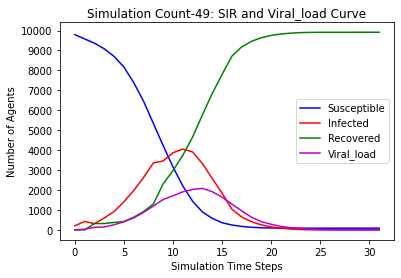

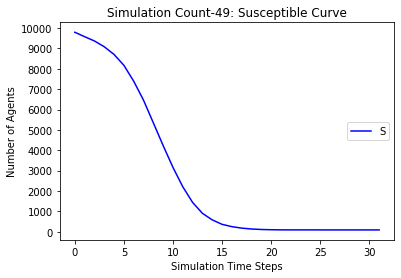

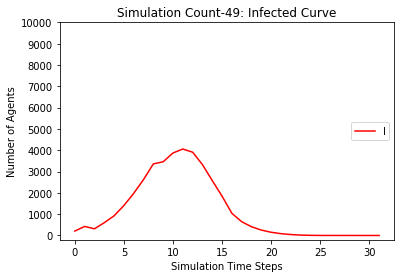

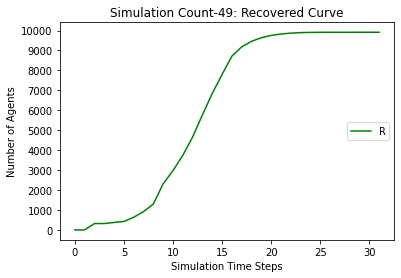

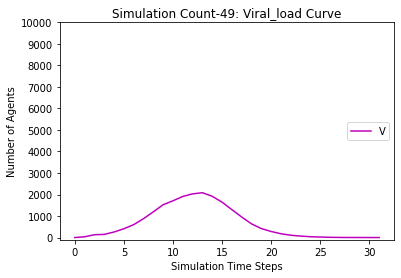

[9794, 9556, 9352, 9147, 8852, 8409, 7806, 7052, 6095, 5122, 4175, 3155, 2280, 1498, 945, 590, 399, 293, 227, 186, 164, 146, 134, 127, 123, 120, 118, 115, 115, 115, 115, 115, 115]
[206, 444, 297, 502, 754, 1147, 1546, 2095, 2757, 2850, 3306, 3708, 3815, 3624, 3230, 2565, 1609, 1037, 643, 404, 235, 147, 93, 46, 32, 24, 16, 12, 8, 5, 3, 0, 0]
[0, 0, 351, 351, 394, 444, 648, 853, 1148, 2028, 2519, 3137, 3905, 4878, 5825, 6845, 7992, 8670, 9130, 9410, 9601, 9707, 9773, 9827, 9845, 9856, 9866, 9873, 9877, 9880, 9882, 9885, 9885]
[0.0, 29.0, 136.5, 150.25, 207.125, 305.5625, 472.78125, 673.390625, 924.6953125, 1252.34765625, 1412.173828125, 1612.0869140625, 1843.04345703125, 1894.521728515625, 1932.2608642578125, 1832.1304321289062, 1607.0652160644531, 1217.5326080322266, 876.7663040161133, 612.3831520080566, 410.1915760040283, 271.09578800201416, 169.54789400100708, 111.77394700050354, 66.88697350025177, 44.443486750125885, 31.221743375062943, 18.61087168753147, 10.305435843765736, 6.152717

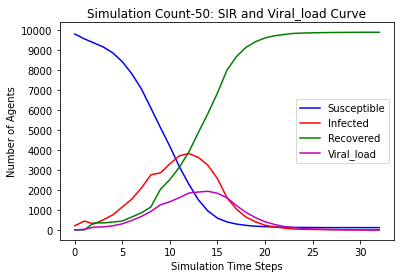

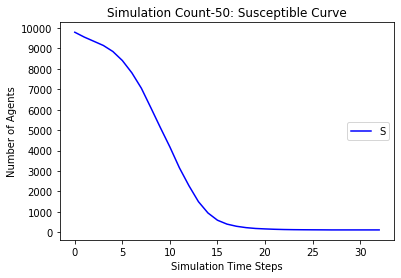

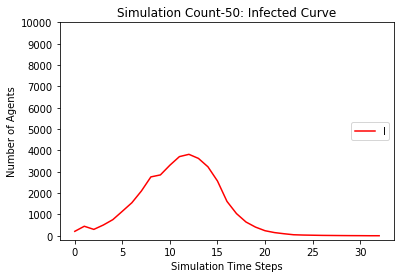

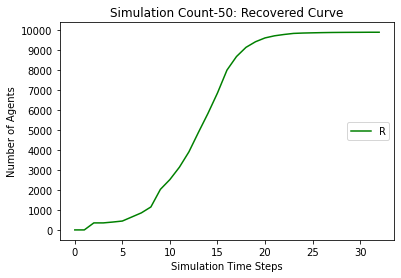

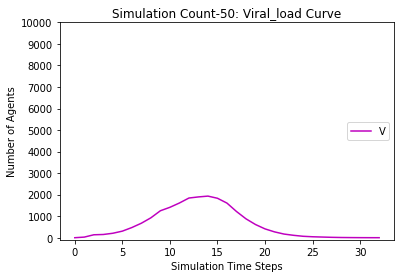

[9794, 9540, 9362, 9111, 8772, 8288, 7582, 6710, 5635, 4550, 3483, 2439, 1629, 1018, 597, 362, 234, 172, 132, 110, 99, 97, 92, 86, 83, 81, 80, 80, 79, 79, 76, 76, 75, 74, 73, 73, 73, 73, 72, 72, 72, 72, 72]
[206, 460, 257, 508, 805, 1252, 1780, 2401, 3137, 3279, 3758, 4074, 4006, 3532, 2886, 2077, 1158, 714, 419, 252, 135, 75, 40, 19, 14, 14, 12, 6, 4, 2, 4, 4, 4, 5, 3, 3, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 381, 381, 423, 460, 638, 889, 1228, 2171, 2759, 3487, 4365, 5450, 6517, 7561, 8608, 9114, 9449, 9638, 9766, 9828, 9868, 9895, 9903, 9905, 9908, 9914, 9917, 9919, 9920, 9920, 9921, 9921, 9924, 9924, 9925, 9926, 9927, 9927, 9927, 9927, 9928]
[0.0, 31.0, 140.5, 147.25, 210.625, 342.3125, 541.15625, 774.578125, 1052.2890625, 1413.14453125, 1662.572265625, 1952.2861328125, 2047.14306640625, 2114.571533203125, 2039.2857666015625, 1788.6428833007812, 1466.3214416503906, 1034.1607208251953, 701.0803604125977, 466.5401802062988, 300.2700901031494, 179.1350450515747, 103.56752252578735, 61.783761262

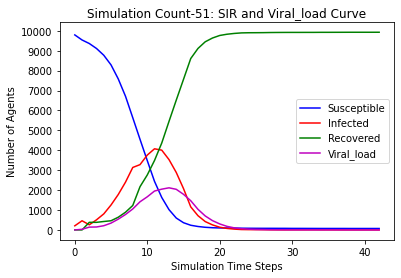

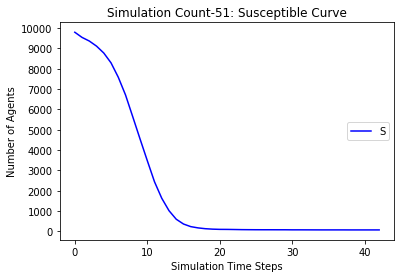

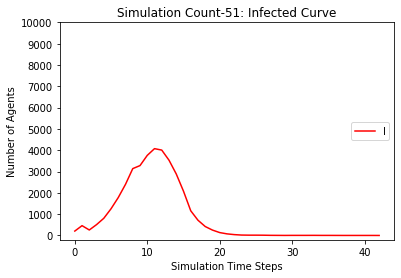

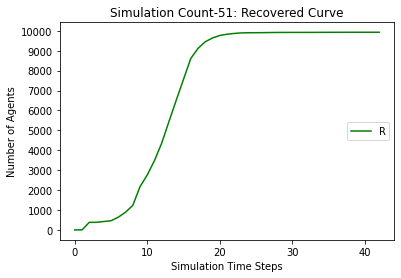

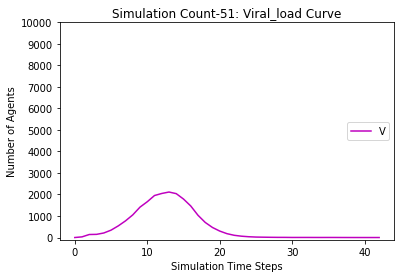

[9794, 9565, 9389, 9141, 8819, 8370, 7723, 6853, 5847, 4772, 3698, 2678, 1762, 1096, 708, 447, 317, 237, 186, 159, 141, 131, 125, 122, 119, 116, 115, 113, 112, 112, 112, 112, 112, 112, 112]
[206, 435, 276, 524, 795, 1195, 1666, 2288, 2972, 3160, 3707, 4017, 4085, 3676, 2990, 2231, 1290, 775, 491, 288, 176, 106, 61, 29, 19, 14, 10, 9, 7, 4, 2, 1, 0, 0, 0]
[0, 0, 335, 335, 386, 435, 611, 859, 1181, 2068, 2595, 3305, 4153, 5228, 6302, 7322, 8393, 8988, 9323, 9553, 9683, 9763, 9814, 9849, 9862, 9870, 9875, 9878, 9881, 9884, 9886, 9887, 9888, 9888, 9888]
[0.0, 34.0, 122.0, 142.0, 221.0, 347.5, 524.75, 700.375, 1000.1875, 1354.09375, 1572.046875, 1772.0234375, 1965.01171875, 2101.505859375, 2052.7529296875, 1834.37646484375, 1537.188232421875, 1114.5941162109375, 751.2970581054688, 495.6485290527344, 314.8242645263672, 211.4121322631836, 133.7060661315918, 76.8530330657959, 42.42651653289795, 28.213258266448975, 18.106629133224487, 9.053314566612244, 5.526657283306122, 4.763328641653061, 3.3

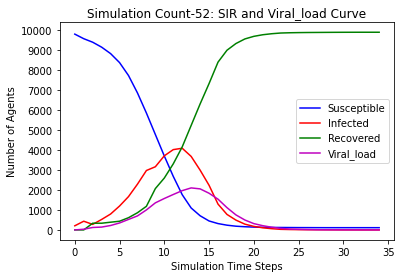

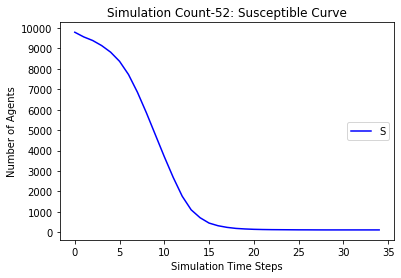

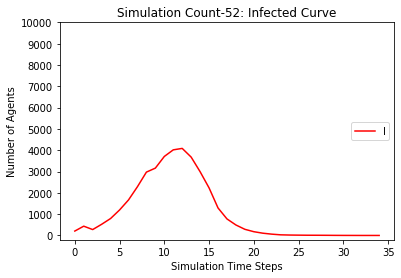

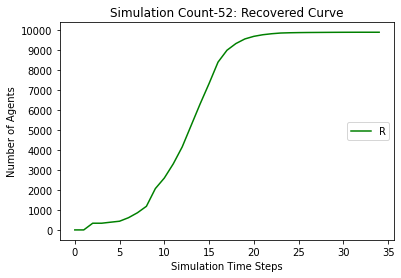

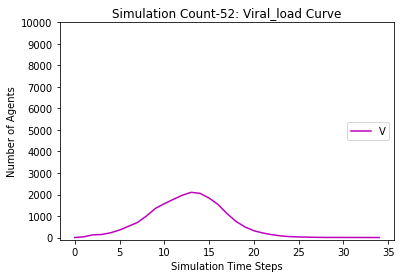

[9794, 9572, 9368, 9103, 8729, 8178, 7403, 6444, 5359, 4225, 3170, 2250, 1506, 976, 601, 405, 279, 222, 179, 152, 131, 120, 112, 107, 105, 105, 104, 104, 104, 104, 104, 104]
[206, 428, 299, 564, 888, 1394, 1965, 2659, 3370, 3509, 3897, 3995, 3853, 3249, 2569, 1845, 1062, 658, 385, 253, 148, 102, 67, 36, 23, 15, 8, 3, 1, 1, 0, 0]
[0, 0, 333, 333, 383, 428, 632, 897, 1271, 2266, 2933, 3755, 4641, 5775, 6830, 7750, 8659, 9120, 9436, 9595, 9721, 9778, 9821, 9857, 9872, 9880, 9888, 9893, 9895, 9895, 9896, 9896]
[0.0, 30.0, 127.0, 154.5, 238.25, 362.125, 609.0625, 836.53125, 1157.265625, 1479.6328125, 1695.81640625, 1910.908203125, 2042.4541015625, 2101.22705078125, 1914.613525390625, 1571.3067626953125, 1251.6533813476562, 891.8266906738281, 601.9133453369141, 399.95667266845703, 262.9783363342285, 170.48916816711426, 106.24458408355713, 68.12229204177856, 45.06114602088928, 30.53057301044464, 19.26528650522232, 9.63264325261116, 5.81632162630558, 2.90816081315279, 1.454080406576395, 0.7270

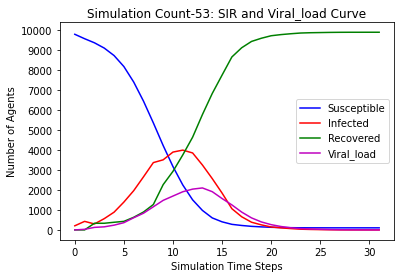

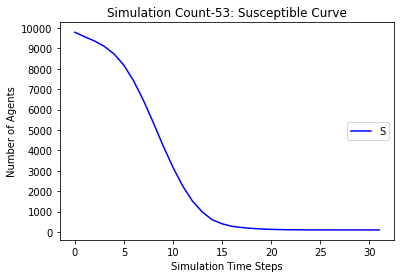

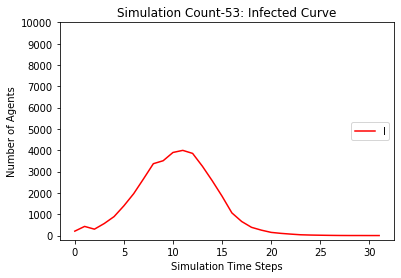

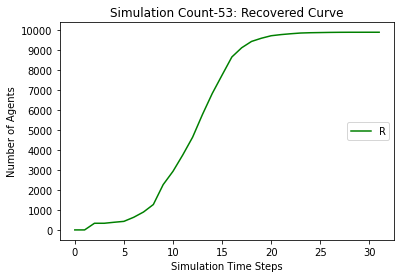

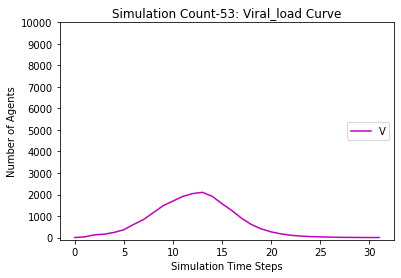

[9794, 9590, 9436, 9243, 8945, 8568, 7985, 7269, 6306, 5293, 4305, 3286, 2343, 1589, 1077, 696, 493, 375, 304, 263, 232, 201, 174, 167, 164, 160, 158, 156, 155, 153, 152, 152, 152, 151, 149, 149, 148, 148, 147, 147, 147, 146, 145, 145, 145, 144, 144, 144, 143, 143, 143, 143]
[206, 410, 232, 425, 676, 1022, 1451, 1974, 2639, 2868, 3379, 3790, 3963, 3704, 3228, 2590, 1582, 1040, 691, 433, 261, 174, 130, 51, 38, 23, 16, 11, 9, 7, 1, 1, 1, 2, 3, 3, 4, 1, 2, 2, 1, 2, 2, 2, 1, 2, 1, 1, 2, 1, 1, 0]
[0, 0, 332, 332, 379, 410, 564, 757, 1055, 1839, 2316, 2924, 3694, 4707, 5695, 6714, 7925, 8585, 9005, 9304, 9507, 9625, 9696, 9782, 9798, 9817, 9826, 9833, 9836, 9840, 9847, 9847, 9847, 9847, 9848, 9848, 9848, 9851, 9851, 9851, 9852, 9852, 9853, 9853, 9854, 9854, 9855, 9855, 9855, 9856, 9856, 9857]
[0.0, 30.0, 112.0, 110.0, 181.0, 276.5, 425.25, 615.625, 851.8125, 1135.90625, 1360.953125, 1608.4765625, 1828.23828125, 1994.119140625, 1960.0595703125, 1860.02978515625, 1617.014892578125, 1214.507446

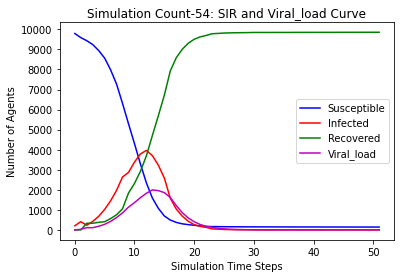

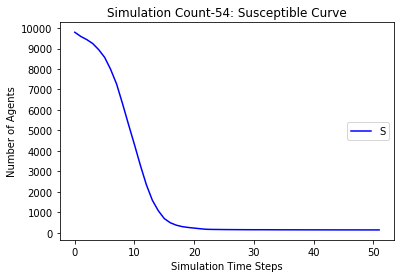

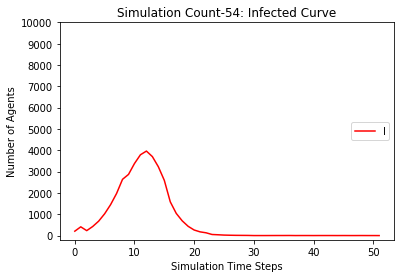

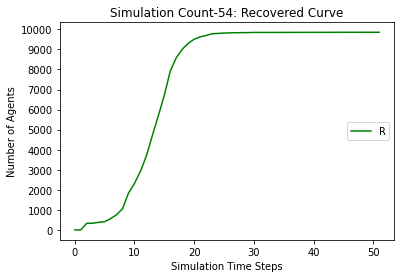

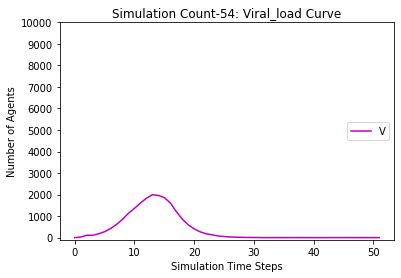

[9794, 9562, 9391, 9162, 8836, 8377, 7766, 6980, 6052, 5040, 3969, 2911, 2036, 1363, 855, 541, 373, 276, 210, 173, 150, 126, 114, 106, 105, 102, 101, 100, 95, 94, 94, 93, 93, 92, 92, 92, 92, 92]
[206, 438, 256, 485, 766, 1185, 1625, 2182, 2784, 2902, 3474, 3901, 4016, 3677, 3114, 2370, 1447, 967, 597, 368, 223, 150, 96, 50, 33, 19, 13, 6, 10, 8, 4, 4, 1, 2, 2, 1, 1, 0]
[0, 0, 353, 353, 398, 438, 609, 838, 1164, 2058, 2557, 3188, 3948, 4960, 6031, 7089, 8180, 8757, 9193, 9459, 9627, 9724, 9790, 9844, 9862, 9879, 9886, 9894, 9895, 9898, 9902, 9903, 9906, 9906, 9906, 9907, 9907, 9908]
[0.0, 29.0, 137.5, 146.75, 207.375, 313.6875, 482.84375, 702.421875, 949.2109375, 1241.60546875, 1462.802734375, 1660.4013671875, 1914.20068359375, 2036.100341796875, 2020.0501708984375, 1861.0250854492188, 1561.5125427246094, 1166.7562713623047, 846.3781356811523, 586.1890678405762, 380.0945339202881, 257.04726696014404, 173.52363348007202, 119.76181674003601, 71.880908370018, 45.940454185009, 27.9702270925

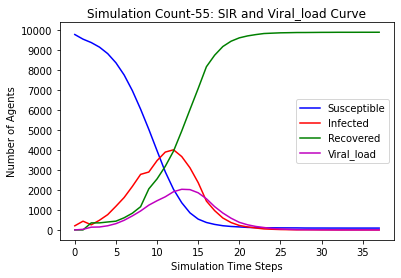

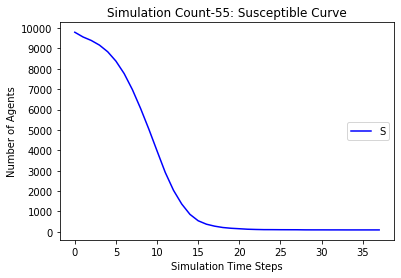

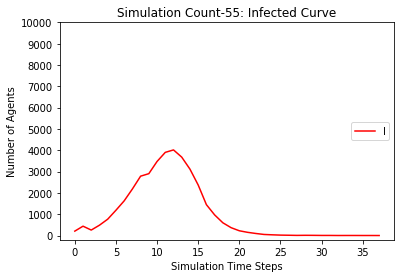

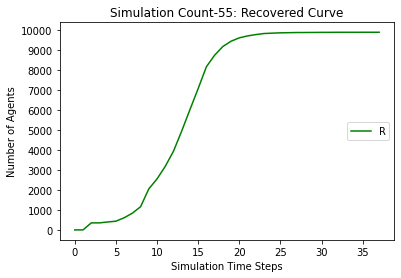

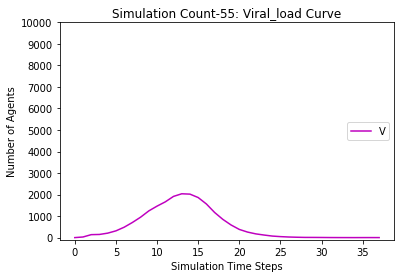

[9794, 9572, 9399, 9169, 8856, 8413, 7777, 6967, 5939, 4926, 3902, 2832, 1923, 1198, 756, 455, 297, 219, 185, 157, 141, 133, 126, 121, 115, 110, 106, 104, 104, 103, 103, 101, 100, 98, 98, 97, 97, 97, 97]
[206, 428, 257, 487, 757, 1159, 1622, 2202, 2917, 3058, 3557, 3951, 4016, 3728, 3146, 2377, 1420, 860, 515, 298, 156, 86, 59, 27, 20, 20, 20, 17, 11, 7, 2, 3, 4, 5, 5, 4, 3, 0, 0]
[0, 0, 344, 344, 387, 428, 601, 831, 1144, 2016, 2541, 3217, 4061, 5074, 6098, 7168, 8283, 8921, 9300, 9545, 9703, 9781, 9815, 9852, 9865, 9870, 9874, 9879, 9885, 9890, 9895, 9896, 9896, 9897, 9897, 9899, 9900, 9903, 9903]
[0.0, 31.0, 124.5, 129.25, 193.625, 306.8125, 476.40625, 702.203125, 981.1015625, 1292.55078125, 1509.275390625, 1742.6376953125, 1947.31884765625, 2083.659423828125, 2057.8297119140625, 1858.9148559570312, 1533.4574279785156, 1107.7287139892578, 786.8643569946289, 534.4321784973145, 336.2160892486572, 209.1080446243286, 133.5540223121643, 81.77701115608215, 47.88850557804108, 28.9442527890

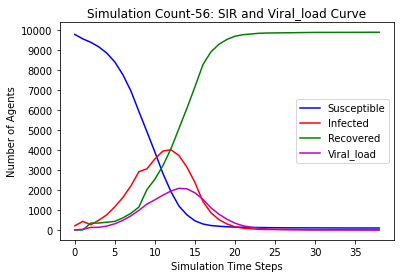

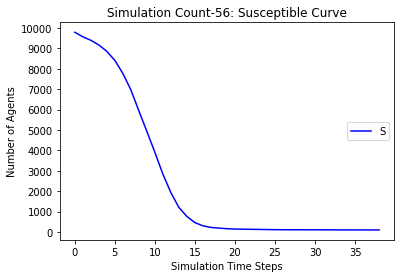

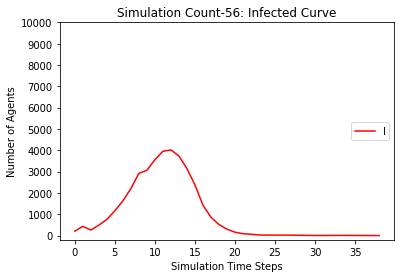

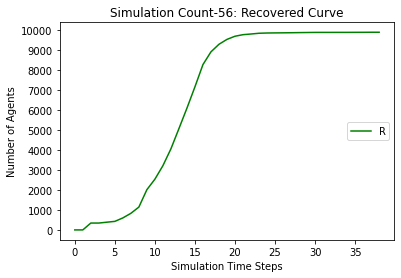

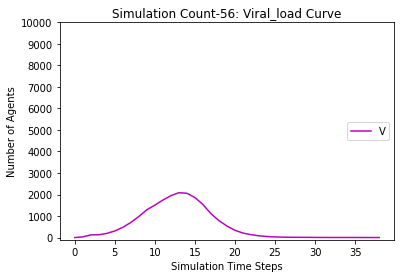

[9794, 9551, 9374, 9146, 8825, 8355, 7751, 6972, 5985, 4938, 3889, 2806, 1897, 1234, 765, 482, 344, 251, 191, 159, 136, 124, 115, 111, 109, 107, 107, 107, 107, 107, 107, 107]
[206, 449, 269, 497, 775, 1196, 1623, 2174, 2840, 2969, 3531, 3974, 4088, 3704, 3124, 2324, 1305, 844, 519, 323, 208, 127, 76, 35, 21, 16, 8, 4, 2, 0, 0, 0]
[0, 0, 357, 357, 400, 449, 626, 854, 1175, 2093, 2580, 3220, 4015, 5062, 6111, 7194, 8351, 8905, 9290, 9518, 9656, 9749, 9809, 9854, 9870, 9877, 9885, 9889, 9891, 9893, 9893, 9893]
[0.0, 30.0, 133.0, 146.5, 234.25, 345.125, 500.5625, 687.28125, 963.640625, 1330.8203125, 1551.41015625, 1751.705078125, 1963.8525390625, 2089.92626953125, 2003.963134765625, 1845.9815673828125, 1540.9907836914062, 1110.4953918457031, 789.2476959228516, 523.6238479614258, 335.8119239807129, 218.90596199035645, 139.45298099517822, 83.72649049758911, 50.863245248794556, 29.431622624397278, 17.71581131219864, 9.85790565609932, 5.92895282804966, 2.96447641402483, 1.482238207012415, 0.74

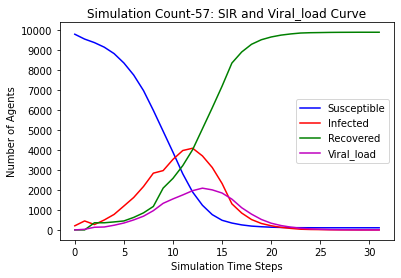

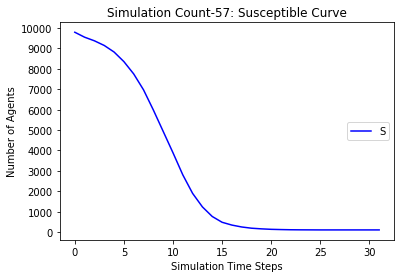

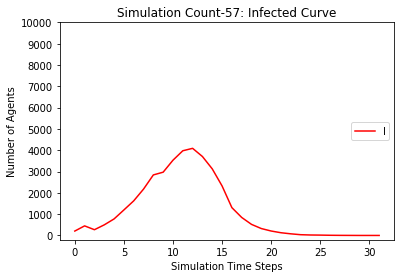

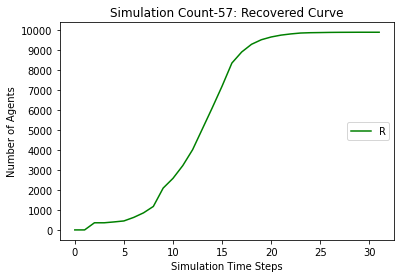

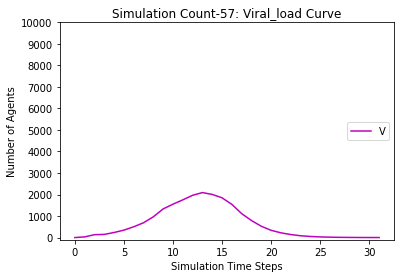

[9794, 9582, 9420, 9204, 8900, 8489, 7975, 7264, 6355, 5384, 4376, 3285, 2305, 1525, 952, 563, 357, 266, 204, 161, 135, 114, 98, 88, 84, 84, 84, 84, 84, 84, 84, 84, 84]
[206, 418, 244, 460, 720, 1093, 1445, 1940, 2545, 2703, 3288, 3810, 4050, 3859, 3424, 2722, 1678, 1101, 688, 402, 222, 152, 106, 61, 43, 26, 14, 4, 0, 0, 0, 0, 0]
[0, 0, 336, 336, 380, 418, 580, 796, 1100, 1913, 2336, 2905, 3645, 4616, 5624, 6715, 7965, 8633, 9108, 9437, 9643, 9734, 9796, 9851, 9873, 9890, 9902, 9912, 9916, 9916, 9916, 9916, 9916]
[0.0, 31.0, 115.5, 131.75, 183.875, 271.9375, 420.96875, 604.484375, 856.2421875, 1156.12109375, 1358.060546875, 1631.0302734375, 1832.51513671875, 2016.257568359375, 2040.1287841796875, 1953.0643920898438, 1723.5321960449219, 1299.766098022461, 905.8830490112305, 619.9415245056152, 413.9707622528076, 267.9853811264038, 174.9926905632019, 110.49634528160095, 71.24817264080048, 42.62408632040024, 28.31204316020012, 16.15602158010006, 9.07801079005003, 4.539005395025015, 2.26950

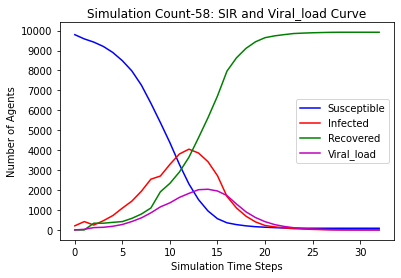

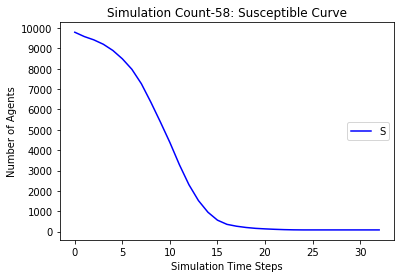

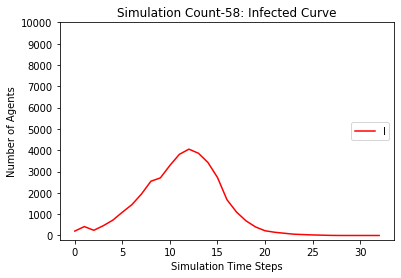

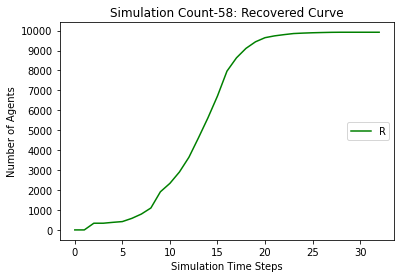

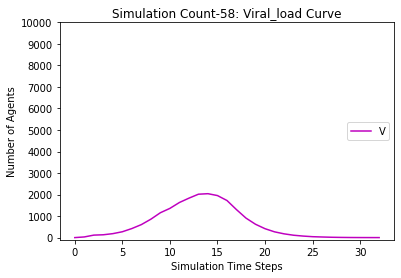

[9794, 9564, 9386, 9175, 8887, 8445, 7863, 7042, 6035, 5015, 3940, 2832, 1862, 1137, 697, 436, 292, 218, 174, 146, 127, 115, 110, 108, 105, 104, 104, 104, 102, 101, 99, 99, 99, 99, 99, 99]
[206, 436, 257, 468, 709, 1119, 1523, 2133, 2852, 2993, 3571, 4010, 4173, 3878, 3243, 2396, 1375, 807, 471, 290, 165, 103, 64, 31, 18, 9, 6, 4, 3, 3, 4, 4, 2, 2, 0, 0]
[0, 0, 357, 357, 404, 436, 614, 825, 1113, 1992, 2489, 3158, 3965, 4985, 6060, 7168, 8333, 8975, 9355, 9564, 9708, 9782, 9826, 9861, 9877, 9887, 9890, 9892, 9895, 9896, 9897, 9897, 9899, 9899, 9901, 9901]
[0.0, 35.0, 137.5, 139.75, 190.875, 268.4375, 447.21875, 690.609375, 915.3046875, 1292.65234375, 1501.326171875, 1824.6630859375, 2084.33154296875, 2203.165771484375, 2182.5828857421875, 1963.2914428710938, 1608.6457214355469, 1168.3228607177734, 816.1614303588867, 539.0807151794434, 344.5403575897217, 224.27017879486084, 143.13508939743042, 91.56754469871521, 53.783772349357605, 30.891886174678802, 17.4459430873394, 10.7229715436697,

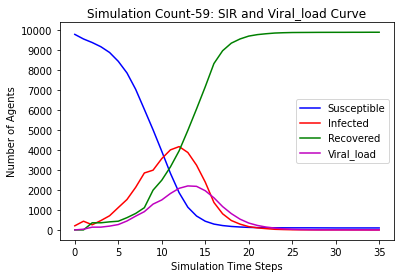

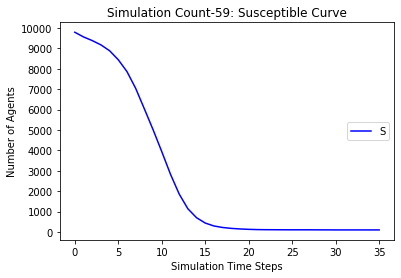

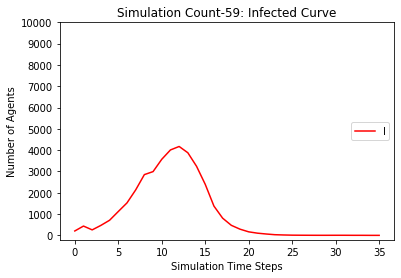

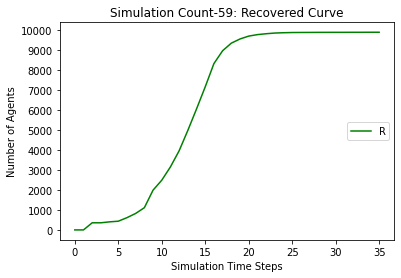

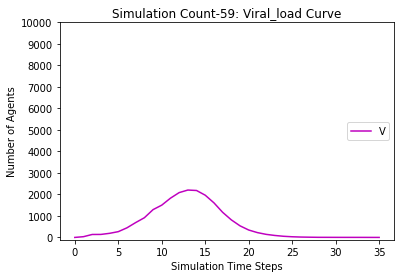

[9794, 9568, 9404, 9184, 8870, 8396, 7704, 6790, 5721, 4679, 3643, 2604, 1728, 1104, 706, 454, 322, 263, 220, 189, 167, 148, 134, 127, 124, 120, 117, 113, 111, 111, 111, 111, 111, 111]
[206, 432, 260, 480, 746, 1172, 1700, 2394, 3149, 3222, 3684, 3974, 3993, 3575, 2937, 2150, 1186, 718, 431, 265, 155, 115, 86, 49, 34, 25, 17, 14, 13, 9, 1, 1, 0, 0]
[0, 0, 336, 336, 384, 432, 596, 816, 1130, 2099, 2673, 3422, 4279, 5321, 6357, 7396, 8492, 9019, 9349, 9546, 9678, 9737, 9780, 9824, 9842, 9855, 9866, 9873, 9876, 9880, 9888, 9888, 9889, 9889]
[0.0, 30.0, 131.0, 135.5, 210.75, 314.375, 488.1875, 738.09375, 1045.046875, 1477.5234375, 1670.76171875, 1888.380859375, 2060.1904296875, 2102.09521484375, 2021.047607421875, 1807.5238037109375, 1466.7619018554688, 1053.3809509277344, 712.6904754638672, 468.3452377319336, 307.1726188659668, 193.5863094329834, 137.7931547164917, 93.89657735824585, 61.948288679122925, 39.97414433956146, 25.98707216978073, 15.993536084890366, 11.996768042445183, 8.998384

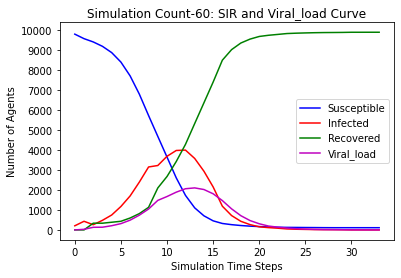

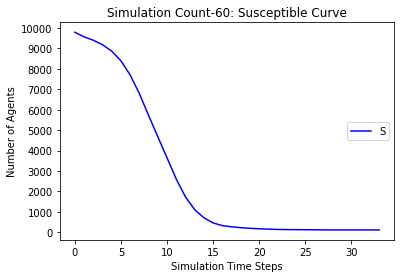

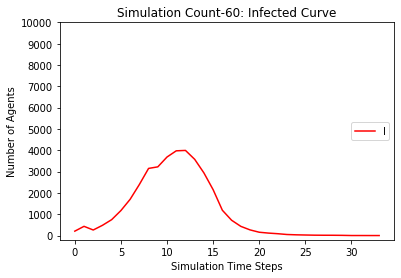

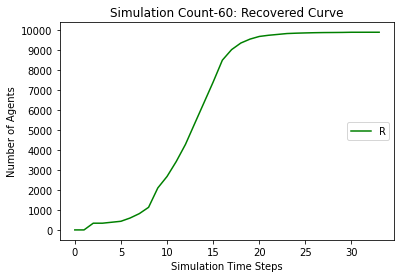

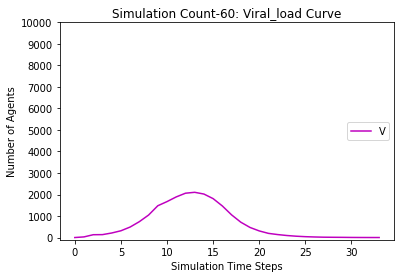

[9794, 9587, 9433, 9255, 8955, 8531, 7930, 7119, 6134, 5112, 4039, 2967, 2063, 1383, 899, 575, 396, 295, 222, 183, 157, 138, 126, 120, 116, 115, 112, 111, 109, 109, 108, 108, 108, 108, 108]
[206, 413, 233, 411, 667, 1056, 1503, 2136, 2821, 2982, 3558, 3973, 4071, 3729, 3140, 2392, 1433, 949, 614, 392, 239, 157, 96, 40, 30, 18, 14, 9, 7, 6, 4, 3, 1, 1, 0]
[0, 0, 334, 334, 378, 413, 567, 745, 1045, 1906, 2403, 3060, 3866, 4888, 5961, 7033, 8171, 8756, 9164, 9425, 9604, 9705, 9778, 9840, 9854, 9867, 9874, 9880, 9884, 9885, 9888, 9889, 9891, 9891, 9892]
[0.0, 28.0, 121.0, 131.5, 183.75, 288.875, 445.4375, 671.71875, 928.859375, 1238.4296875, 1472.21484375, 1720.107421875, 1928.0537109375, 2043.02685546875, 2055.513427734375, 1852.7567138671875, 1541.3783569335938, 1132.6891784667969, 806.3445892333984, 554.1722946166992, 375.0861473083496, 244.5430736541748, 156.2715368270874, 104.1357684135437, 66.06788420677185, 45.033942103385925, 27.516971051692963, 17.75848552584648, 9.87924276292324,

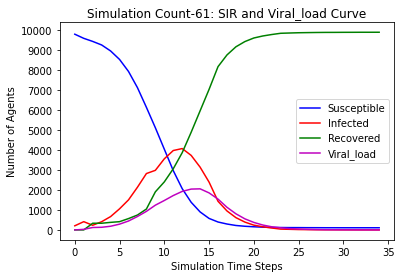

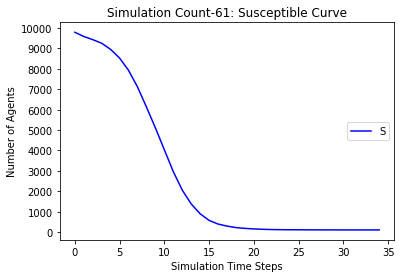

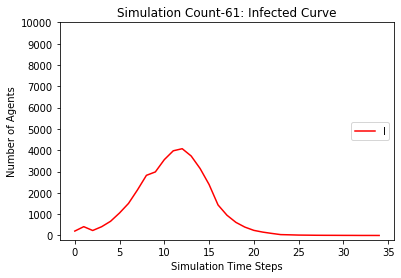

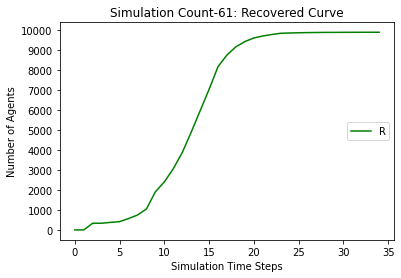

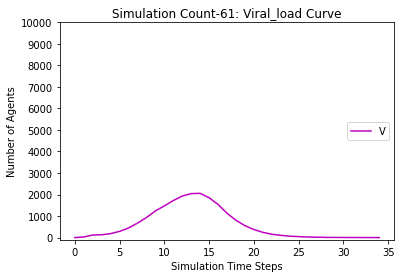

[9794, 9568, 9397, 9173, 8831, 8409, 7795, 7027, 6055, 4981, 3903, 2791, 1890, 1212, 776, 470, 318, 236, 190, 170, 153, 148, 144, 141, 140, 140, 140, 138, 136, 135, 135, 135, 135, 135]
[206, 432, 270, 494, 783, 1159, 1602, 2146, 2776, 2977, 3557, 4058, 4165, 3769, 3127, 2321, 1328, 834, 514, 300, 165, 88, 46, 17, 9, 5, 4, 3, 4, 5, 2, 1, 1, 0]
[0, 0, 333, 333, 386, 432, 603, 827, 1169, 2042, 2540, 3151, 3945, 5019, 6097, 7209, 8354, 8930, 9296, 9530, 9682, 9764, 9810, 9842, 9851, 9855, 9856, 9859, 9860, 9860, 9863, 9864, 9864, 9865]
[0.0, 29.0, 114.5, 131.25, 212.625, 302.3125, 484.15625, 698.078125, 927.0390625, 1244.51953125, 1462.259765625, 1665.1298828125, 1936.56494140625, 2111.282470703125, 2068.6412353515625, 1855.3206176757812, 1547.6603088378906, 1142.8301544189453, 785.4150772094727, 521.7075386047363, 334.85376930236816, 210.42688465118408, 132.21344232559204, 81.10672116279602, 45.55336058139801, 23.776680290699005, 12.888340145349503, 7.444170072674751, 4.722085036337376, 2

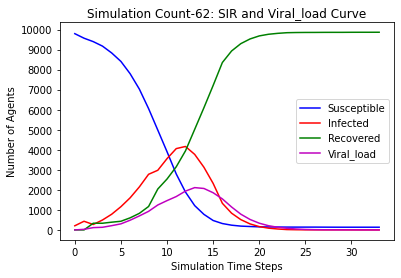

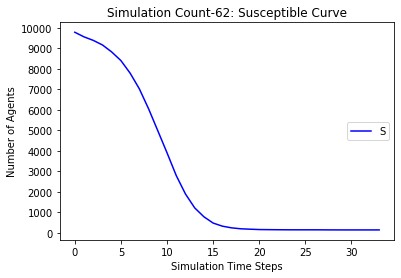

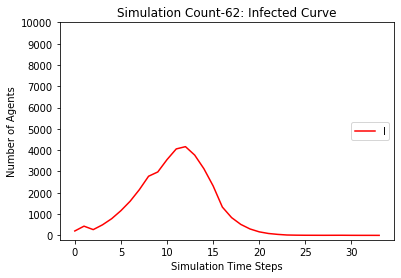

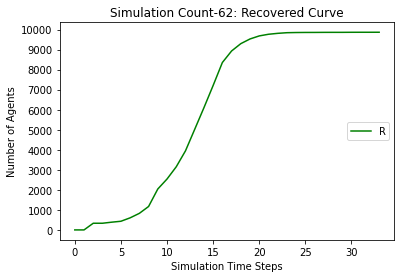

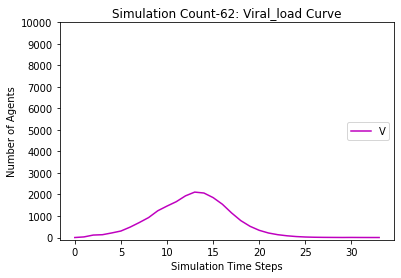

[9794, 9565, 9386, 9149, 8792, 8286, 7542, 6613, 5518, 4360, 3267, 2268, 1484, 912, 595, 389, 266, 212, 168, 137, 127, 112, 102, 98, 98, 98, 98, 98, 98, 98, 98]
[206, 435, 276, 513, 823, 1279, 1844, 2536, 3274, 3474, 3928, 4153, 4034, 3448, 2672, 1879, 1026, 593, 384, 252, 139, 100, 66, 18, 12, 5, 4, 0, 0, 0, 0]
[0, 0, 338, 338, 385, 435, 614, 851, 1208, 2166, 2805, 3579, 4482, 5640, 6733, 7732, 8708, 9195, 9448, 9611, 9734, 9788, 9832, 9884, 9890, 9897, 9898, 9902, 9902, 9902, 9902]
[0.0, 33.0, 132.5, 148.25, 230.125, 385.0625, 564.53125, 813.265625, 1135.6328125, 1532.81640625, 1729.408203125, 2014.7041015625, 2120.35205078125, 2149.176025390625, 2013.5880126953125, 1720.7940063476562, 1318.3970031738281, 917.1985015869141, 623.599250793457, 406.7996253967285, 268.39981269836426, 169.19990634918213, 113.59995317459106, 74.79997658729553, 40.399988293647766, 22.199994146823883, 11.099997073411942, 6.549998536705971, 3.2749992683529854, 1.6374996341764927, 0.8187498170882463]
0.0
[[], 

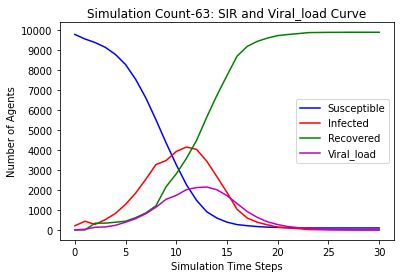

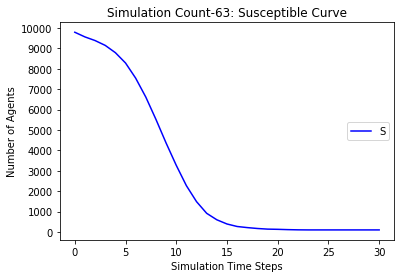

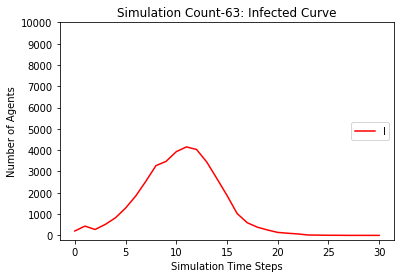

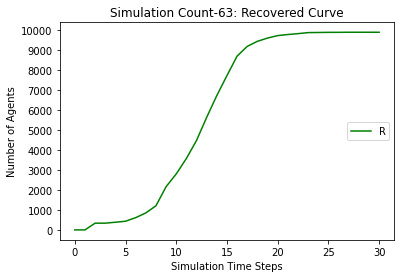

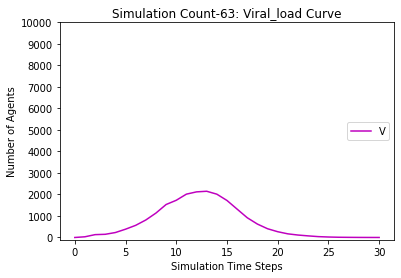

[9794, 9560, 9395, 9168, 8836, 8381, 7762, 6915, 5851, 4747, 3712, 2740, 1873, 1233, 767, 495, 333, 251, 204, 172, 147, 134, 128, 120, 116, 114, 111, 111, 111, 111, 111, 110, 110, 110, 110, 110, 109, 107, 106, 105, 105, 105, 105, 105]
[206, 440, 260, 487, 774, 1179, 1633, 2253, 2985, 3196, 3706, 3976, 3978, 3514, 2945, 2245, 1289, 830, 503, 323, 186, 117, 76, 37, 25, 20, 17, 9, 5, 3, 0, 1, 1, 1, 1, 0, 1, 3, 4, 5, 4, 2, 1, 0]
[0, 0, 345, 345, 390, 440, 605, 832, 1164, 2057, 2582, 3284, 4149, 5253, 6288, 7260, 8378, 8919, 9293, 9505, 9667, 9749, 9796, 9843, 9859, 9866, 9872, 9880, 9884, 9886, 9889, 9889, 9889, 9889, 9889, 9890, 9890, 9890, 9890, 9890, 9891, 9893, 9894, 9895]
[0.0, 24.0, 107.0, 131.5, 214.75, 318.375, 506.1875, 752.09375, 1064.046875, 1390.0234375, 1592.01171875, 1783.005859375, 1978.5029296875, 2056.25146484375, 1985.125732421875, 1771.5628662109375, 1464.7814331054688, 1063.3907165527344, 736.6953582763672, 498.3476791381836, 329.1738395690918, 208.5869197845459, 133.29

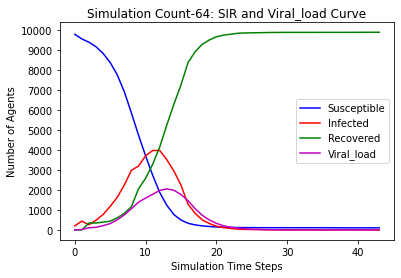

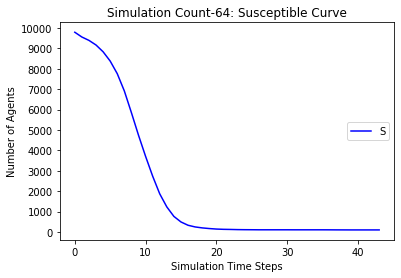

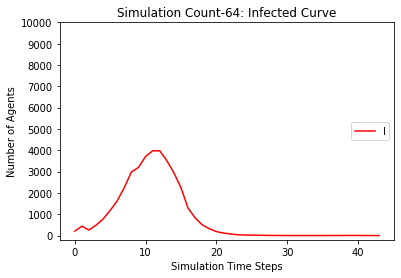

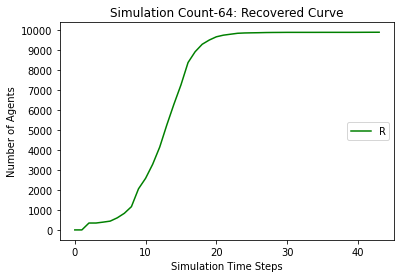

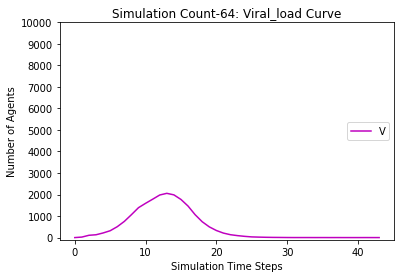

[9794, 9547, 9386, 9169, 8864, 8441, 7837, 7025, 6008, 4980, 3912, 2879, 1968, 1266, 800, 506, 314, 209, 153, 127, 111, 93, 88, 87, 84, 84, 83, 83, 83, 83, 83, 83, 83]
[206, 453, 237, 454, 722, 1106, 1549, 2144, 2856, 2989, 3574, 3953, 4040, 3714, 3112, 2373, 1415, 931, 588, 379, 203, 116, 65, 27, 19, 9, 5, 4, 1, 1, 0, 0, 0]
[0, 0, 377, 377, 414, 453, 614, 831, 1136, 2031, 2514, 3168, 3992, 5020, 6088, 7121, 8271, 8860, 9259, 9494, 9686, 9791, 9847, 9886, 9897, 9907, 9912, 9913, 9916, 9916, 9917, 9917, 9917]
[0.0, 27.0, 126.5, 131.25, 192.625, 295.3125, 449.65625, 670.828125, 970.4140625, 1350.20703125, 1540.103515625, 1806.0517578125, 2025.02587890625, 2097.512939453125, 2046.7564697265625, 1855.3782348632812, 1543.6891174316406, 1133.8445587158203, 811.9222793579102, 545.9611396789551, 353.98056983947754, 228.99028491973877, 150.49514245986938, 94.24757122993469, 54.123785614967346, 32.06189280748367, 20.030946403741837, 13.015473201870918, 8.50773660093546, 4.25386830046773, 3.12693

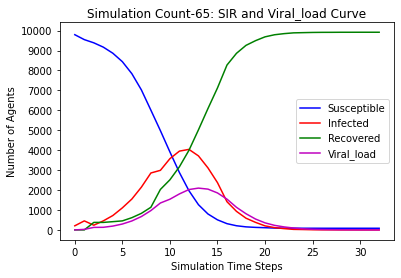

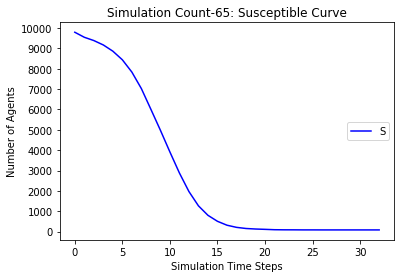

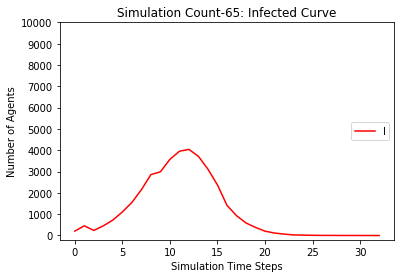

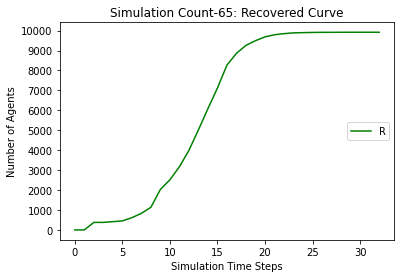

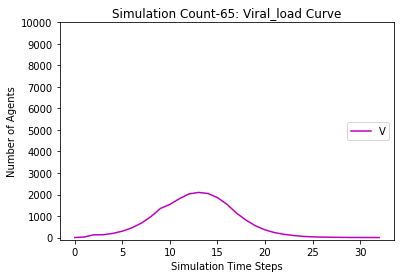

[9794, 9574, 9398, 9219, 8957, 8567, 8016, 7292, 6388, 5425, 4361, 3328, 2338, 1570, 996, 602, 375, 270, 219, 178, 153, 139, 125, 116, 114, 114, 113, 110, 110, 110, 110, 109, 109, 109, 109, 109, 109]
[206, 426, 240, 419, 647, 1007, 1382, 1927, 2569, 2721, 3332, 3769, 4050, 3855, 3365, 2726, 1705, 1159, 728, 424, 222, 131, 94, 55, 35, 23, 12, 6, 4, 4, 1, 1, 1, 1, 1, 0, 0]
[0, 0, 362, 362, 396, 426, 602, 781, 1043, 1854, 2307, 2903, 3612, 4575, 5639, 6672, 7920, 8571, 9053, 9398, 9625, 9730, 9781, 9829, 9851, 9863, 9875, 9884, 9886, 9886, 9889, 9890, 9890, 9890, 9890, 9891, 9891]
[0.0, 25.0, 112.5, 118.25, 171.125, 258.5625, 437.28125, 611.640625, 833.8203125, 1111.91015625, 1340.955078125, 1627.4775390625, 1890.73876953125, 2034.369384765625, 2021.1846923828125, 1902.5923461914062, 1687.2961730957031, 1309.6480865478516, 948.8240432739258, 659.4120216369629, 429.70601081848145, 275.8530054092407, 172.92650270462036, 109.46325135231018, 65.73162567615509, 39.865812838077545, 23.932906419

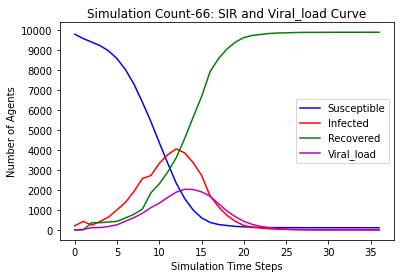

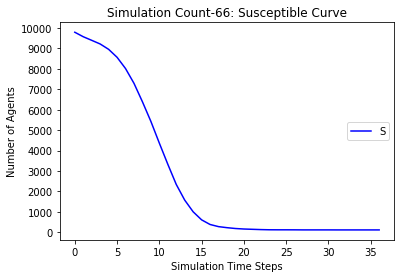

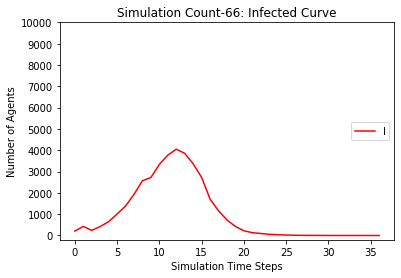

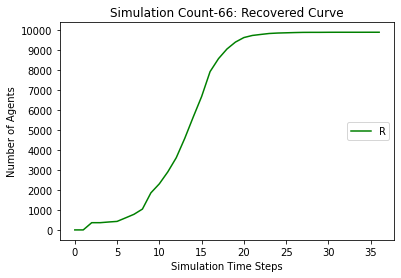

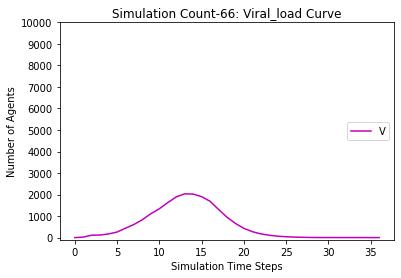

[9794, 9552, 9351, 9106, 8736, 8236, 7575, 6651, 5595, 4493, 3386, 2424, 1619, 1030, 648, 412, 275, 205, 147, 123, 108, 98, 90, 89, 85, 84, 83, 82, 80, 79, 79, 79, 78, 77, 77, 76, 76, 76]
[206, 448, 295, 540, 868, 1316, 1776, 2455, 3141, 3297, 3855, 4051, 3976, 3463, 2738, 2012, 1147, 711, 455, 289, 167, 107, 57, 27, 21, 13, 7, 7, 5, 5, 1, 1, 2, 2, 2, 3, 2, 0]
[0, 0, 354, 354, 396, 448, 649, 894, 1264, 2210, 2759, 3525, 4405, 5507, 6614, 7576, 8578, 9084, 9398, 9588, 9725, 9795, 9853, 9884, 9894, 9903, 9910, 9911, 9915, 9916, 9920, 9920, 9920, 9921, 9921, 9921, 9922, 9924]
[0.0, 36.0, 147.0, 146.5, 231.25, 369.625, 546.8125, 800.40625, 1133.203125, 1526.6015625, 1710.30078125, 1946.150390625, 2093.0751953125, 2122.53759765625, 1951.268798828125, 1705.6343994140625, 1376.8171997070312, 962.4085998535156, 661.2042999267578, 455.6021499633789, 324.80107498168945, 217.40053749084473, 143.70026874542236, 81.85013437271118, 45.92506718635559, 28.962533593177795, 17.481266796588898, 10.740633

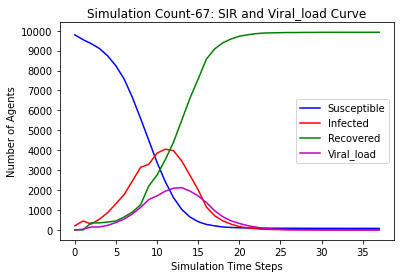

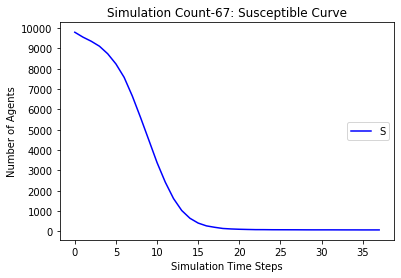

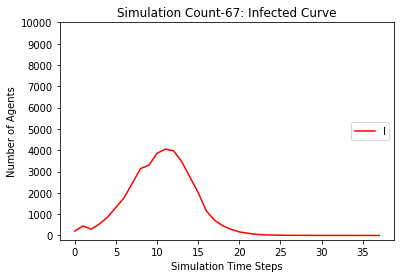

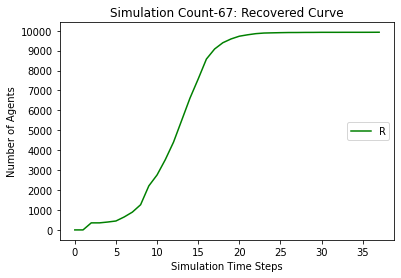

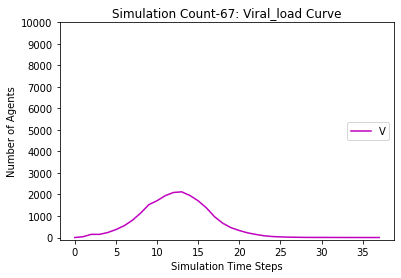

[9794, 9552, 9359, 9078, 8718, 8210, 7516, 6655, 5585, 4498, 3389, 2395, 1582, 991, 608, 377, 262, 188, 152, 129, 119, 106, 101, 96, 94, 91, 90, 89, 89, 89, 89, 89]
[206, 448, 288, 569, 884, 1342, 1843, 2423, 3133, 3272, 3792, 4079, 4003, 3507, 2781, 2018, 1166, 709, 422, 248, 143, 82, 51, 32, 24, 15, 11, 7, 5, 2, 1, 0]
[0, 0, 353, 353, 398, 448, 641, 922, 1282, 2230, 2819, 3526, 4415, 5502, 6611, 7605, 8572, 9103, 9426, 9623, 9738, 9812, 9848, 9872, 9882, 9894, 9899, 9904, 9906, 9909, 9910, 9911]
[0.0, 34.0, 145.0, 152.5, 247.25, 394.625, 573.3125, 805.65625, 1097.828125, 1448.9140625, 1644.45703125, 1883.228515625, 2061.6142578125, 2135.80712890625, 1976.903564453125, 1699.4517822265625, 1369.7258911132812, 1005.8629455566406, 676.9314727783203, 438.46573638916016, 278.2328681945801, 176.11643409729004, 105.05821704864502, 64.52910852432251, 37.264554262161255, 22.632277131080627, 14.316138565540314, 9.158069282770157, 5.579034641385078, 3.789517320692539, 1.8947586603462696, 0.94737

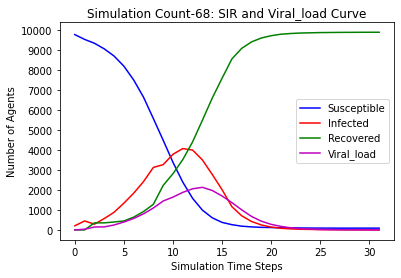

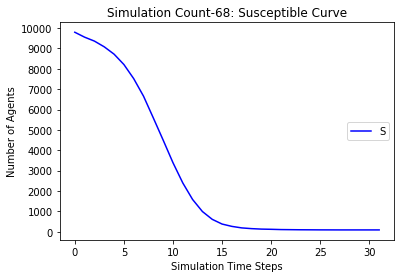

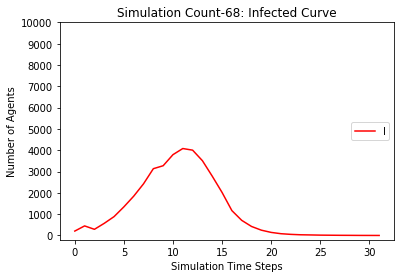

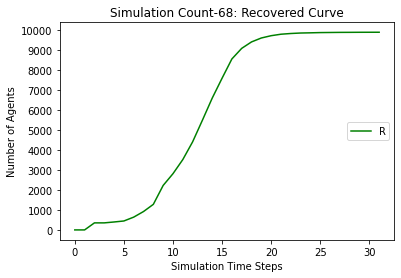

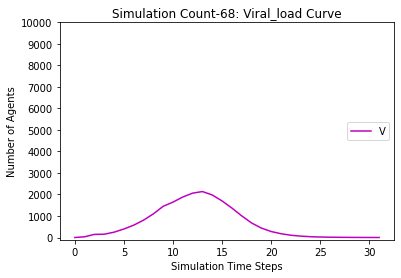

[9794, 9553, 9379, 9150, 8806, 8342, 7718, 6909, 5971, 4929, 3849, 2759, 1870, 1217, 742, 454, 288, 189, 143, 112, 100, 94, 88, 85, 85, 85, 85, 85, 85, 85, 85]
[206, 447, 258, 487, 784, 1211, 1661, 2241, 2835, 2980, 3538, 3973, 4101, 3712, 3107, 2305, 1324, 873, 533, 342, 188, 95, 55, 19, 11, 7, 3, 0, 0, 0, 0]
[0, 0, 363, 363, 410, 447, 621, 850, 1194, 2091, 2613, 3268, 4029, 5071, 6151, 7241, 8388, 8938, 9324, 9546, 9712, 9811, 9857, 9896, 9904, 9908, 9912, 9915, 9915, 9915, 9915]
[0.0, 33.0, 132.5, 136.25, 211.125, 315.5625, 506.78125, 730.390625, 994.1953125, 1320.09765625, 1489.048828125, 1715.5244140625, 1948.76220703125, 2070.381103515625, 2027.1905517578125, 1868.5952758789062, 1565.2976379394531, 1144.6488189697266, 800.3244094848633, 540.1622047424316, 376.0811023712158, 251.0405511856079, 160.52027559280396, 98.26013779640198, 52.13006889820099, 26.065034449100494, 13.032517224550247, 7.516258612275124, 3.758129306137562, 1.879064653068781, 0.9395323265343904]
0.0
[[], [9794,

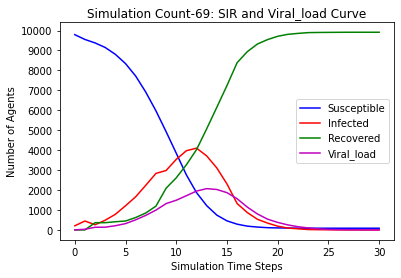

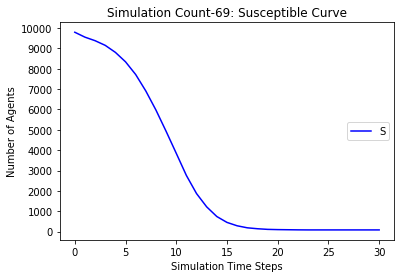

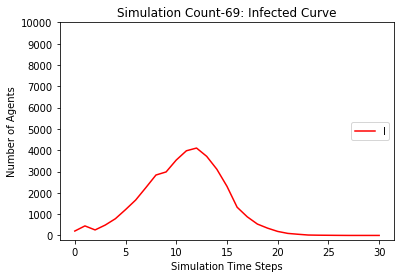

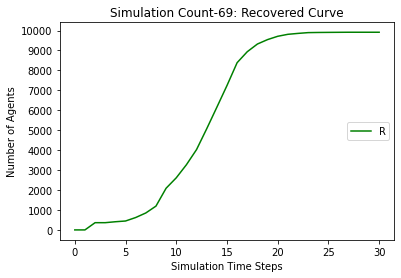

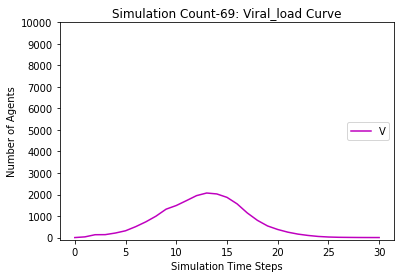

[9794, 9548, 9338, 9118, 8778, 8330, 7701, 6924, 5972, 4936, 3888, 2853, 1964, 1210, 744, 468, 326, 229, 172, 136, 117, 106, 97, 95, 94, 92, 92, 92, 92, 92, 92, 92]
[206, 452, 301, 521, 814, 1218, 1637, 2194, 2806, 2957, 3496, 3898, 4008, 3726, 3144, 2385, 1436, 871, 530, 332, 209, 123, 75, 32, 18, 11, 5, 3, 2, 0, 0, 0]
[0, 0, 361, 361, 408, 452, 662, 882, 1222, 2107, 2616, 3249, 4028, 5064, 6112, 7147, 8238, 8900, 9298, 9532, 9674, 9771, 9828, 9873, 9888, 9897, 9903, 9905, 9906, 9908, 9908, 9908]
[0.0, 35.0, 141.5, 134.75, 209.375, 339.6875, 534.84375, 730.421875, 962.2109375, 1267.10546875, 1457.552734375, 1705.7763671875, 1950.88818359375, 2060.444091796875, 2071.2220458984375, 1907.6110229492188, 1618.8055114746094, 1211.4027557373047, 825.7013778686523, 546.8506889343262, 368.4253444671631, 250.21267223358154, 153.10633611679077, 95.55316805839539, 55.77658402919769, 31.888292014598846, 17.944146007299423, 9.972073003649712, 4.986036501824856, 2.493018250912428, 1.246509125456214,

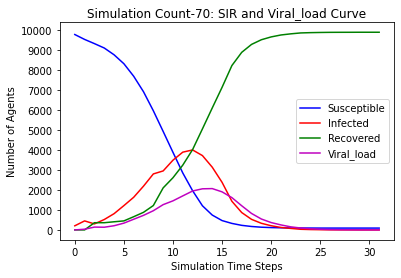

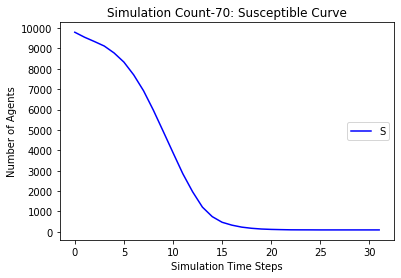

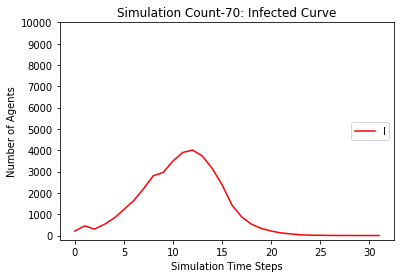

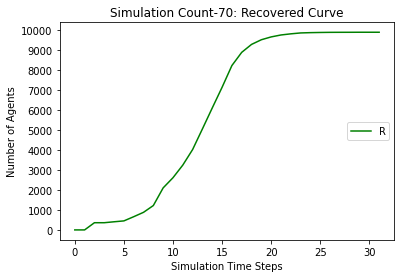

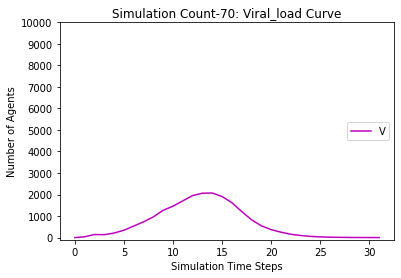

[9794, 9550, 9359, 9107, 8728, 8253, 7571, 6671, 5584, 4464, 3323, 2353, 1579, 970, 605, 401, 285, 220, 183, 156, 145, 139, 131, 126, 124, 122, 122, 121, 121, 121, 121, 121, 121]
[206, 450, 284, 536, 867, 1297, 1788, 2436, 3144, 3360, 3926, 4132, 4005, 3494, 2718, 1952, 1117, 654, 385, 245, 140, 81, 52, 21, 15, 13, 9, 5, 3, 1, 0, 0, 0]
[0, 0, 357, 357, 405, 450, 641, 893, 1272, 2176, 2751, 3515, 4416, 5536, 6677, 7647, 8598, 9126, 9432, 9599, 9715, 9780, 9817, 9853, 9861, 9865, 9869, 9874, 9876, 9878, 9879, 9879, 9879]
[0.0, 35.0, 135.5, 165.75, 241.875, 344.9375, 515.46875, 757.734375, 1068.8671875, 1409.43359375, 1667.716796875, 1954.8583984375, 2138.42919921875, 2165.214599609375, 2035.6072998046875, 1738.8036499023438, 1365.4018249511719, 926.7009124755859, 624.350456237793, 414.1752281188965, 268.08761405944824, 165.04380702972412, 99.52190351486206, 62.76095175743103, 34.380475878715515, 19.190237939357758, 12.595118969678879, 9.29755948483944, 5.64877974241972, 4.82438987120986,

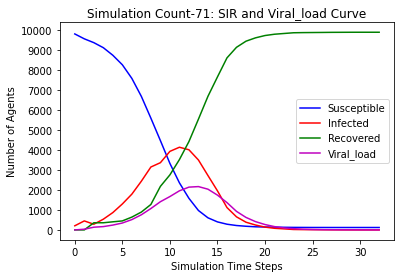

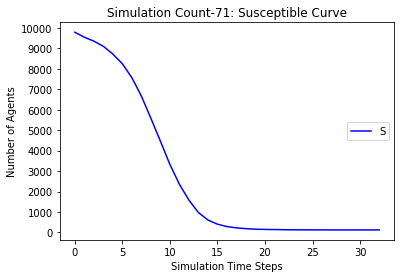

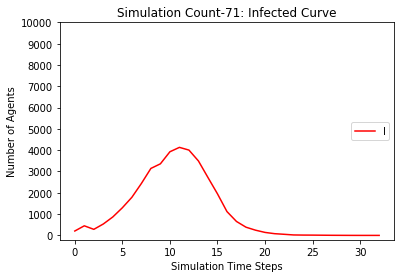

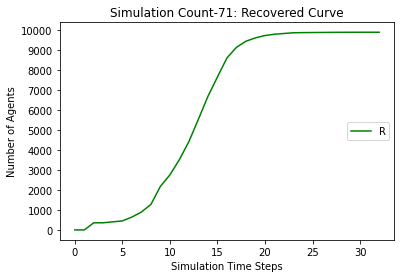

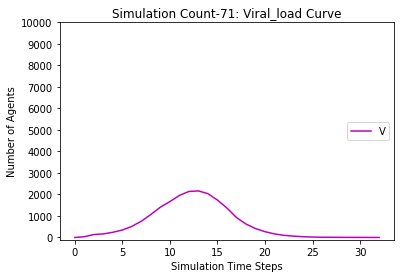

[9794, 9564, 9349, 9094, 8719, 8167, 7510, 6573, 5480, 4388, 3350, 2311, 1455, 878, 538, 337, 234, 176, 144, 125, 116, 111, 109, 108, 108, 108, 108, 108, 108, 107, 106, 105, 105, 104, 101, 101, 100, 100, 100, 100, 99, 99, 99, 99, 99]
[206, 436, 317, 572, 894, 1397, 1839, 2521, 3239, 3335, 3828, 4076, 4025, 3510, 2812, 1974, 1053, 616, 362, 212, 118, 65, 35, 11, 4, 2, 1, 0, 0, 1, 2, 3, 3, 3, 5, 4, 5, 4, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 334, 334, 387, 436, 651, 906, 1281, 2277, 2822, 3613, 4520, 5612, 6650, 7689, 8713, 9208, 9494, 9663, 9766, 9824, 9856, 9881, 9888, 9890, 9891, 9892, 9892, 9892, 9892, 9892, 9892, 9893, 9894, 9895, 9895, 9896, 9899, 9899, 9900, 9900, 9900, 9900, 9901]
[0.0, 31.0, 140.5, 160.25, 251.125, 365.5625, 585.78125, 871.890625, 1155.9453125, 1511.97265625, 1716.986328125, 1877.4931640625, 2091.74658203125, 2062.873291015625, 2003.4366455078125, 1798.7183227539062, 1427.3591613769531, 970.6795806884766, 629.3397903442383, 416.66989517211914, 265.33494758605957, 168.6674

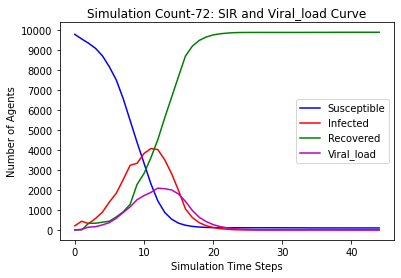

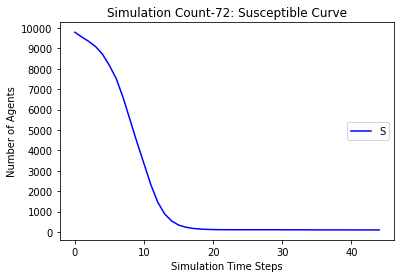

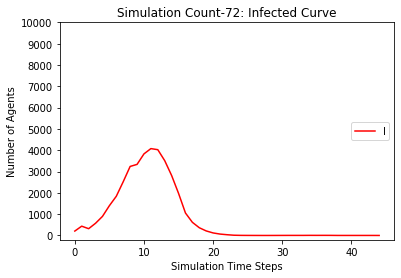

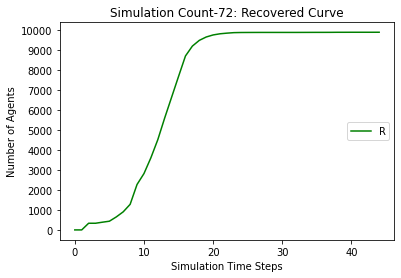

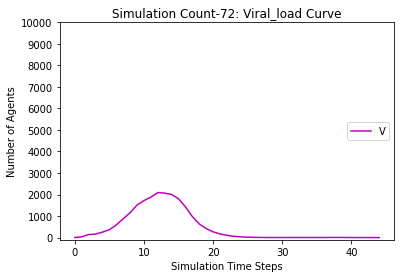

[9794, 9549, 9333, 9074, 8695, 8211, 7539, 6596, 5505, 4429, 3392, 2441, 1646, 1031, 620, 397, 277, 219, 185, 169, 149, 139, 134, 133, 132, 130, 129, 128, 128, 128, 128, 128, 128]
[206, 451, 317, 576, 905, 1338, 1794, 2478, 3190, 3332, 3827, 3992, 3859, 3398, 2772, 2044, 1163, 693, 386, 228, 128, 80, 51, 21, 8, 5, 5, 5, 4, 2, 1, 0, 0]
[0, 0, 350, 350, 400, 451, 667, 926, 1305, 2239, 2781, 3567, 4495, 5571, 6608, 7559, 8560, 9088, 9429, 9603, 9723, 9781, 9815, 9846, 9860, 9865, 9866, 9867, 9868, 9870, 9871, 9872, 9872]
[0.0, 38.0, 151.0, 149.5, 236.75, 383.375, 565.6875, 817.84375, 1137.921875, 1537.9609375, 1727.98046875, 1922.990234375, 2042.4951171875, 2084.24755859375, 1954.123779296875, 1713.0618896484375, 1382.5309448242188, 952.2654724121094, 645.1327362060547, 429.56636810302734, 272.7831840515137, 163.39159202575684, 99.69579601287842, 62.84789800643921, 37.423949003219604, 20.711974501609802, 13.355987250804901, 8.67799362540245, 5.338996812701225, 2.6694984063506126, 1.334749

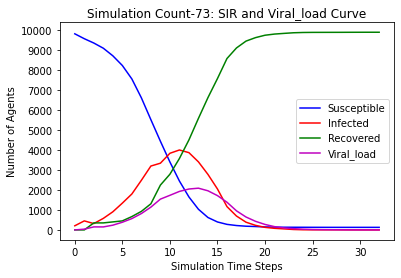

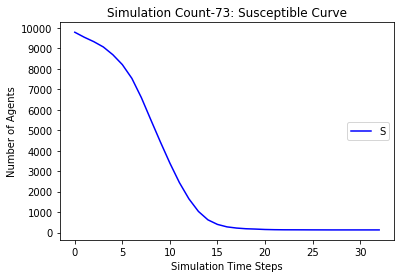

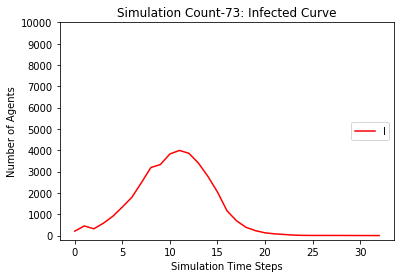

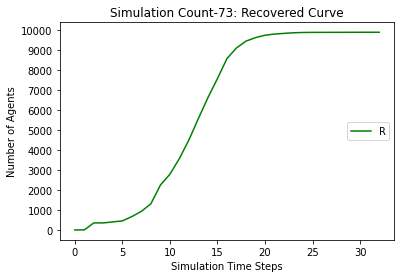

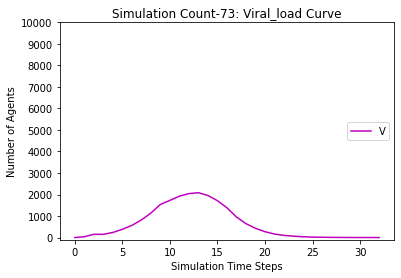

[9794, 9558, 9390, 9178, 8860, 8449, 7861, 7106, 6219, 5244, 4223, 3179, 2240, 1480, 942, 580, 380, 283, 221, 176, 147, 129, 116, 114, 112, 112, 111, 111, 110, 108, 108, 108, 108, 108, 108]
[206, 442, 260, 472, 741, 1109, 1529, 2072, 2641, 2762, 3303, 3738, 3979, 3764, 3281, 2599, 1619, 1047, 652, 404, 233, 154, 105, 35, 18, 10, 5, 3, 2, 4, 3, 3, 2, 0, 0]
[0, 0, 350, 350, 399, 442, 610, 822, 1140, 1994, 2474, 3083, 3781, 4756, 5777, 6821, 8001, 8670, 9127, 9420, 9620, 9717, 9779, 9851, 9870, 9878, 9884, 9886, 9888, 9888, 9889, 9889, 9890, 9892, 9892]
[0.0, 26.0, 112.0, 130.0, 207.0, 298.5, 446.25, 648.125, 891.0625, 1205.53125, 1411.765625, 1589.8828125, 1871.94140625, 2078.970703125, 2098.4853515625, 1906.24267578125, 1650.121337890625, 1212.0606689453125, 867.0303344726562, 607.5151672363281, 412.75758361816406, 277.37879180908203, 171.68939590454102, 117.84469795227051, 66.92234897613525, 37.46117448806763, 19.730587244033813, 9.865293622016907, 4.932646811008453, 4.466323405504227,

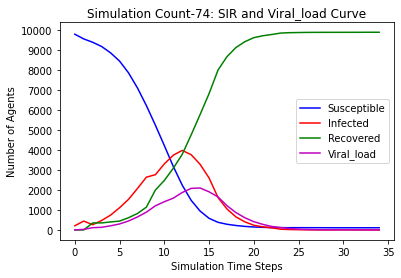

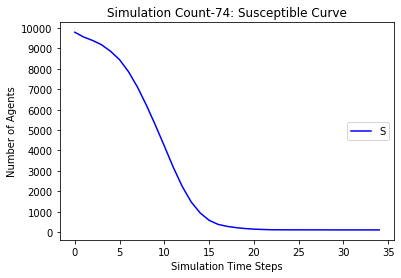

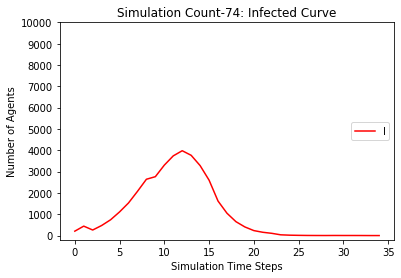

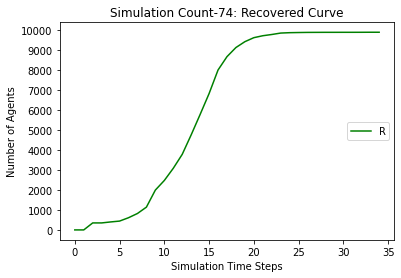

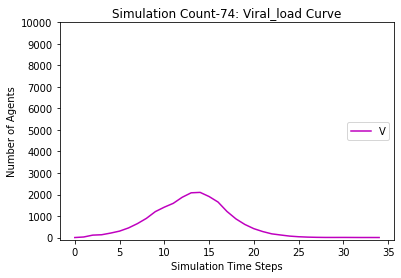

[9794, 9569, 9394, 9180, 8846, 8390, 7765, 6997, 6035, 5033, 4028, 2977, 2062, 1352, 829, 505, 358, 263, 199, 167, 143, 128, 116, 110, 108, 106, 104, 104, 103, 103, 103, 103, 103, 102, 102, 102, 102, 102]
[206, 431, 273, 487, 772, 1179, 1629, 2183, 2811, 2920, 3431, 3851, 3973, 3681, 3199, 2472, 1448, 949, 567, 338, 215, 135, 83, 36, 22, 17, 12, 6, 5, 3, 1, 1, 0, 1, 1, 1, 1, 0]
[0, 0, 333, 333, 382, 431, 606, 820, 1154, 2047, 2541, 3172, 3965, 4967, 5972, 7023, 8194, 8788, 9234, 9495, 9642, 9737, 9801, 9854, 9870, 9877, 9884, 9890, 9892, 9894, 9896, 9896, 9897, 9897, 9897, 9897, 9897, 9898]
[0.0, 32.0, 114.0, 131.0, 213.5, 315.75, 478.875, 689.4375, 956.71875, 1316.359375, 1494.1796875, 1717.08984375, 1936.544921875, 2111.2724609375, 2070.63623046875, 1878.318115234375, 1598.1590576171875, 1212.0795288085938, 837.0397644042969, 573.5198822021484, 381.7599411010742, 247.8799705505371, 158.93998527526855, 94.46999263763428, 58.23499631881714, 35.11749815940857, 21.558749079704285, 12.779

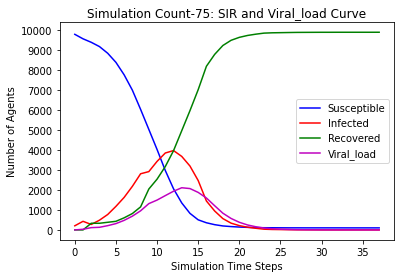

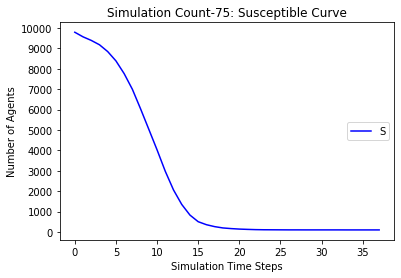

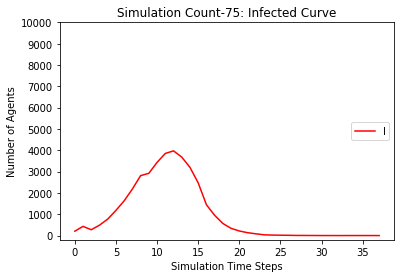

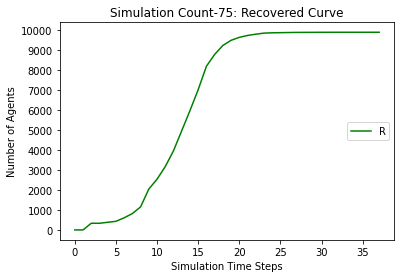

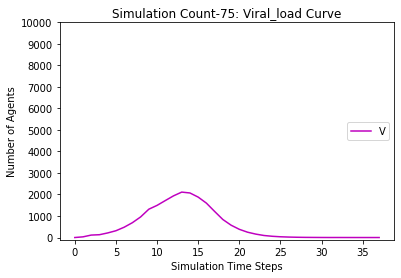

[9794, 9550, 9365, 9122, 8777, 8289, 7604, 6745, 5666, 4578, 3558, 2630, 1773, 1119, 696, 439, 291, 222, 177, 146, 125, 112, 104, 101, 101, 101, 100, 100, 100, 100, 100, 100]
[206, 450, 275, 518, 816, 1261, 1761, 2377, 3111, 3254, 3712, 3917, 3893, 3459, 2862, 2191, 1295, 794, 478, 293, 166, 110, 73, 25, 14, 7, 4, 1, 1, 1, 0, 0]
[0, 0, 360, 360, 407, 450, 635, 878, 1223, 2168, 2730, 3453, 4334, 5422, 6442, 7370, 8414, 8984, 9345, 9561, 9709, 9778, 9823, 9874, 9885, 9892, 9896, 9899, 9899, 9899, 9900, 9900]
[0.0, 33.0, 138.5, 156.25, 245.125, 363.5625, 530.78125, 794.390625, 1106.1953125, 1454.09765625, 1604.048828125, 1789.0244140625, 1949.51220703125, 2056.756103515625, 1938.3780517578125, 1726.1890258789062, 1447.0945129394531, 1064.5472564697266, 740.2736282348633, 486.13681411743164, 320.0684070587158, 204.0342035293579, 127.01710176467896, 79.50855088233948, 48.75427544116974, 30.37713772058487, 17.188568860292435, 9.594284430146217, 4.797142215073109, 2.3985711075365543, 1.199285

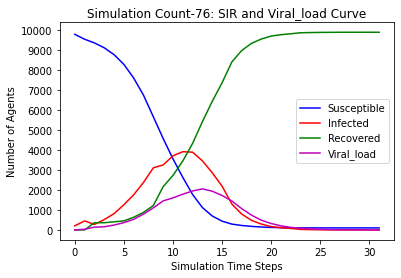

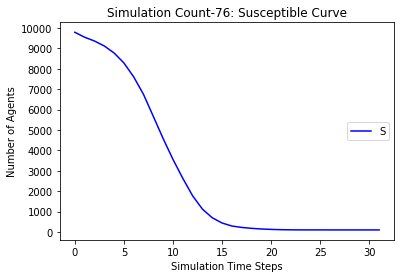

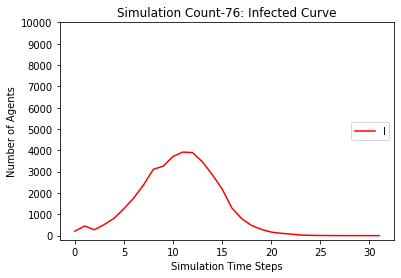

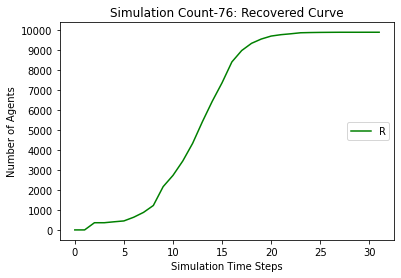

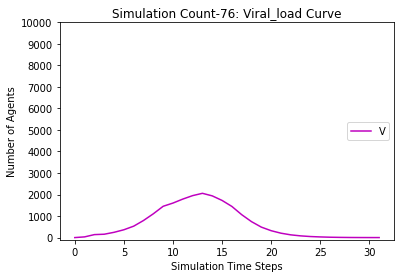

[9794, 9564, 9375, 9112, 8739, 8267, 7611, 6766, 5712, 4681, 3640, 2601, 1792, 1155, 728, 453, 316, 231, 179, 141, 129, 121, 111, 105, 103, 102, 100, 100, 100, 100, 100, 100, 100, 100]
[206, 436, 285, 548, 869, 1297, 1764, 2346, 3027, 3133, 3629, 3976, 3920, 3526, 2912, 2148, 1260, 808, 501, 312, 187, 110, 68, 27, 22, 17, 11, 5, 3, 2, 0, 0, 0, 0]
[0, 0, 340, 340, 392, 436, 625, 888, 1261, 2186, 2731, 3423, 4288, 5319, 6360, 7399, 8424, 8961, 9320, 9547, 9684, 9769, 9821, 9868, 9875, 9881, 9889, 9895, 9897, 9898, 9900, 9900, 9900, 9900]
[0.0, 34.0, 134.0, 147.0, 246.5, 365.25, 537.625, 781.8125, 1060.90625, 1391.453125, 1579.7265625, 1815.86328125, 2018.931640625, 2086.4658203125, 1977.23291015625, 1716.616455078125, 1373.3082275390625, 978.6541137695312, 697.3270568847656, 474.6635284423828, 318.3317642211914, 206.1658821105957, 134.08294105529785, 85.04147052764893, 50.52073526382446, 32.26036763191223, 20.130183815956116, 11.065091907978058, 6.532545953989029, 5.2662729769945145, 4.6

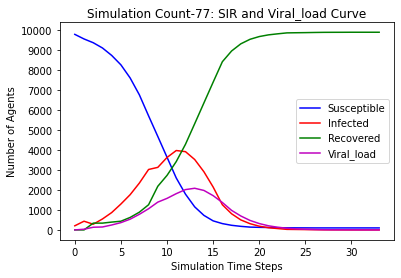

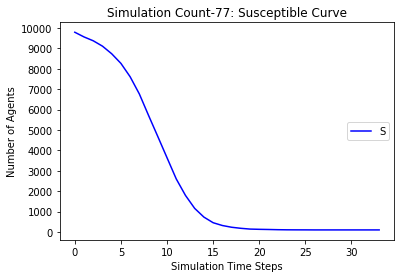

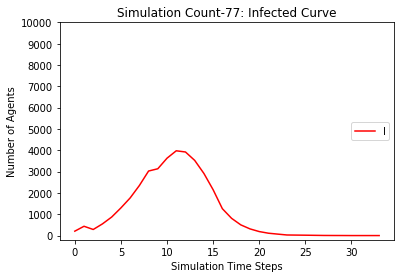

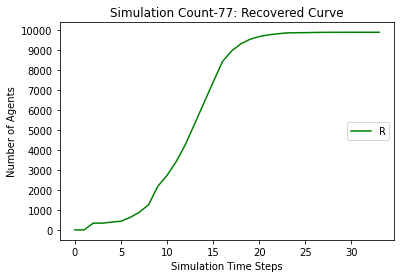

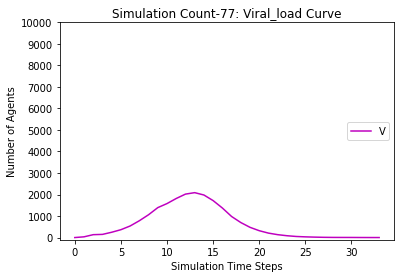

[9794, 9572, 9431, 9271, 9002, 8593, 8006, 7263, 6285, 5314, 4289, 3256, 2266, 1509, 960, 582, 379, 263, 184, 145, 118, 111, 95, 91, 88, 87, 85, 83, 81, 81, 81, 80, 79, 79, 79, 78, 77, 77, 77]
[206, 428, 210, 370, 602, 979, 1425, 2008, 2717, 2850, 3383, 3807, 4019, 3805, 3329, 2674, 1632, 1098, 717, 437, 261, 152, 89, 37, 22, 17, 10, 8, 7, 6, 4, 3, 2, 2, 2, 2, 2, 0, 0]
[0, 0, 359, 359, 396, 428, 569, 729, 998, 1836, 2328, 2937, 3715, 4686, 5711, 6744, 7989, 8639, 9099, 9418, 9621, 9737, 9816, 9872, 9890, 9896, 9905, 9909, 9912, 9913, 9915, 9917, 9919, 9919, 9919, 9920, 9921, 9923, 9923]
[0.0, 22.0, 103.0, 108.5, 170.25, 271.125, 441.5625, 637.78125, 882.890625, 1220.4453125, 1389.22265625, 1614.611328125, 1836.3056640625, 1997.15283203125, 1962.576416015625, 1820.2882080078125, 1647.1441040039062, 1288.5720520019531, 939.2860260009766, 641.6430130004883, 440.82150650024414, 292.41075325012207, 188.20537662506104, 116.10268831253052, 65.05134415626526, 39.52567207813263, 25.762836039066

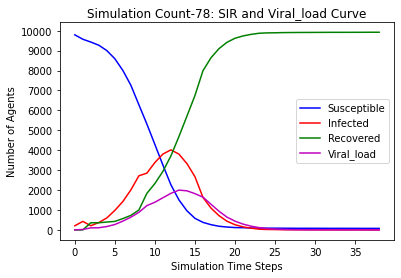

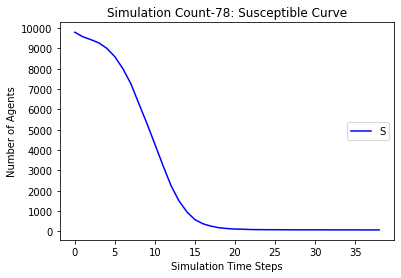

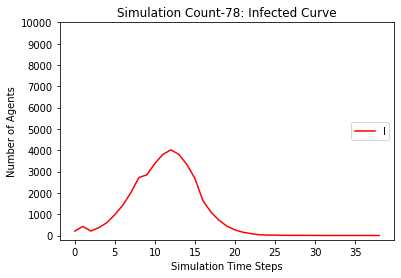

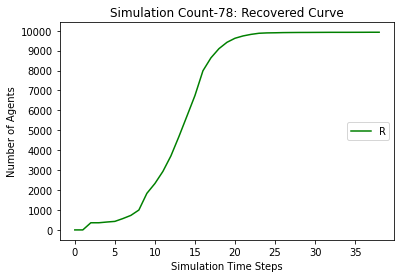

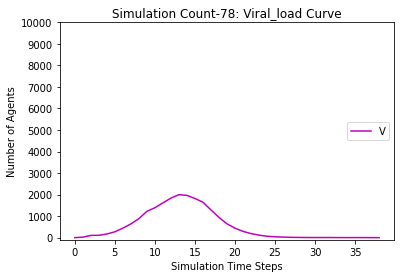

[9794, 9554, 9378, 9148, 8827, 8384, 7782, 7043, 6064, 5030, 3949, 2911, 2003, 1321, 846, 527, 350, 258, 201, 165, 146, 134, 131, 128, 127, 126, 126, 124, 121, 120, 120, 120, 120]
[206, 446, 264, 494, 763, 1170, 1596, 2105, 2763, 2909, 3498, 3926, 4061, 3709, 3103, 2384, 1386, 900, 577, 362, 204, 124, 70, 26, 13, 7, 5, 4, 6, 6, 1, 1, 0]
[0, 0, 358, 358, 410, 446, 622, 852, 1173, 2061, 2553, 3163, 3936, 4970, 6051, 7089, 8264, 8842, 9222, 9473, 9650, 9742, 9799, 9846, 9860, 9867, 9869, 9872, 9873, 9874, 9879, 9879, 9880]
[0.0, 31.0, 125.5, 134.75, 205.375, 308.6875, 482.34375, 686.171875, 956.0859375, 1280.04296875, 1485.021484375, 1716.5107421875, 1940.25537109375, 2054.127685546875, 2028.0638427734375, 1849.0319213867188, 1545.5159606933594, 1153.7579803466797, 819.8789901733398, 573.9394950866699, 380.96974754333496, 251.48487377166748, 163.74243688583374, 101.87121844291687, 59.935609221458435, 34.96780461072922, 17.48390230536461, 8.741951152682304, 6.370975576341152, 4.18548778817

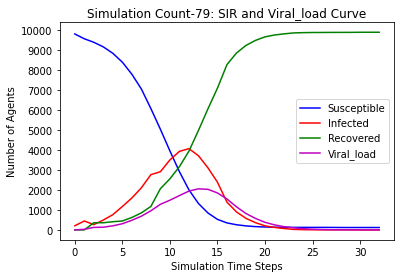

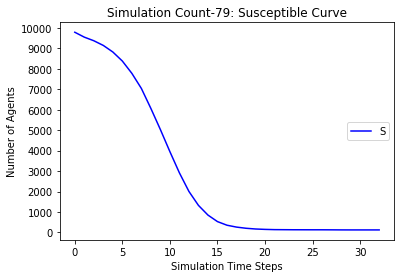

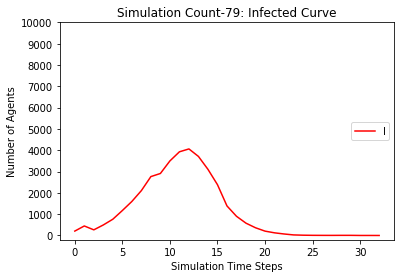

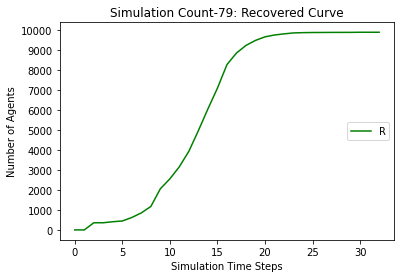

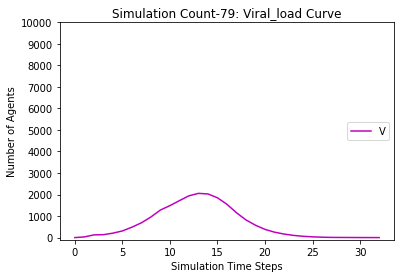

[9794, 9558, 9366, 9122, 8752, 8254, 7593, 6738, 5783, 4806, 3727, 2662, 1838, 1216, 799, 522, 374, 287, 234, 190, 161, 146, 139, 134, 132, 130, 129, 127, 126, 126, 124, 124, 124, 124, 124]
[206, 442, 282, 526, 851, 1304, 1773, 2384, 2969, 3011, 3532, 3898, 3945, 3590, 2928, 2140, 1236, 792, 500, 332, 213, 141, 95, 37, 24, 14, 10, 7, 6, 4, 5, 3, 2, 2, 0]
[0, 0, 352, 352, 397, 442, 634, 878, 1248, 2183, 2741, 3440, 4217, 5194, 6273, 7338, 8390, 8921, 9266, 9478, 9626, 9713, 9766, 9829, 9844, 9856, 9861, 9866, 9868, 9870, 9871, 9873, 9874, 9874, 9876]
[0.0, 36.0, 145.0, 146.5, 224.25, 364.125, 536.0625, 736.03125, 1007.015625, 1321.5078125, 1521.75390625, 1738.876953125, 1959.4384765625, 2014.71923828125, 1929.359619140625, 1751.6798095703125, 1454.8399047851562, 1053.4199523925781, 723.7099761962891, 487.85498809814453, 338.92749404907227, 232.46374702453613, 153.23187351226807, 96.61593675613403, 58.30796837806702, 35.15398418903351, 19.576992094516754, 9.788496047258377, 5.89424802362

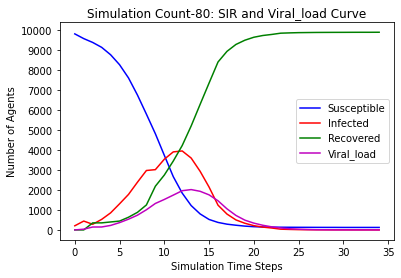

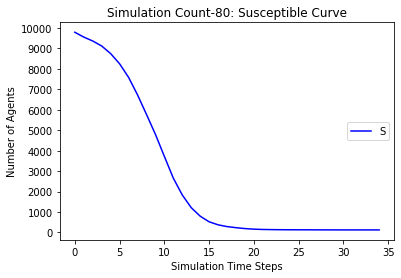

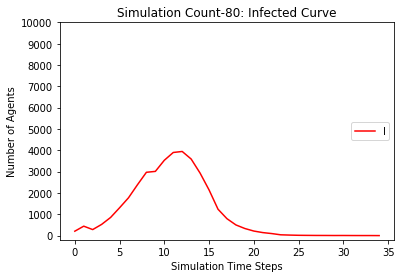

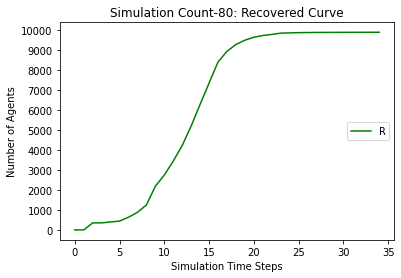

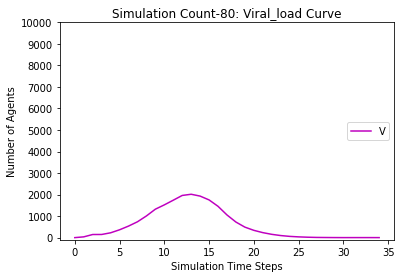

[9794, 9551, 9368, 9133, 8765, 8299, 7656, 6791, 5733, 4680, 3599, 2592, 1748, 1120, 703, 485, 332, 238, 179, 157, 139, 126, 120, 118, 117, 114, 113, 112, 112, 112, 112, 112, 112, 112]
[206, 449, 269, 504, 827, 1252, 1712, 2342, 3032, 3159, 3703, 4007, 3985, 3560, 2896, 2107, 1245, 781, 487, 328, 193, 112, 59, 23, 13, 9, 7, 6, 5, 2, 1, 0, 0, 0]
[0, 0, 363, 363, 408, 449, 632, 867, 1235, 2161, 2698, 3401, 4267, 5320, 6401, 7408, 8423, 8981, 9334, 9515, 9668, 9762, 9821, 9859, 9870, 9877, 9880, 9882, 9883, 9886, 9887, 9888, 9888, 9888]
[0.0, 36.0, 138.0, 143.0, 222.5, 344.25, 515.125, 741.5625, 1021.78125, 1369.890625, 1623.9453125, 1834.97265625, 1994.486328125, 2071.2431640625, 1998.62158203125, 1792.310791015625, 1433.1553955078125, 1033.5776977539062, 700.7888488769531, 459.39442443847656, 318.6972122192383, 213.34860610961914, 136.67430305480957, 80.33715152740479, 44.16857576370239, 25.084287881851196, 12.542143940925598, 8.271071970462799, 6.1355359852313995, 5.0677679926157, 3.53

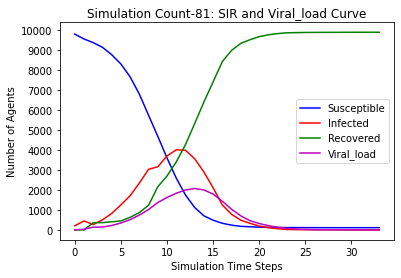

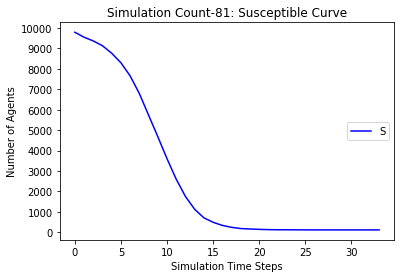

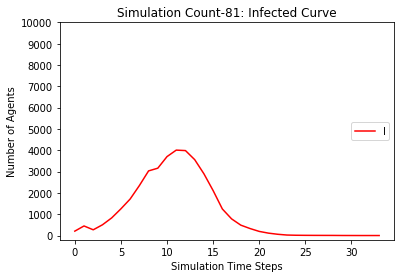

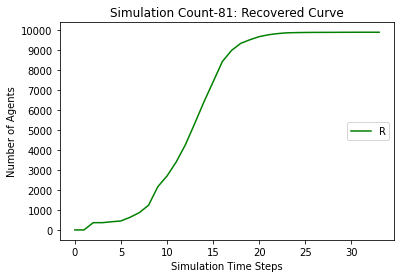

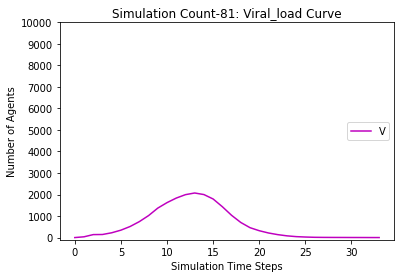

[9794, 9561, 9319, 9053, 8674, 8072, 7268, 6255, 5063, 3908, 2872, 1957, 1269, 818, 527, 344, 259, 206, 179, 157, 143, 131, 126, 124, 122, 119, 119, 117, 117, 117, 117, 117, 117]
[206, 439, 347, 613, 940, 1489, 2051, 2798, 3611, 3674, 4036, 4104, 3794, 3090, 2345, 1613, 839, 503, 297, 187, 116, 75, 53, 20, 13, 10, 7, 7, 5, 2, 2, 0, 0]
[0, 0, 334, 334, 386, 439, 681, 947, 1326, 2418, 3092, 3939, 4937, 6092, 7128, 8043, 8902, 9291, 9524, 9656, 9741, 9794, 9821, 9856, 9865, 9871, 9874, 9876, 9878, 9881, 9881, 9883, 9883]
[0.0, 35.0, 143.5, 176.75, 280.375, 432.1875, 643.09375, 911.546875, 1293.7734375, 1646.88671875, 1886.443359375, 2074.2216796875, 2176.11083984375, 2078.055419921875, 1833.0277099609375, 1520.5138549804688, 1167.2569274902344, 783.6284637451172, 512.8142318725586, 333.4071159362793, 215.70355796813965, 140.85177898406982, 84.42588949203491, 48.212944746017456, 26.106472373008728, 16.053236186504364, 11.026618093252182, 8.513309046626091, 8.256654523313046, 7.128327261656

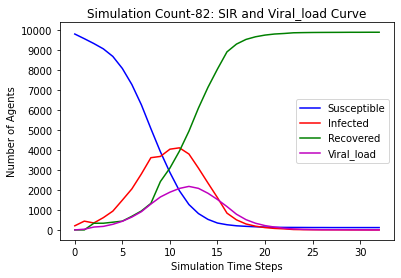

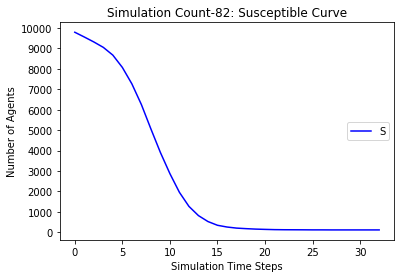

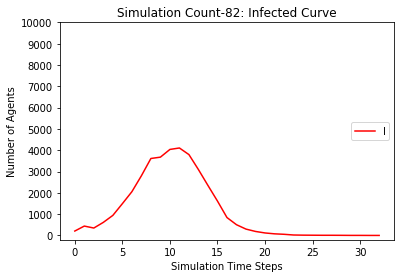

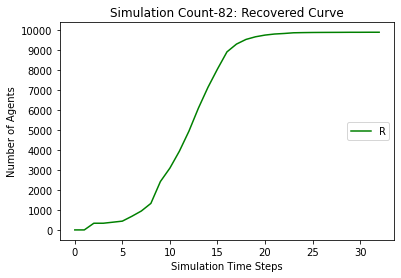

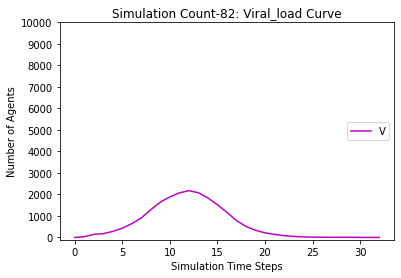

[9794, 9596, 9412, 9179, 8869, 8425, 7773, 6893, 5828, 4773, 3656, 2684, 1844, 1203, 732, 461, 319, 242, 188, 163, 144, 136, 125, 122, 120, 119, 115, 115, 113, 110, 108, 108, 108, 108, 108, 108, 107, 107]
[206, 404, 258, 491, 758, 1171, 1639, 2286, 3041, 3210, 3775, 4018, 3984, 3570, 2924, 2223, 1259, 806, 484, 298, 175, 106, 63, 30, 17, 13, 10, 7, 7, 9, 6, 6, 5, 2, 0, 0, 1, 0]
[0, 0, 330, 330, 373, 404, 588, 821, 1131, 2017, 2569, 3298, 4172, 5227, 6344, 7316, 8422, 8952, 9328, 9539, 9681, 9758, 9812, 9848, 9863, 9868, 9875, 9878, 9880, 9881, 9886, 9886, 9887, 9890, 9892, 9892, 9892, 9893]
[0.0, 26.0, 117.0, 132.5, 203.25, 333.625, 514.8125, 712.40625, 1035.203125, 1387.6015625, 1616.80078125, 1852.400390625, 2030.2001953125, 2084.10009765625, 1949.050048828125, 1737.5250244140625, 1447.7625122070312, 1008.8812561035156, 733.4406280517578, 479.7203140258789, 309.86015701293945, 200.93007850646973, 125.46503925323486, 72.73251962661743, 45.366259813308716, 28.683129906654358, 15.341564

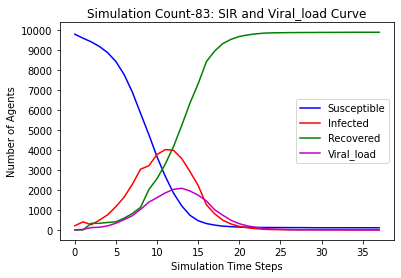

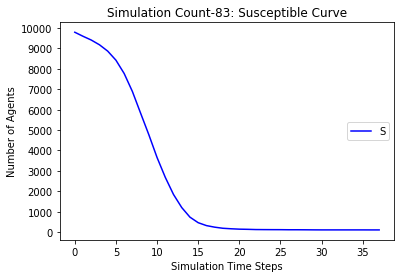

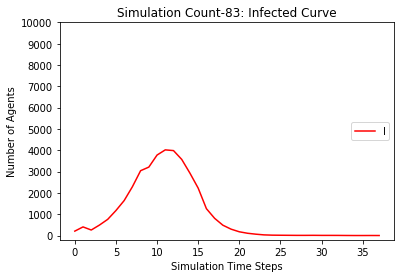

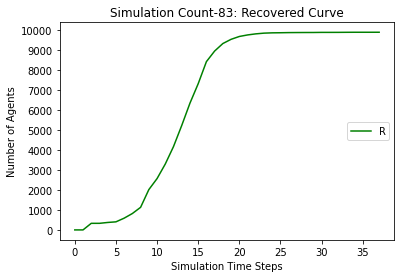

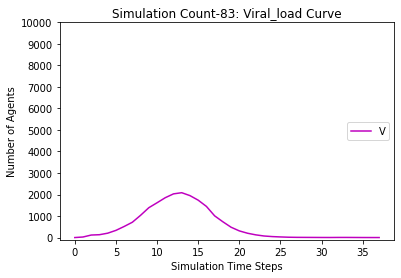

[9794, 9565, 9392, 9184, 8865, 8438, 7842, 7031, 5997, 4943, 3868, 2845, 1922, 1244, 785, 516, 368, 302, 234, 189, 164, 149, 138, 129, 125, 123, 122, 122, 122, 122, 122, 122, 122]
[206, 435, 266, 474, 748, 1127, 1550, 2153, 2868, 3046, 3631, 3999, 4075, 3699, 3083, 2329, 1342, 824, 503, 327, 204, 153, 96, 40, 29, 21, 16, 7, 3, 1, 0, 0, 0]
[0, 0, 342, 342, 387, 435, 608, 816, 1135, 2011, 2501, 3156, 4003, 5057, 6132, 7155, 8290, 8874, 9263, 9484, 9632, 9698, 9766, 9831, 9846, 9856, 9862, 9871, 9875, 9877, 9878, 9878, 9878]
[0.0, 28.0, 119.0, 138.5, 214.25, 325.125, 482.5625, 695.28125, 969.640625, 1323.8203125, 1526.91015625, 1765.455078125, 1983.7275390625, 2072.86376953125, 1976.431884765625, 1776.2159423828125, 1518.1079711914062, 1103.0539855957031, 777.5269927978516, 531.7634963989258, 353.8817481994629, 219.94087409973145, 145.97043704986572, 105.98521852493286, 60.99260926246643, 39.496304631233215, 25.748152315616608, 17.874076157808304, 8.937038078904152, 4.468519039452076, 2.2

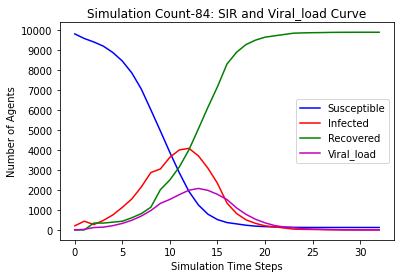

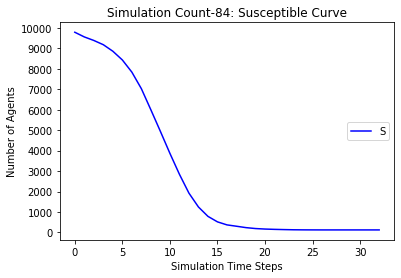

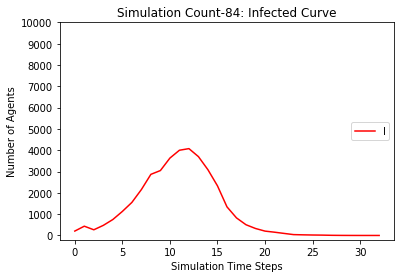

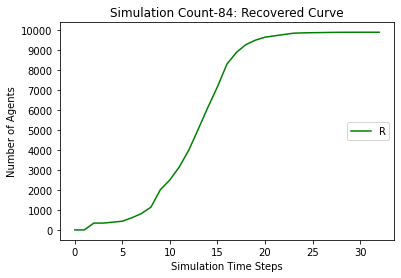

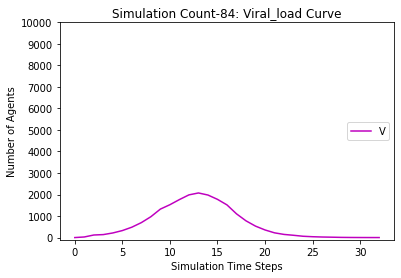

[9794, 9579, 9424, 9233, 8954, 8556, 7954, 7190, 6234, 5227, 4136, 3063, 2149, 1439, 939, 601, 388, 281, 221, 176, 151, 129, 118, 114, 111, 108, 104, 103, 100, 100, 98, 98, 98, 98, 98]
[206, 421, 231, 422, 660, 1023, 1470, 2043, 2720, 2890, 3500, 3947, 4085, 3788, 3197, 2462, 1510, 999, 646, 425, 237, 152, 103, 43, 31, 20, 14, 11, 11, 8, 6, 5, 2, 2, 0]
[0, 0, 345, 345, 386, 421, 576, 767, 1046, 1883, 2364, 2990, 3766, 4773, 5864, 6937, 8102, 8720, 9133, 9399, 9612, 9719, 9779, 9843, 9858, 9872, 9882, 9886, 9889, 9892, 9896, 9897, 9900, 9900, 9902]
[0.0, 25.0, 113.5, 119.75, 160.875, 258.4375, 420.21875, 629.109375, 889.5546875, 1249.77734375, 1496.888671875, 1716.4443359375, 1927.22216796875, 2041.611083984375, 2078.8055419921875, 1896.4027709960938, 1598.2013854980469, 1207.1006927490234, 878.5503463745117, 625.2751731872559, 427.63758659362793, 277.81879329681396, 181.90939664840698, 121.95469832420349, 72.97734916210175, 44.48867458105087, 28.244337290525436, 20.122168645262718, 16.

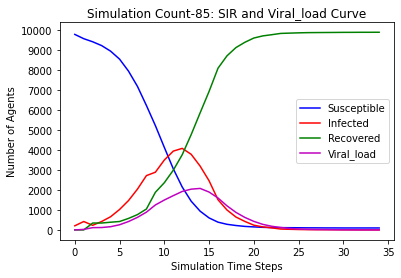

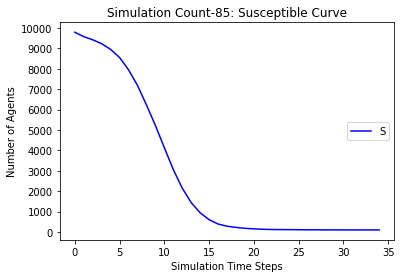

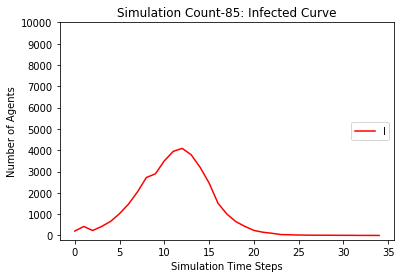

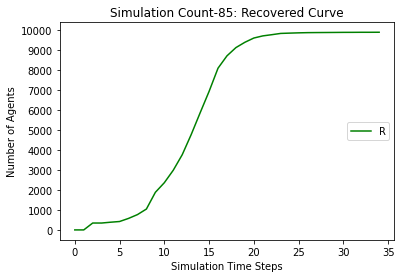

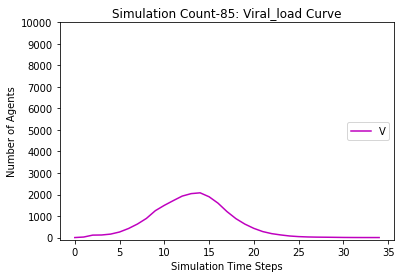

[9794, 9541, 9341, 9104, 8746, 8244, 7594, 6735, 5716, 4596, 3538, 2549, 1713, 1103, 664, 414, 294, 223, 178, 146, 127, 115, 111, 109, 107, 106, 106, 106, 105, 105, 105, 105]
[206, 459, 304, 541, 848, 1297, 1747, 2369, 3030, 3203, 3723, 4011, 4003, 3493, 2874, 2135, 1223, 771, 446, 268, 167, 108, 67, 29, 14, 8, 5, 3, 2, 1, 0, 0]
[0, 0, 355, 355, 406, 459, 659, 896, 1254, 2201, 2739, 3440, 4284, 5404, 6462, 7451, 8483, 9006, 9376, 9586, 9706, 9777, 9822, 9862, 9879, 9886, 9889, 9891, 9893, 9894, 9895, 9895]
[0.0, 31.0, 134.5, 140.25, 219.125, 335.5625, 524.78125, 749.390625, 1064.6953125, 1406.34765625, 1588.173828125, 1798.0869140625, 2021.04345703125, 2091.521728515625, 1961.7608642578125, 1717.8804321289062, 1422.9402160644531, 1027.4701080322266, 728.7350540161133, 473.36752700805664, 304.6837635040283, 187.34188175201416, 127.67094087600708, 81.83547043800354, 48.91773521900177, 28.458867609500885, 17.229433804750443, 11.614716902375221, 6.807358451187611, 3.4036792255938053, 1.701

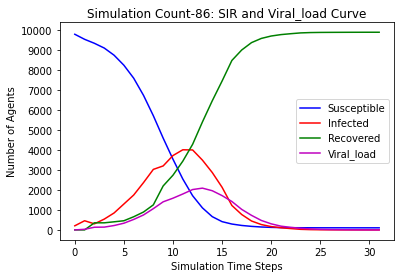

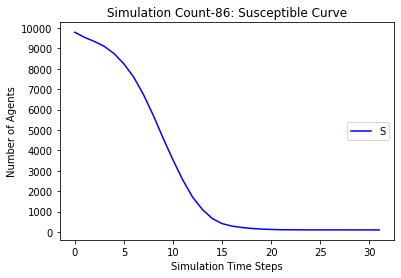

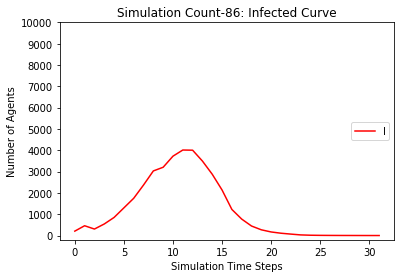

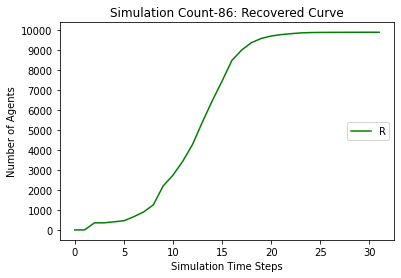

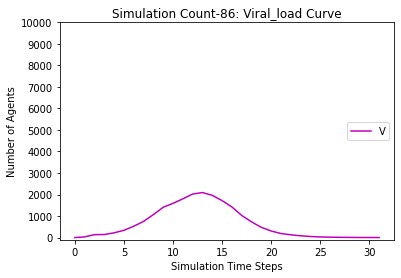

[9794, 9575, 9410, 9210, 8905, 8481, 7888, 7063, 6032, 4918, 3874, 2832, 1934, 1225, 749, 463, 297, 200, 153, 118, 103, 92, 82, 78, 77, 77, 77, 77, 77, 77, 77, 77]
[206, 425, 238, 438, 700, 1094, 1522, 2147, 2873, 3120, 3665, 4030, 4098, 3693, 3125, 2369, 1451, 930, 557, 345, 194, 108, 71, 22, 15, 10, 5, 1, 0, 0, 0, 0]
[0, 0, 352, 352, 395, 425, 590, 790, 1095, 1962, 2461, 3138, 3968, 5082, 6126, 7168, 8252, 8870, 9290, 9537, 9703, 9800, 9847, 9900, 9908, 9913, 9918, 9922, 9923, 9923, 9923, 9923]
[0.0, 19.0, 120.5, 121.25, 178.625, 290.3125, 438.15625, 687.078125, 957.5390625, 1305.76953125, 1528.884765625, 1729.4423828125, 1999.72119140625, 2109.860595703125, 2059.9302978515625, 1843.9651489257812, 1527.9825744628906, 1129.9912872314453, 775.9956436157227, 527.9978218078613, 360.99891090393066, 236.49945545196533, 147.24972772598267, 85.62486386299133, 47.81243193149567, 28.906215965747833, 17.453107982873917, 9.726553991436958, 5.863276995718479, 2.9316384978592396, 1.465819248929619

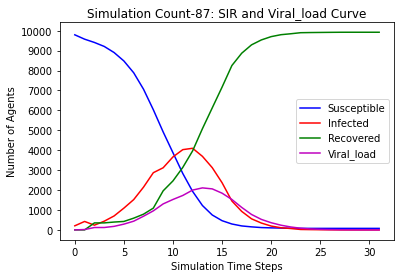

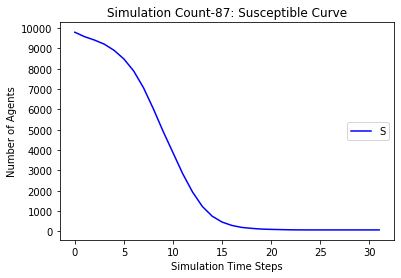

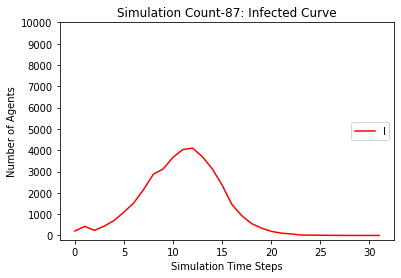

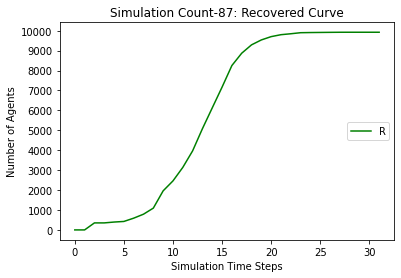

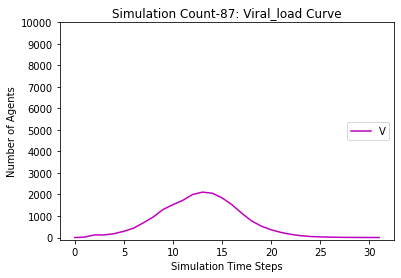

[9794, 9548, 9358, 9119, 8788, 8299, 7621, 6823, 5776, 4700, 3629, 2637, 1774, 1122, 663, 380, 253, 190, 155, 124, 110, 104, 103, 100, 99, 99, 99, 99, 99, 99, 99]
[206, 452, 288, 527, 813, 1249, 1737, 2296, 3012, 3181, 3668, 3995, 4002, 3578, 2966, 2257, 1296, 802, 452, 256, 143, 86, 52, 13, 7, 4, 4, 1, 0, 0, 0]
[0, 0, 354, 354, 399, 452, 642, 881, 1212, 2119, 2703, 3368, 4224, 5300, 6371, 7363, 8451, 9008, 9393, 9620, 9747, 9810, 9845, 9887, 9894, 9897, 9897, 9900, 9901, 9901, 9901]
[0.0, 34.0, 147.0, 139.5, 216.75, 348.375, 537.1875, 759.59375, 1053.796875, 1402.8984375, 1575.44921875, 1805.724609375, 2011.8623046875, 2109.93115234375, 2045.965576171875, 1825.9827880859375, 1523.9913940429688, 1124.9956970214844, 759.4978485107422, 501.7489242553711, 314.87446212768555, 192.43723106384277, 116.21861553192139, 69.1093077659607, 40.55465388298035, 24.277326941490173, 12.138663470745087, 6.069331735372543, 3.0346658676862717, 1.5173329338431358, 0.7586664669215679]
0.0
[[], [9794, 9571,

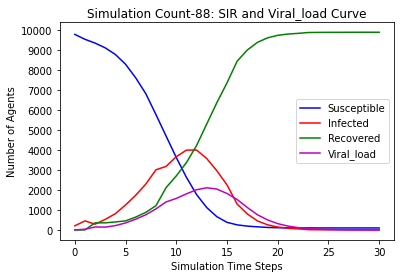

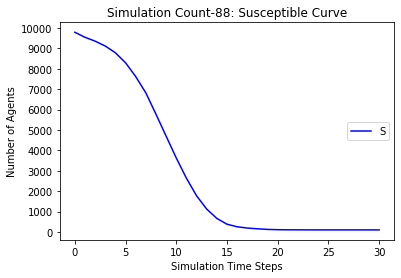

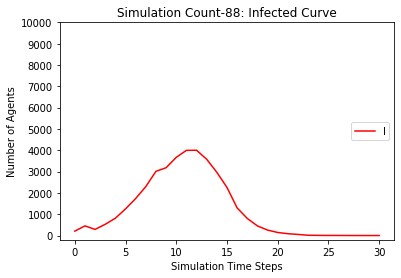

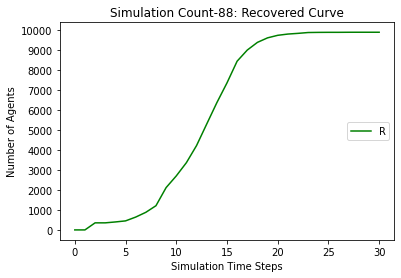

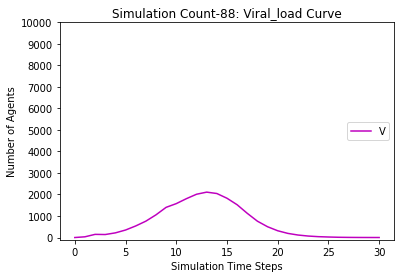

[9794, 9565, 9393, 9177, 8873, 8443, 7866, 7134, 6171, 5160, 4131, 3097, 2157, 1414, 893, 536, 332, 214, 158, 125, 102, 89, 82, 76, 74, 70, 68, 66, 65, 64, 63, 63, 62, 62, 62, 62, 61, 59, 59, 59, 59, 58, 58, 58, 57, 57, 57, 56, 55, 55, 55, 54, 54, 54, 54, 54, 54]
[206, 435, 260, 476, 729, 1122, 1527, 2043, 2702, 2853, 3410, 3857, 4014, 3746, 3238, 2561, 1585, 1060, 675, 411, 230, 125, 76, 32, 20, 15, 14, 10, 9, 6, 2, 1, 2, 2, 1, 1, 1, 3, 3, 3, 2, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0]
[0, 0, 347, 347, 398, 435, 607, 823, 1127, 1987, 2459, 3046, 3829, 4840, 5869, 6903, 8083, 8726, 9167, 9464, 9668, 9786, 9842, 9892, 9906, 9915, 9918, 9924, 9926, 9930, 9935, 9936, 9936, 9936, 9937, 9937, 9938, 9938, 9938, 9938, 9939, 9941, 9941, 9941, 9941, 9942, 9942, 9942, 9943, 9943, 9943, 9944, 9945, 9945, 9945, 9946, 9946]
[0.0, 30.0, 115.0, 116.5, 186.25, 297.125, 465.5625, 677.78125, 896.890625, 1203.4453125, 1370.72265625, 1634.361328125, 1885.1806640625, 2064.59033203125, 2089.295166015

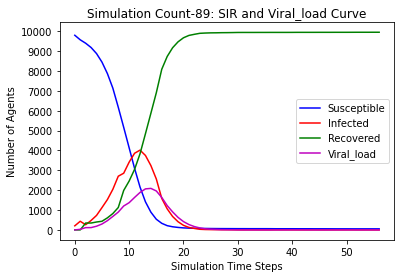

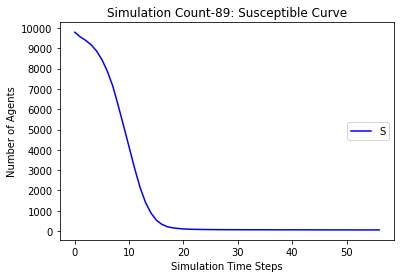

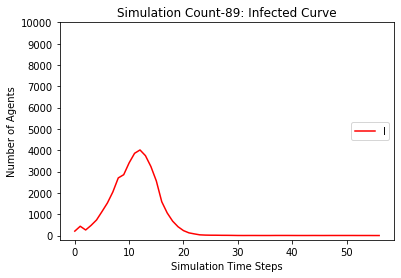

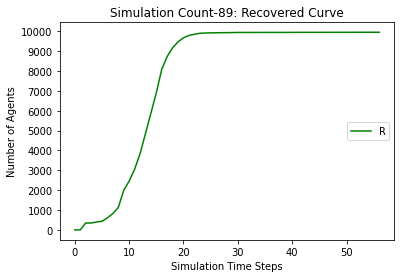

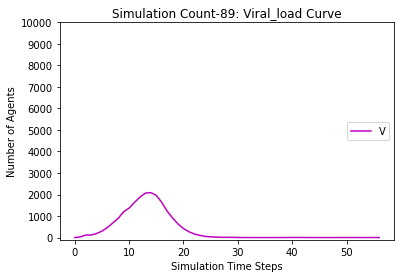

[9794, 9584, 9431, 9217, 8899, 8470, 7871, 7047, 6046, 5001, 3935, 2900, 2008, 1304, 824, 502, 338, 251, 196, 151, 127, 110, 104, 101, 97, 97, 97, 96, 96, 96, 95, 95, 95, 95, 95, 95]
[206, 416, 240, 454, 726, 1114, 1560, 2170, 2853, 3039, 3613, 3976, 4038, 3697, 3111, 2398, 1481, 950, 587, 351, 211, 141, 92, 40, 25, 11, 7, 5, 1, 1, 2, 1, 1, 1, 0, 0]
[0, 0, 329, 329, 375, 416, 569, 783, 1101, 1960, 2452, 3124, 3954, 4999, 6065, 7100, 8181, 8799, 9217, 9498, 9662, 9749, 9804, 9859, 9878, 9892, 9896, 9899, 9903, 9903, 9903, 9904, 9904, 9904, 9905, 9905]
[0.0, 26.0, 116.0, 122.0, 202.0, 312.0, 492.0, 700.0, 950.0, 1282.0, 1525.0, 1772.5, 2025.25, 2077.625, 2051.8125, 1825.90625, 1541.953125, 1126.9765625, 807.48828125, 563.744140625, 372.8720703125, 240.43603515625, 156.218017578125, 101.1090087890625, 59.55450439453125, 32.777252197265625, 16.388626098632812, 9.194313049316406, 5.597156524658203, 2.7985782623291016, 1.3992891311645508, 1.6996445655822754, 1.8498222827911377, 1.92491114139

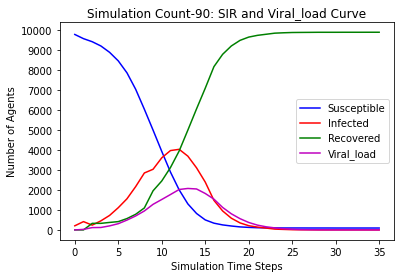

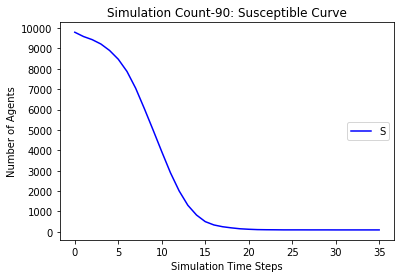

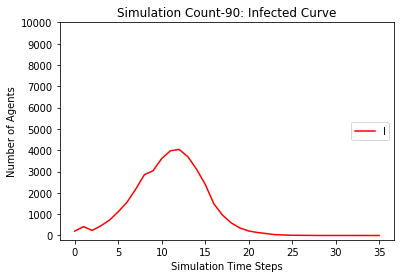

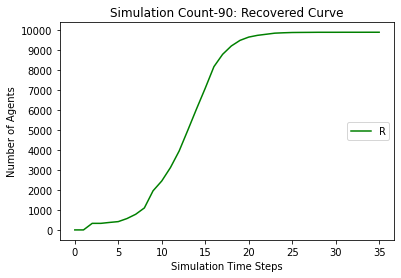

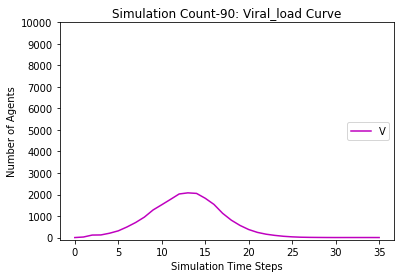

[9794, 9560, 9390, 9152, 8841, 8412, 7828, 7079, 6098, 5095, 4083, 3080, 2154, 1426, 883, 554, 371, 251, 188, 165, 156, 143, 138, 135, 132, 132, 131, 130, 130, 130, 128, 128, 128, 128, 128]
[206, 440, 253, 491, 757, 1148, 1562, 2073, 2743, 2881, 3427, 3813, 3944, 3669, 3200, 2526, 1537, 1037, 638, 389, 215, 108, 50, 21, 18, 10, 7, 5, 2, 2, 2, 2, 2, 2, 0]
[0, 0, 357, 357, 402, 440, 610, 848, 1159, 2024, 2490, 3107, 3902, 4905, 5917, 6920, 8092, 8712, 9174, 9446, 9629, 9749, 9812, 9844, 9850, 9858, 9862, 9865, 9868, 9868, 9870, 9870, 9870, 9870, 9872]
[0.0, 31.0, 125.5, 130.75, 191.375, 294.6875, 470.34375, 682.171875, 921.0859375, 1215.54296875, 1415.771484375, 1658.8857421875, 1874.44287109375, 2036.221435546875, 1991.1107177734375, 1879.5553588867188, 1633.7776794433594, 1230.8888397216797, 890.4444198608398, 608.2222099304199, 390.11110496520996, 251.05555248260498, 153.5277762413025, 89.76388812065125, 48.88194406032562, 28.44097203016281, 14.220486015081406, 8.110243007540703, 5.05

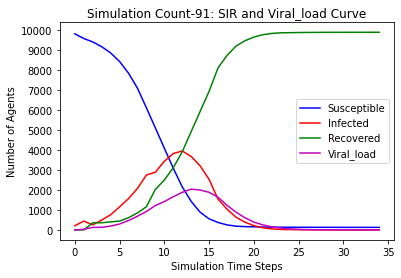

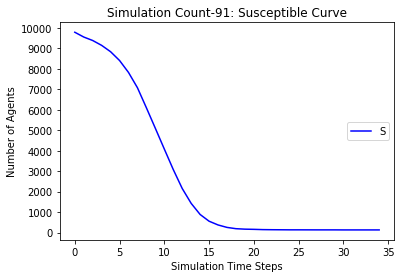

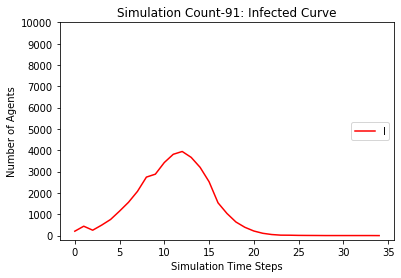

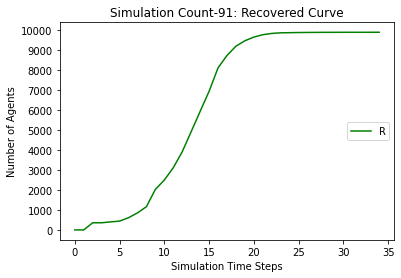

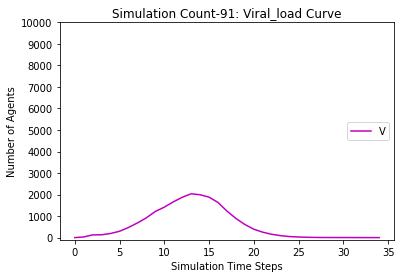

[9794, 9561, 9378, 9143, 8825, 8377, 7729, 6865, 5816, 4703, 3580, 2540, 1698, 1079, 674, 409, 294, 236, 194, 159, 145, 137, 130, 124, 120, 119, 115, 114, 110, 110, 110, 110, 109, 109, 109, 109, 109, 109]
[206, 439, 268, 503, 777, 1184, 1649, 2278, 3009, 3205, 3799, 4125, 4118, 3624, 2906, 2131, 1226, 736, 433, 250, 149, 99, 64, 29, 20, 15, 15, 10, 10, 9, 3, 2, 1, 1, 1, 1, 0, 0]
[0, 0, 354, 354, 398, 439, 622, 857, 1175, 2092, 2621, 3335, 4184, 5297, 6420, 7460, 8480, 9028, 9373, 9591, 9706, 9764, 9806, 9847, 9860, 9866, 9870, 9876, 9880, 9881, 9887, 9888, 9890, 9890, 9890, 9890, 9891, 9891]
[0.0, 34.0, 140.0, 153.0, 209.5, 318.75, 468.375, 691.1875, 1009.59375, 1373.796875, 1595.8984375, 1859.94921875, 2054.974609375, 2154.4873046875, 2021.24365234375, 1766.621826171875, 1413.3109130859375, 1057.6554565429688, 726.8277282714844, 493.4138641357422, 323.7069320678711, 193.85346603393555, 124.92673301696777, 82.46336650848389, 48.23168325424194, 29.11584162712097, 17.557920813560486, 12.

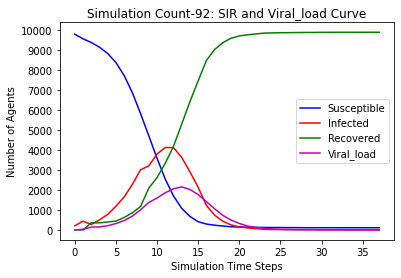

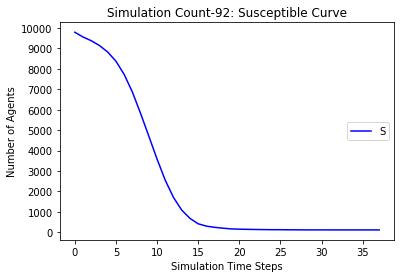

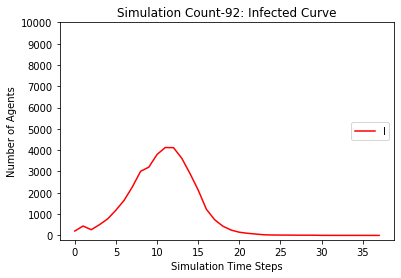

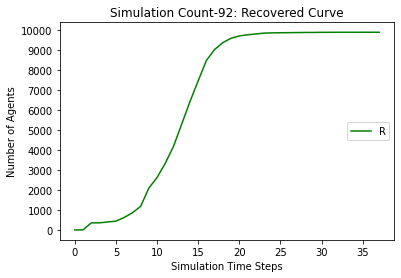

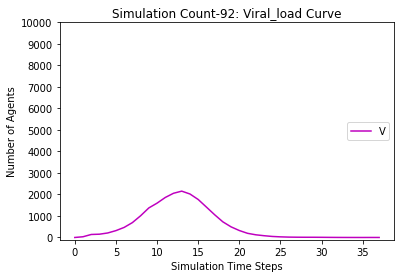

[9794, 9577, 9395, 9175, 8823, 8406, 7810, 7040, 6058, 5044, 3942, 2898, 1990, 1274, 796, 484, 292, 211, 156, 128, 112, 99, 88, 85, 82, 80, 78, 76, 75, 73, 73, 73, 72, 71, 70, 70, 70, 69, 66, 65, 65, 65, 65, 65]
[206, 423, 270, 490, 794, 1171, 1585, 2135, 2765, 2892, 3503, 3929, 4068, 3770, 3146, 2414, 1462, 923, 581, 356, 180, 112, 68, 36, 26, 16, 10, 9, 7, 7, 1, 0, 1, 2, 3, 3, 2, 1, 4, 5, 5, 4, 1, 0]
[0, 0, 335, 335, 383, 423, 605, 825, 1177, 2064, 2555, 3173, 3942, 4956, 6058, 7102, 8246, 8866, 9263, 9516, 9708, 9789, 9844, 9879, 9892, 9904, 9912, 9915, 9918, 9920, 9926, 9927, 9927, 9927, 9927, 9927, 9928, 9930, 9930, 9930, 9930, 9931, 9934, 9935]
[0.0, 28.0, 119.0, 131.5, 202.75, 333.375, 487.6875, 689.84375, 954.921875, 1277.4609375, 1521.73046875, 1726.865234375, 1975.4326171875, 2121.71630859375, 2016.858154296875, 1823.4290771484375, 1542.7145385742188, 1151.3572692871094, 817.6786346435547, 565.8393173217773, 377.9196586608887, 245.95982933044434, 156.97991466522217, 91.489957

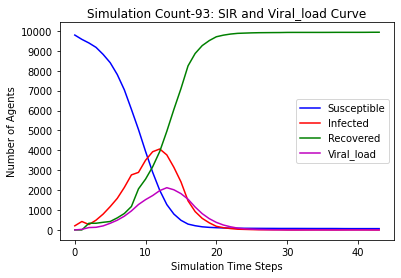

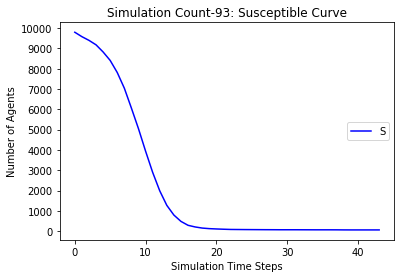

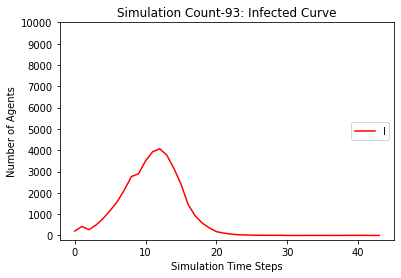

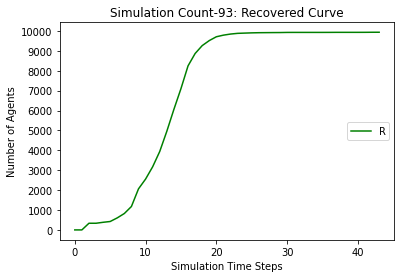

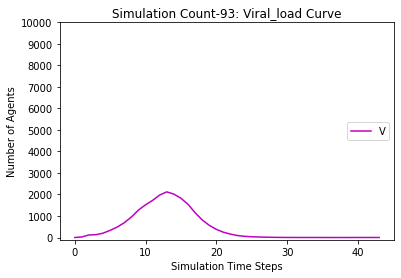

[9794, 9578, 9399, 9168, 8805, 8330, 7647, 6753, 5708, 4611, 3529, 2517, 1649, 1029, 626, 399, 266, 184, 145, 122, 103, 90, 84, 81, 81, 80, 80, 80, 79, 79, 79, 79, 79, 79]
[206, 422, 264, 495, 811, 1248, 1752, 2415, 3097, 3279, 3795, 4051, 4059, 3582, 2903, 2118, 1188, 728, 434, 277, 163, 94, 61, 29, 17, 9, 4, 1, 2, 1, 1, 1, 0, 0]
[0, 0, 337, 337, 384, 422, 601, 832, 1195, 2110, 2676, 3432, 4292, 5389, 6471, 7483, 8546, 9088, 9421, 9601, 9734, 9816, 9855, 9890, 9902, 9911, 9916, 9919, 9919, 9920, 9920, 9920, 9921, 9921]
[0.0, 33.0, 129.5, 141.75, 216.875, 354.4375, 547.21875, 772.609375, 1065.3046875, 1419.65234375, 1710.826171875, 1951.4130859375, 2137.70654296875, 2147.853271484375, 1990.9266357421875, 1730.4633178710938, 1444.2316589355469, 1023.1158294677734, 670.5579147338867, 454.27895736694336, 301.1394786834717, 188.56973934173584, 117.28486967086792, 79.64243483543396, 49.82121741771698, 27.91060870885849, 13.955304354429245, 7.9776521772146225, 3.9888260886073112, 2.994413044

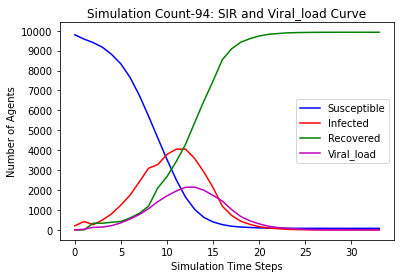

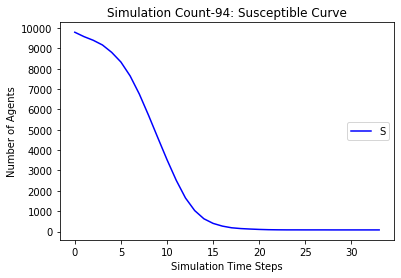

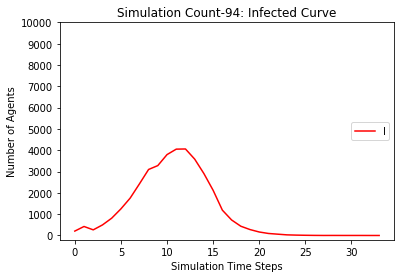

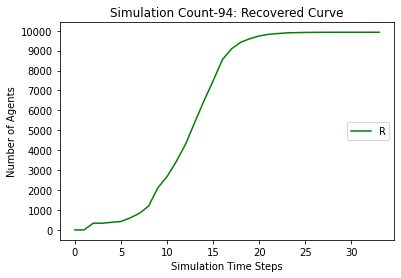

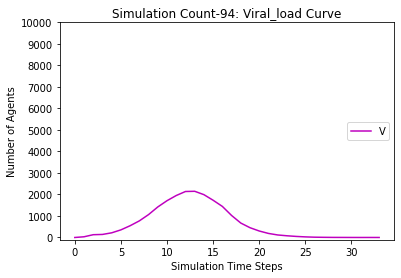

[9794, 9549, 9376, 9148, 8810, 8340, 7678, 6882, 5909, 4873, 3766, 2744, 1905, 1234, 771, 463, 318, 230, 182, 150, 131, 119, 113, 110, 109, 107, 107, 106, 106, 106, 106, 106]
[206, 451, 252, 480, 776, 1209, 1698, 2266, 2901, 3043, 3584, 3950, 4004, 3639, 2995, 2281, 1323, 837, 516, 313, 187, 111, 69, 23, 14, 8, 6, 4, 3, 1, 1, 0]
[0, 0, 372, 372, 414, 451, 624, 852, 1190, 2084, 2650, 3306, 4091, 5127, 6234, 7256, 8359, 8933, 9302, 9537, 9682, 9770, 9818, 9867, 9877, 9885, 9887, 9890, 9891, 9893, 9893, 9894]
[0.0, 34.0, 146.0, 145.0, 202.5, 311.25, 502.625, 719.3125, 1010.65625, 1345.328125, 1550.6640625, 1800.33203125, 1987.166015625, 2099.5830078125, 2066.79150390625, 1803.395751953125, 1501.6978759765625, 1079.8489379882812, 739.9244689941406, 503.9622344970703, 336.98111724853516, 224.49055862426758, 144.2452793121338, 93.1226396560669, 55.56131982803345, 31.780659914016724, 17.890329957008362, 9.945164978504181, 4.9725824892520905, 2.4862912446260452, 1.2431456223130226, 0.621572811

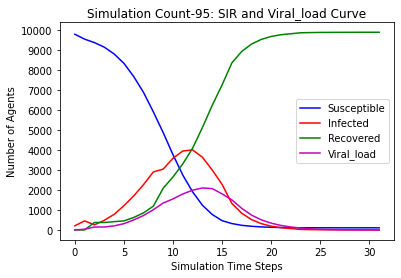

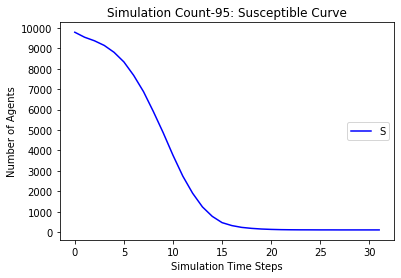

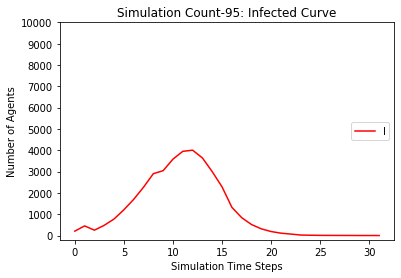

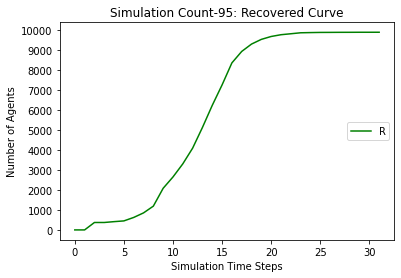

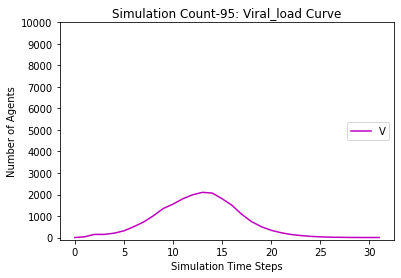

[9794, 9558, 9381, 9163, 8854, 8429, 7788, 6993, 6015, 4962, 3897, 2806, 1888, 1178, 739, 462, 343, 273, 228, 194, 167, 157, 150, 146, 143, 142, 141, 140, 139, 137, 136, 136, 135, 134, 132, 132, 131, 131, 131, 130, 129, 129, 129, 129, 129]
[206, 442, 251, 469, 738, 1129, 1593, 2170, 2839, 3025, 3573, 4021, 4127, 3784, 3158, 2344, 1288, 756, 439, 268, 176, 116, 78, 30, 12, 10, 9, 6, 4, 5, 1, 1, 2, 3, 4, 4, 4, 2, 1, 2, 2, 2, 2, 1, 0]
[0, 0, 368, 368, 408, 442, 619, 837, 1146, 2013, 2530, 3173, 3985, 5038, 6103, 7194, 8369, 8971, 9333, 9538, 9657, 9727, 9772, 9824, 9845, 9848, 9850, 9854, 9857, 9858, 9863, 9863, 9863, 9863, 9864, 9864, 9865, 9867, 9868, 9868, 9869, 9869, 9869, 9870, 9871]
[0.0, 30.0, 125.0, 117.5, 183.75, 344.875, 486.4375, 671.21875, 935.609375, 1300.8046875, 1510.40234375, 1721.201171875, 1924.6005859375, 2103.30029296875, 2047.650146484375, 1808.8250732421875, 1484.4125366210938, 1071.2062683105469, 751.6031341552734, 503.8015670776367, 330.90078353881836, 206.45039176

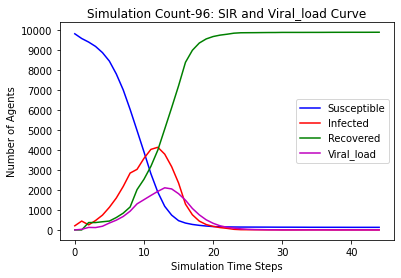

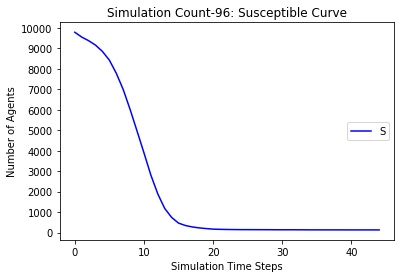

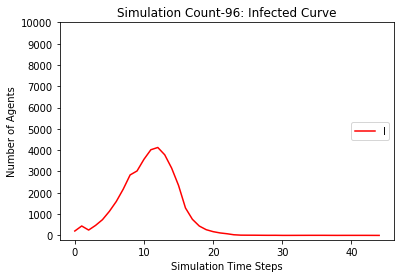

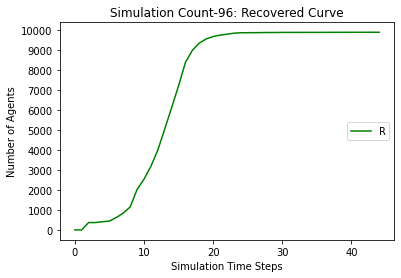

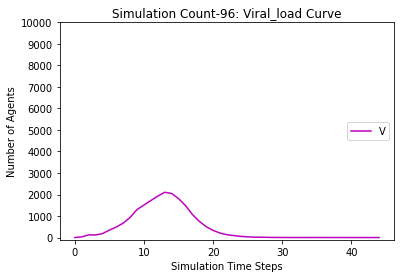

[9794, 9595, 9434, 9236, 8937, 8503, 7890, 7163, 6217, 5225, 4170, 3123, 2139, 1407, 897, 535, 354, 266, 209, 180, 164, 155, 148, 147, 144, 144, 143, 142, 142, 142, 142, 142, 142]
[206, 405, 235, 433, 691, 1092, 1544, 2073, 2720, 2803, 3380, 3850, 4078, 3818, 3273, 2588, 1578, 1017, 625, 355, 190, 111, 61, 27, 17, 10, 5, 5, 2, 2, 1, 0, 0]
[0, 0, 331, 331, 372, 405, 566, 764, 1063, 1972, 2450, 3027, 3783, 4775, 5830, 6877, 8068, 8717, 9166, 9465, 9646, 9734, 9791, 9826, 9839, 9846, 9852, 9853, 9856, 9856, 9857, 9858, 9858]
[0.0, 23.0, 121.5, 123.75, 193.875, 305.9375, 457.96875, 626.984375, 890.4921875, 1223.24609375, 1412.623046875, 1696.3115234375, 1945.15576171875, 2024.577880859375, 2000.2889404296875, 1878.1444702148438, 1609.0722351074219, 1173.536117553711, 833.7680587768555, 588.8840293884277, 396.44201469421387, 253.22100734710693, 157.61050367355347, 91.80525183677673, 53.90262591838837, 30.951312959194183, 18.47565647959709, 11.237828239798546, 9.618914119899273, 5.8094570599

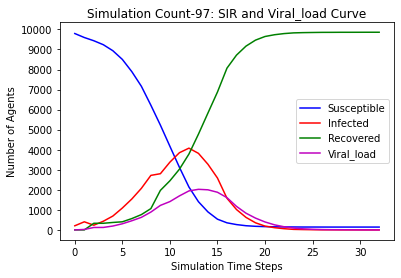

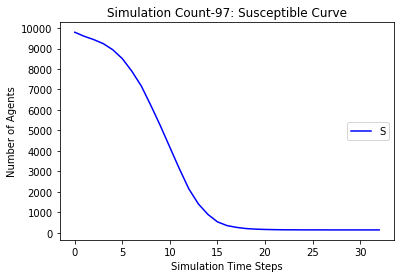

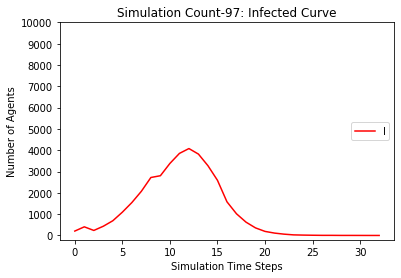

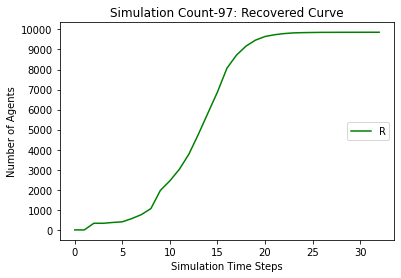

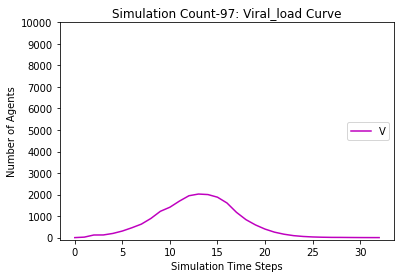

[9794, 9557, 9380, 9167, 8858, 8423, 7804, 7007, 6014, 4957, 3902, 2889, 1998, 1280, 786, 454, 300, 220, 175, 149, 133, 117, 107, 103, 97, 96, 96, 96, 96, 95, 95, 94, 93, 92, 92, 92, 91, 91, 90, 90, 90, 90, 90]
[206, 443, 266, 479, 740, 1134, 1576, 2160, 2844, 3030, 3583, 3944, 4016, 3677, 3116, 2435, 1463, 921, 548, 305, 167, 103, 68, 32, 27, 17, 11, 7, 1, 1, 1, 2, 3, 3, 3, 2, 2, 1, 2, 2, 1, 1, 0]
[0, 0, 354, 354, 402, 443, 620, 833, 1142, 2013, 2515, 3167, 3986, 5043, 6098, 7111, 8237, 8859, 9277, 9546, 9700, 9780, 9825, 9865, 9876, 9887, 9893, 9897, 9903, 9904, 9904, 9904, 9904, 9905, 9905, 9906, 9907, 9908, 9908, 9908, 9909, 9909, 9910]
[0.0, 29.0, 122.5, 127.25, 186.625, 317.3125, 489.65625, 683.828125, 967.9140625, 1278.95703125, 1483.478515625, 1748.7392578125, 1964.36962890625, 2106.184814453125, 2089.0924072265625, 1928.5462036132812, 1614.2731018066406, 1155.1365509033203, 826.5682754516602, 544.2841377258301, 334.14206886291504, 220.07103443145752, 143.03551721572876, 91.517

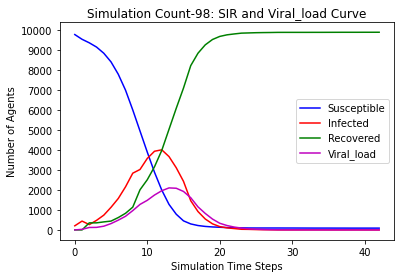

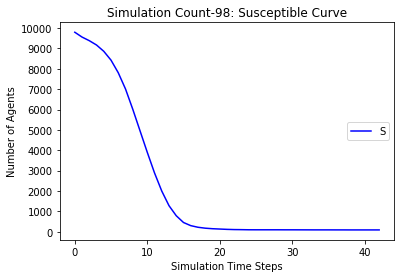

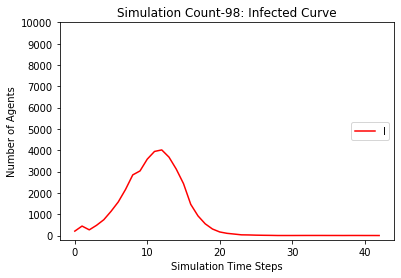

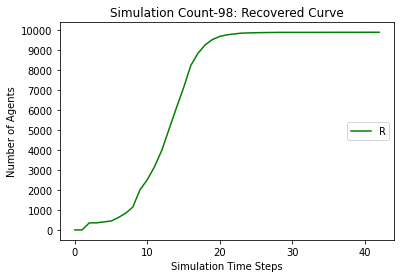

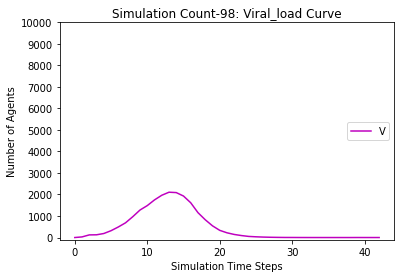

[9794, 9551, 9377, 9165, 8831, 8350, 7704, 6857, 5796, 4716, 3642, 2615, 1746, 1055, 657, 408, 277, 213, 175, 147, 128, 116, 109, 106, 105, 102, 102, 102, 102, 102, 102, 102]
[206, 449, 255, 467, 760, 1201, 1673, 2308, 3035, 3156, 3709, 4049, 4050, 3661, 2985, 2207, 1293, 736, 438, 261, 149, 97, 66, 28, 16, 12, 7, 4, 3, 0, 0, 0]
[0, 0, 368, 368, 409, 449, 623, 835, 1169, 2128, 2649, 3336, 4204, 5284, 6358, 7385, 8430, 9051, 9387, 9592, 9723, 9787, 9825, 9866, 9879, 9886, 9891, 9894, 9895, 9898, 9898, 9898]
[0.0, 25.0, 130.5, 140.25, 221.125, 347.5625, 518.78125, 742.390625, 1060.1953125, 1414.09765625, 1581.048828125, 1782.5244140625, 1973.26220703125, 2060.631103515625, 1971.3155517578125, 1765.6577758789062, 1484.8288879394531, 1069.4144439697266, 736.7072219848633, 492.35361099243164, 308.1768054962158, 196.0884027481079, 122.04420137405396, 82.02210068702698, 49.01105034351349, 32.505525171756744, 17.252762585878372, 10.626381292939186, 5.313190646469593, 3.6565953232347965, 1.8282

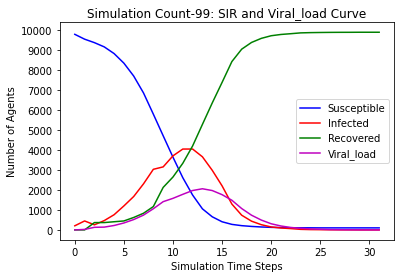

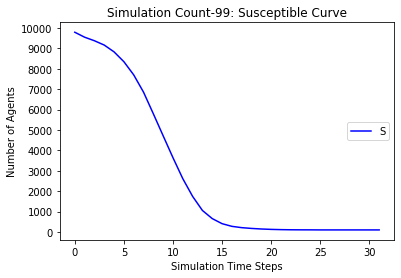

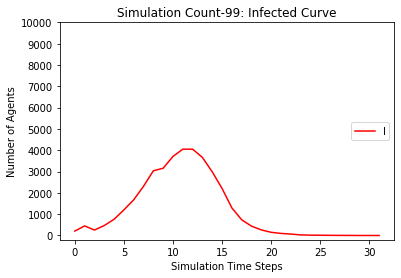

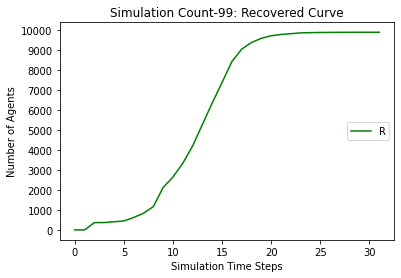

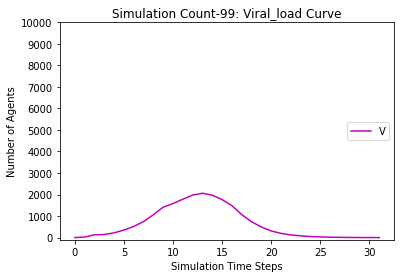

[9794, 9547, 9361, 9120, 8745, 8258, 7604, 6719, 5685, 4620, 3607, 2612, 1786, 1149, 706, 435, 298, 214, 160, 135, 118, 111, 105, 103, 102, 101, 101, 100, 100, 100, 100, 100]
[206, 453, 281, 522, 848, 1289, 1757, 2401, 3060, 3205, 3668, 3935, 3899, 3471, 2901, 2177, 1295, 821, 500, 300, 180, 103, 55, 26, 12, 8, 4, 3, 2, 1, 0, 0]
[0, 0, 358, 358, 407, 453, 639, 880, 1255, 2175, 2725, 3453, 4315, 5380, 6393, 7388, 8407, 8965, 9340, 9565, 9702, 9786, 9840, 9871, 9886, 9891, 9895, 9897, 9898, 9899, 9900, 9900]
[0.0, 33.0, 134.5, 145.25, 226.625, 373.3125, 564.65625, 800.328125, 1075.1640625, 1369.58203125, 1533.791015625, 1768.8955078125, 1959.44775390625, 2076.723876953125, 1958.3619384765625, 1729.1809692382812, 1422.5904846191406, 1076.2952423095703, 757.1476211547852, 514.5738105773926, 335.2869052886963, 213.64345264434814, 133.82172632217407, 76.91086316108704, 42.45543158054352, 22.22771579027176, 12.11385789513588, 6.05692894756794, 4.02846447378397, 2.014232236891985, 1.0071161184

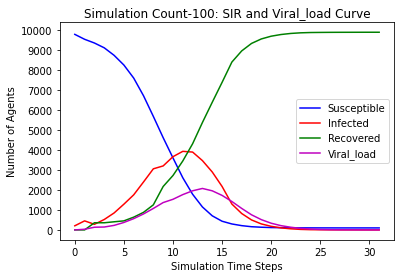

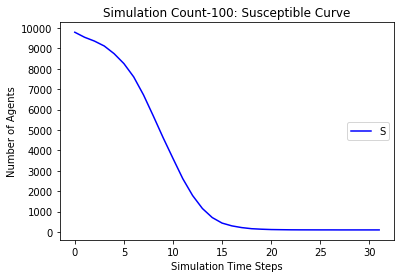

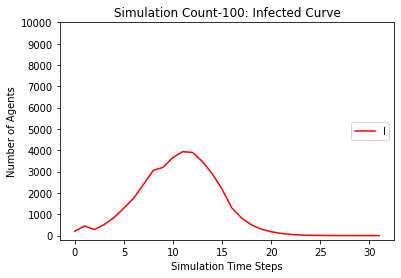

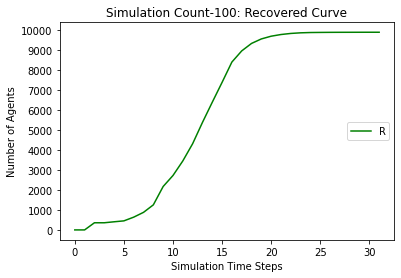

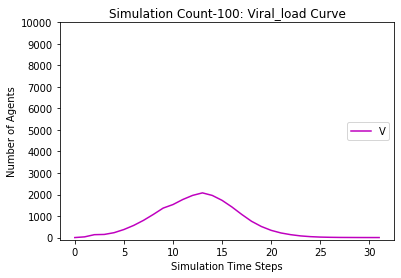

In [10]:
SS,II,RR,VV,TT = [[]],[[]],[[]],[[]],[[]]
for i in range(100):
  j=0
  count_timestep=0
  Node_p=Node.copy()
  Node_n=Node.copy() 
  Agent_p=Agent.copy()
  Agent_n=Agent.copy()
  num_tests_p=NUM_TESTS
  num_tests_n=NUM_TESTS 
  Sj,Ij,Rj,ISOLATED_Sj,ISOLATED_Ij,Vj = Count_SIR_Node(Node_n) 
  #print([Sj,Ij,Rj]) 
  S,I,R,V,T = [],[],[],[],[]
  S.append(Sj)
  I.append(Ij)
  R.append(Rj)
  V.append(Vj)
  T.append(j)

  while Ij > 0 or Vj >= 1 :
    Node_p,Node_n,Agent_p,Agent_n,num_tests_n = random_walk(Graph,GraphN,Node_n,Agent_n,1,1,num_tests_n)
    count_timestep=count_timestep+1
    if count_timestep == 7:
      num_tests_n = NUM_TESTS
      count_timestep=0
    #if num_tests_n < K/100:
    #  num_tests_n = NUM_TESTS
    j+=1 
    Sj,Ij,Rj,ISOLATED_Sj,ISOLATED_Ij,Vj = Count_SIR_Node(Node_n) 
    S.append(Sj)
    I.append(Ij)
    R.append(Rj)
    V.append(Vj)
    T.append(j)
    
  print(S)
  print(I)
  print(R)
  print(V)
  print(num_tests_n)
  SS.append(S)
  II.append(I)
  RR.append(R)
  VV.append(V)
  TT.append(T)
  print(SS)
  print(II)
  print(RR)
  print(VV)
  plt.plot(T, S, 'b', T, I, 'r', T, R, 'g',T, V, 'm')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': SIR and Viral_load Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Susceptible", "Infected", "Recovered", "Viral_load"),loc='center right')
  plt.show()  
  
  plt.plot(T, S, 'b')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Susceptible Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Susceptible"),loc='center right')
  plt.show()

  plt.plot(T, I, 'r')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Infected Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Infected"),loc='center right')
  plt.show()

  plt.plot(T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Recovered Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Recovered"),loc='center right')
  plt.show()  

  plt.plot(T, V, 'm')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Viral_load Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Viral_load"),loc='center right')
  plt.show()  

Susceptible Average (100 Simulations): [9794, 9559.098754899676, 9385.66685505251, 9173.781552486154, 8851.39264106879, 8392.518244089426, 7757.2110096394335, 6942.641710212002, 5922.143868451783, 4862.292844705775, 3794.5694718118502, 2764.820684225175, 1873.4673362247672, 1171.1281634614104, 729.3493582495713, 441.37354278083313, 298.0659015616863, 225.3863529070254, 182.27099255697567, 154.18492110803143, 135.86702950090913, 123.35315597934712, 115.62474058000934, 112.5488770438788, 109.90465325112183, 107.99233315236286, 107.77048189985476, 107.52825099782335, 107.4260294639206, 107.03489278400161, 106.96694348522962]
Infected Average(100 Simulations): [206, 440.9012451003239, 255.20756409830693, 467.09286666466306, 746.5833265006753, 1166.5805108102504, 1628.4558454130774, 2231.139842274152, 2929.248772617008, 3067.9045533436583, 3623.2434355609653, 3991.77380581166, 4048.6765322270157, 3691.164681244364, 3065.220113562279, 2323.4471414443415, 1371.991811775016, 824.1235369662243,

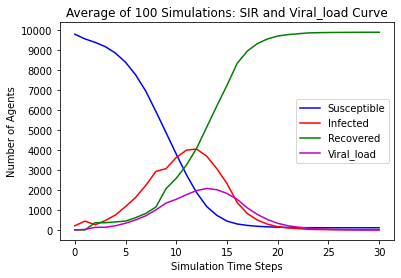

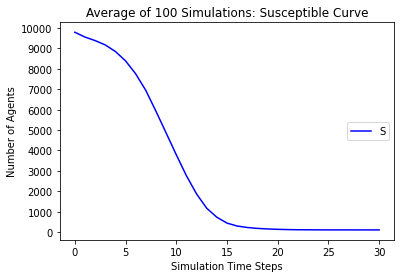

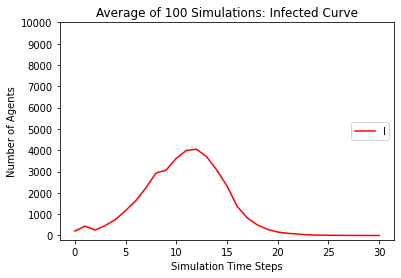

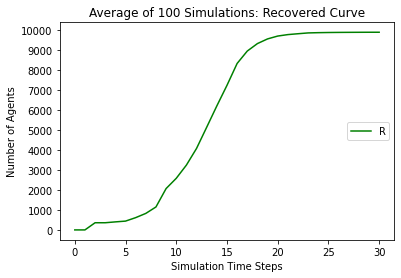

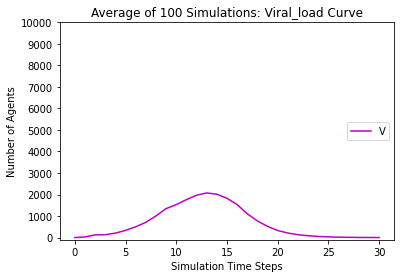

In [11]:
SC = SS[1]
IC = II[1]
RC = RR[1]
VT = VV[1]
TC = TT[1]
for i in range(2,100):
  SC = [mean(i) for i in zip(SC,SS[i])] 
  IC = [mean(i) for i in zip(IC,II[i])] 
  RC = [mean(i) for i in zip(RC,RR[i])] 
  VT = [mean(i) for i in zip(VT,VV[i])] 
  TC = [mean(i) for i in zip(TC,TT[i])] 

print("Susceptible Average (100 Simulations):", SC)
print("Infected Average(100 Simulations):", IC)
print("Recovered Average(100 Simulations):", RC)
print("Viral_load Average(100 Simulations):", VT) 
print("Time Steps:", TC) 



plt.plot(TC, SC, 'b', TC, IC, 'r', TC, RC, 'g', TC, VT, 'm')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: SIR and Viral_load Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Susceptible", "Infected", "Recovered", "Viral_load"),loc='center right')
plt.show()  
  
plt.plot(TC, SC, 'b')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Susceptible Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Susceptible"),loc='center right')
plt.show()

plt.plot(TC, IC, 'r')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Infected Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))

plt.legend(("Infected"),loc='center right')
plt.show()

plt.plot(TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Recovered Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Recovered"),loc='center right')
plt.show()  

plt.plot(TC, VT, 'm')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Viral_load Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Viral_load"),loc='center right')
plt.show() 



  
